## Project 1: Random Graphs and Random Walks

- William Nafack (405725778)
- Lea Alcantara (005872120)
- Gaurav Singh (305353434)

In [ ]:
# install.packages("igraph")
# install.packages("pracma")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [ ]:
library('igraph')
library('Matrix')
library('pracma')

install.packages('matrixStats')
library(matrixStats)

In [ ]:
# library(help="igraph")

### Generating random networks

### Question 1
#### (a)

In [ ]:
edge_p <- c(0.003, 0.004, 0.01, 0.05, 0.1)
n = 1000

[1] "Mean of degree distribution for p = 0.003 is 3.028"
[1] "Variance of degree distribution for p = 0.003 is 2.98820420420418"
[1] "Is graph connected for p = 0.003 :: FALSE"
[1] "Numerical estimation for connectedness for p =  0.003 :: 0"
[1] "For p =  0.003 GCC exists:: TRUE"
[1] "For p =  0.003 Diameter of GCC:: 15"


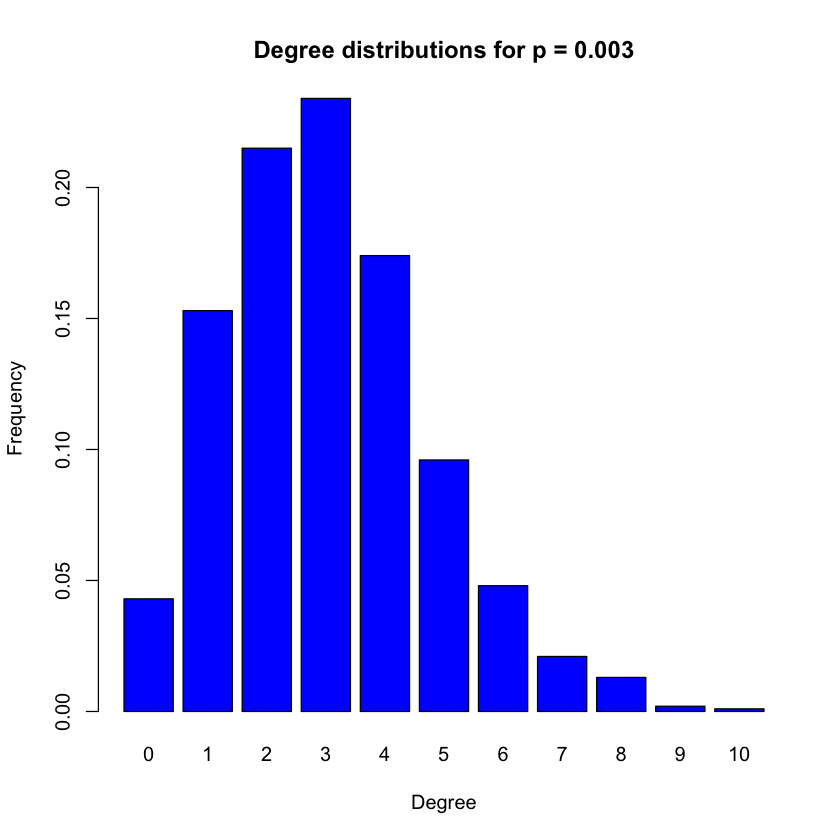

[1] "Mean of degree distribution for p = 0.004 is 3.996"
[1] "Variance of degree distribution for p = 0.004 is 3.93792192192194"
[1] "Is graph connected for p = 0.004 :: FALSE"
[1] "Numerical estimation for connectedness for p =  0.004 :: 0"
[1] "For p =  0.004 GCC exists:: TRUE"
[1] "For p =  0.004 Diameter of GCC:: 11"


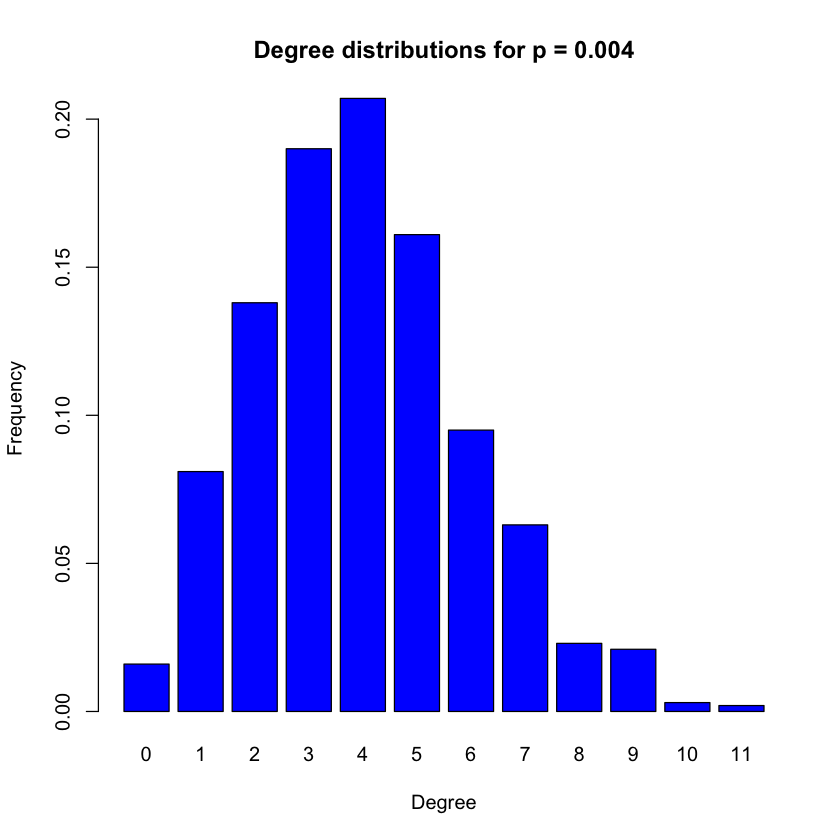

[1] "Mean of degree distribution for p = 0.01 is 9.972"
[1] "Variance of degree distribution for p = 0.01 is 9.65286886886888"
[1] "Is graph connected for p = 0.01 :: TRUE"
[1] "Numerical estimation for connectedness for p =  0.01 :: 0.946"
[1] "For p =  0.01 GCC exists:: TRUE"
[1] "For p =  0.01 Diameter of GCC:: 5"


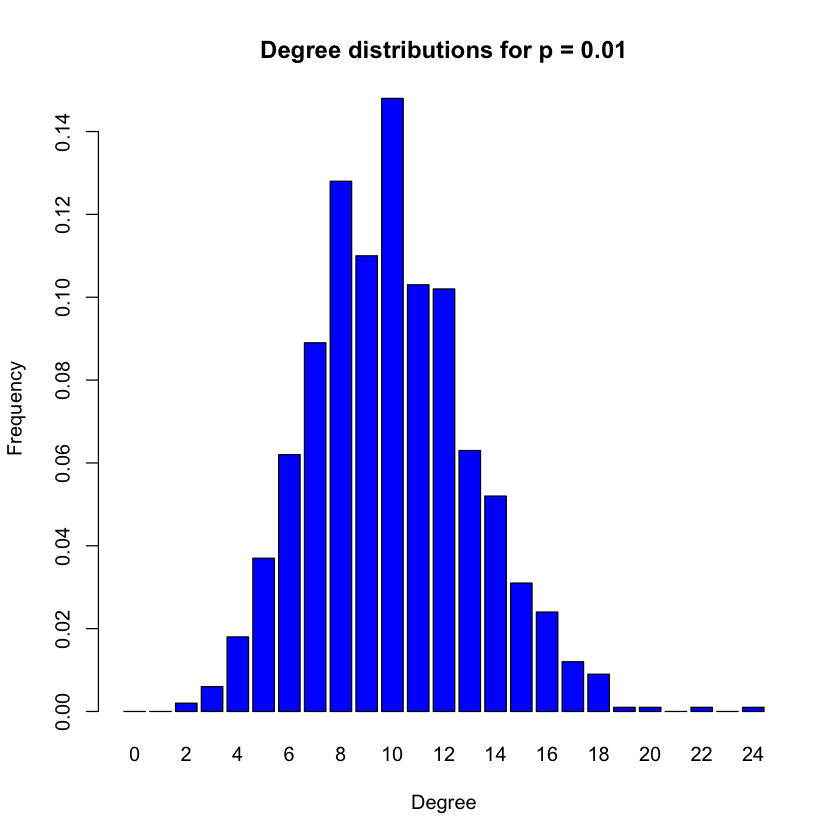

[1] "Mean of degree distribution for p = 0.05 is 49.648"
[1] "Variance of degree distribution for p = 0.05 is 47.2793753753754"
[1] "Is graph connected for p = 0.05 :: TRUE"
[1] "Numerical estimation for connectedness for p =  0.05 :: 1"
[1] "For p =  0.05 GCC exists:: FALSE"
[1] "For p =  0.05 Diameter of GCC:: FALSE"


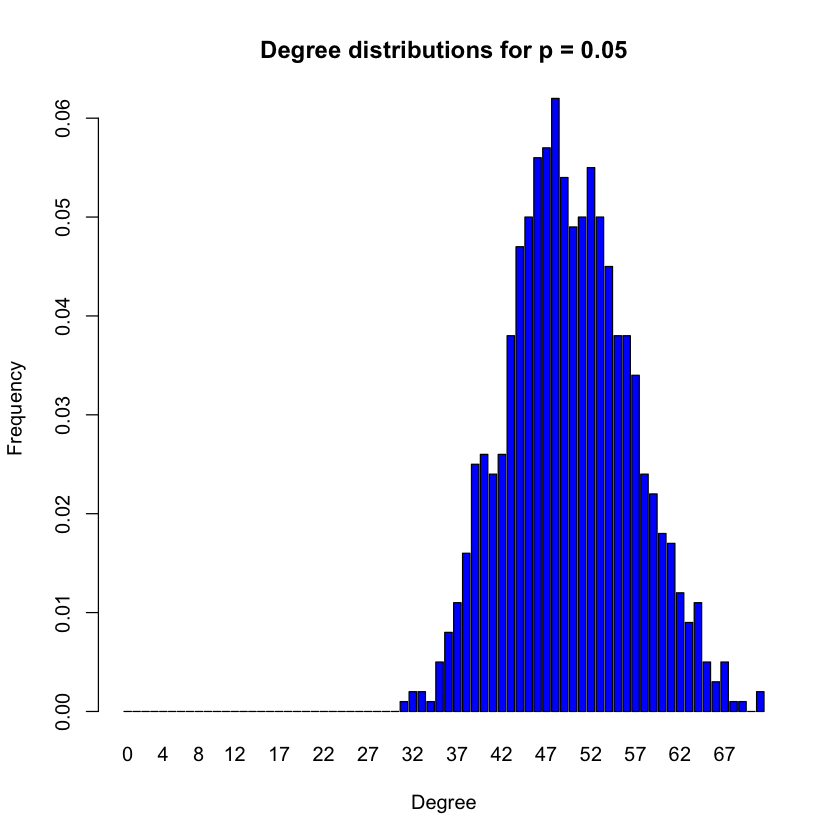

[1] "Mean of degree distribution for p = 0.1 is 99.63"
[1] "Variance of degree distribution for p = 0.1 is 86.5656656656657"
[1] "Is graph connected for p = 0.1 :: TRUE"
[1] "Numerical estimation for connectedness for p =  0.1 :: 1"
[1] "For p =  0.1 GCC exists:: FALSE"
[1] "For p =  0.1 Diameter of GCC:: FALSE"


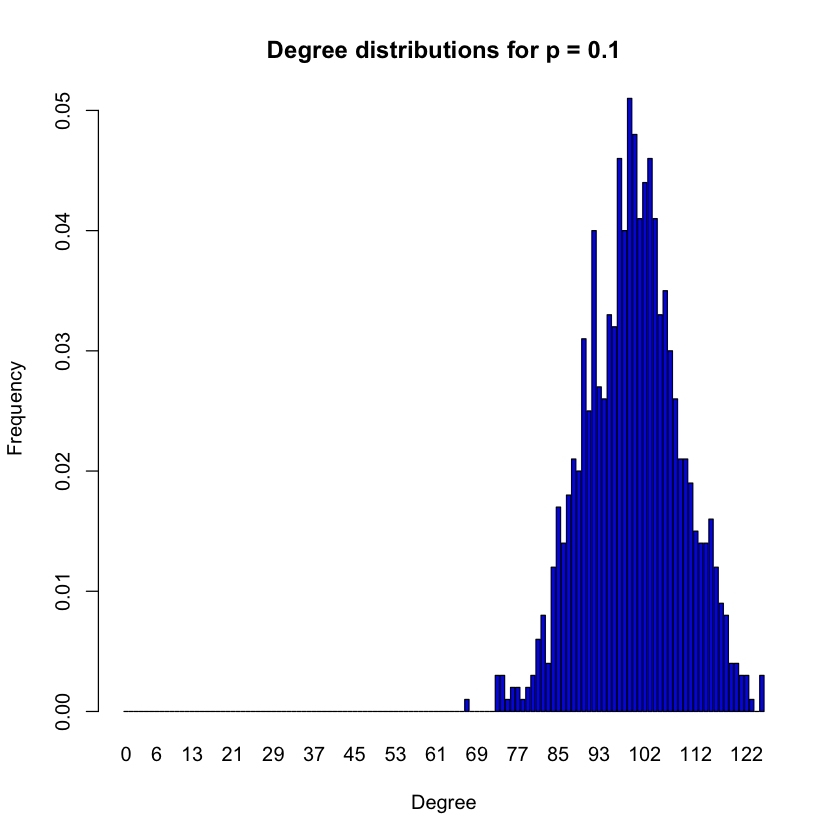

In [ ]:
for (p in  edge_p){
    g = sample_gnp(n, p, directed = FALSE)
    d_dist = degree.distribution(g)
    xVals = c(0: (length(d_dist) - 1))
    barplot(d_dist, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions for p =", p, sep = " "), col="blue")
    
    print(paste("Mean of degree distribution for p =", p, "is",  mean(degree(g)), collapse = NULL), mean(d_dist))
    print(paste("Variance of degree distribution for p =", p, "is", var(degree(g)), collapse = NULL))
    print(paste("Is graph connected for p =", p, "::", is_connected(g)))
    
    # Part 1 (b) Numerical estimation
    connectedCount = 0
    
    #Finding one GCC for different p values.
    gccFound <- FALSE
    diaGCC <- FALSE
    for(i in c(1:1000)) {
        temp_g = sample_gnp(n, p, directed = FALSE)
        if(is_connected(temp_g)) {
            connectedCount = connectedCount + 1
        } else if(!gccFound) {
            gccFound = TRUE
            comps = clusters(temp_g)
            idx = which.max(comps$csize)
            giant = induced.subgraph(temp_g, which(comps$membership == idx))
            diaGCC <- diameter(giant, directed=FALSE)
        }
    }
    print(paste("Numerical estimation for connectedness for p = ", p, "::", connectedCount/1000))
    print(paste("For p = ", p, "GCC exists::", gccFound))
    print(paste("For p = ", p, "Diameter of GCC::", diaGCC))
}


#### Answer 1(a)

The degree distributions with p = 0.003, 0.004, 0.01, 0.05, and 0.1 are plotted above. 
p is the probability to draw an edge in the Erdos-Renyi network.

For Erdos-Renyi networks the degree - distribution observed is Binomial distribution and is evident from the plots above. The degree distribution takes binomial form because in this netowork there is a probability to draw an edge between two vertices and hence it's probabilistic where p is probability to draw an edge and (1 - p) to not draw an edge.

Binomial distribution is given by:

<center> $P(X = r) = {N \choose r} p^{r}(1 - p)^{N - r}$ </center>

Mean and Variance for different p values:

Theoretical values: Mean = np, Variance = np(1-p)

1). p = 0.003 </br>
    Mean: 3.028</br>
    Variance: 2.98820420420418</br>
    Theoretical Mean: 3</br>
    Theoretical Variance: 2.991

2). p = 0.004</br>
    Mean: 3.996</br>
    Variance: 3.93792192192194</br>
    Theoretical Mean: 4</br>
    Theoretical Variance: 3.984</br>

3). p = 0.01</br>
    Mean: 9.972</br>
    Variance: 9.65286886886888</br>
    Theoretical Mean: 10</br>
    Theoretical Variance: 9.900</br>

4). p = 0.05</br>
    Mean: 49.648</br>
    Variance: 47.2793753753754</br>
    Theoretical Mean: 50</br>
    Theoretical Variance: 47.500</br>

5). p = 0.1</br>
    Mean: 99.63</br>
    Variance: 86.5656656656657</br>
    Theoretical Mean: 100</br>
    Theoretical Variance: 90.000</br>
    
We can see the theoretical and experimental values for mean and variance are quite comparable.

We can see that as p increases the variance increases as well from the above plots. This is because variance = np(1 - p) which increases with p.

Also we can see that for small p values, the degree distributions are skewed towards right and look more like Poisson distribution this is because with small p, the mean (np) is small and mean << N (1000) which makes the distribution shift towards Poisson. Later as p increases, this skewness is reduced and Binomial distribution is observed as seen in plots.


#### Answer 1(b)

For p = 0.003 and p = 0.004 the graph is not connected and for p = 0.01, 0.05, 0.1 it is connected.

For a disconneted graph, the component with greated number of vertices is called GCC.


To numerically estimate the probability of connectedness, for same p, the connectedness is measured over 1000 simulations of the network and is averaged. Also the diameter of GCC if found is given below for different p values

The results are as follow:

1). p = 0.003 </br>
    Probability of connectedness : 0  </br>
    Diameter of GCC: 15</br>

2). p = 0.004</br>
    Probability of connectedness : 0</br>
    Diameter of GCC: 11</br>
    
3). p = 0.01</br>
    Probability of connectedness : 0.946</br>
    Diameter of GCC: 5</br>

4). p = 0.05</br>
    Probability of connectedness : 1</br>
    Diameter of GCC: No GCC found. Graph is always connected</br>
    
5). p = 0.1</br>
    Probability of connectedness : 1</br>
    Diameter of GCC: No GCC found. Graph is always connected</br>
    
    
The diameter of GCC is approximately:

<center>$D \approx \frac{ln(n)}{ln(np)}$, where n is number of nodes</center>

We can see that as p increases the diameter is decreasing from above results which is complying with the approximation.

For p = ln(1000) / 1000 ~ 0.007, the Erdos-Renyi network starts to be fully connected which we can see from above results, the probability of connected for p = 0.01 is 0.946 which is quite close to full connected.

### Question 1 (c)

In [ ]:
# Critical points:

point1 = 1 / n
point2 = log(n) / n

In [ ]:
print(paste("First Critical p value: ", point1))
print(paste("Second Critical p value: ", point2))

[1] "First Critical p value:  0.001"
[1] "Second Critical p value:  0.00690775527898214"


From above results we can see that at P = 0.01, GCC takes around 95 % of vertices, and for P = 0.05, there are no disconnected components remaining in the graph.

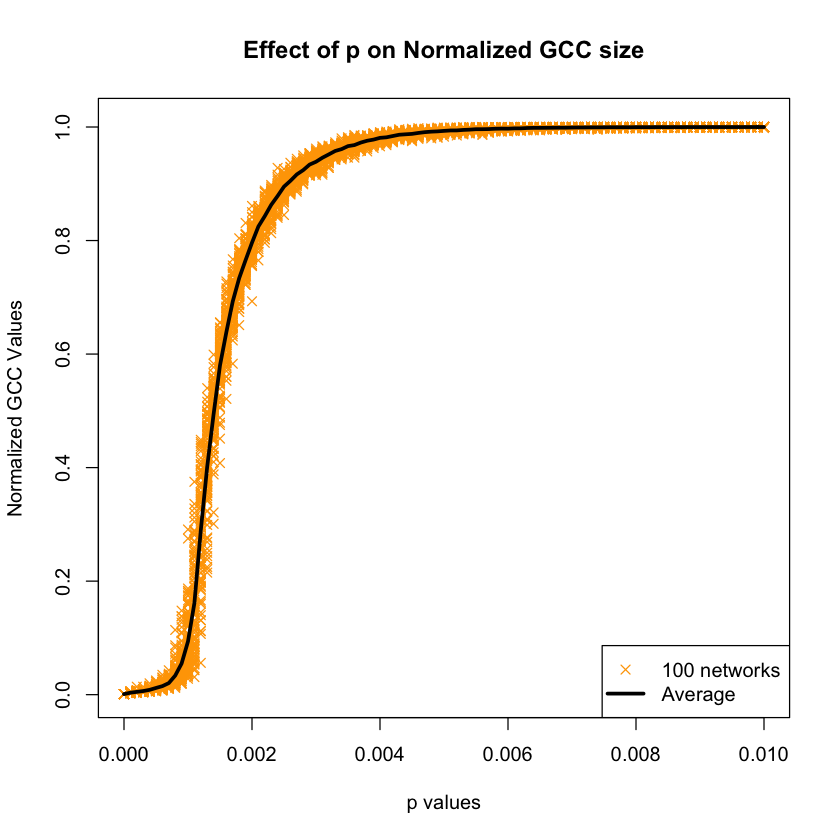

In [ ]:
p_sweep = seq(0, 0.01, 0.0001)
avgVals = rep(0, length(p_sweep))

j <- 1
plot(1, type = "n", xlab = "p values",
     ylab = "Normalized GCC Values", xlim = c(0, 0.01),
     main = "Effect of p on Normalized GCC size",
     ylim = c(0, 1.01))


for (p in p_sweep) {
    total = 0
    for (i in c(1:100)) {
        g = sample_gnp(n, p, directed = FALSE)
        comps = clusters(g)
        sz = max(comps$csize)
        normalizedGCC = sz / n
        total = total + normalizedGCC
        points(p, normalizedGCC, col= 'orange', pch=4)
    }
    avgVals[j] = total / 100
    j <- j + 1
}

lines(p_sweep, avgVals, lwd=3.0)

legend(x = "bottomright",
       legend = c("100 networks", "Average"),  
       pch = c(4, NA),           
       lty = c(NA, 1),           
       lwd = c(NA, 3.0),
       col = c("orange", 1)
      )

#### Answer 1(c)

The sweep over p is done in the range of 0 to 0.01. 0.01 is chosen from part 1(b) as we can see at this value the graph is almost fully connected. The approach to arrive at this value is derived in part 1(b).

1). The value of p for which GCC starts to appear theoretically is given by ~ (1/ 1000) = 0.001. 
This value is quite close to the empirical results, we can see that as p increases from 0, the Normalized GCC size is at 0 for some increases in p and then attains some non- zero value when p ~ 0.0011 which matches with the theoretical results. 

2). Theoretically, the value of p where the graph starts to be fully connected is given by: ln(1000)/1000 ~ 0.0069.
From the plot above we can see that at p = 0.007 the Normalized GCC size is almost flat indicating, full connectednes which is quite close to the theoretical value of 0.0069.

Also we can see that around p = 0.005 the normalized GCC values start to tend towards 1 at which point roughly about 99% of the nodes are connected. 

### Question 1(d)
#### (I)

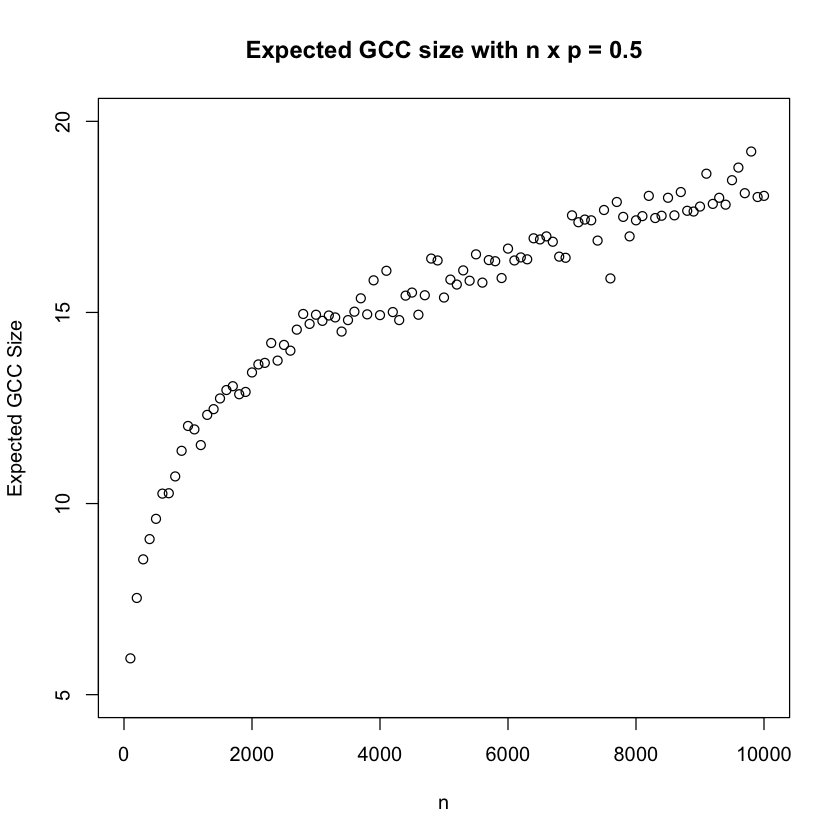

In [ ]:
n_sweep = seq(100, 10000, 100)

plot(1, type = "n", xlab = "n",
     ylab = "Expected GCC Size", xlim = c(0, 10000), ylim = c(5, 20),
     main = "Expected GCC size with n x p = 0.5")

for (i in n_sweep) {
    p = 0.5 / i
    #Expected value calculation
    total = 0
    for (j in c(1:100)) {
        g = sample_gnp(i, p, directed = FALSE)
        comps = clusters(g)
        sz = max(comps$csize)
        total = total + sz
    }
    expected_val = total / 100
    points(i, expected_val, col= 'black')
}

#### Answer 1 (d) - i

In this question, c = np = 0.5 is kept fixed and n is sweeped from 100 -> 10000 at intervals of 100.
For each value of n, we performed 100 experiments to get the expected GCC size and the results are plotted in figure above.

From the figure we can see that as n increases the expected GCC size is increasing and the rate of increase is very high for n in range [0, 2000], then the rate decreases and the expected GCC size tends to attain a constant value. This is expected because as n is increasing, p decreases which makes the Erdos Renyi networks to have not more than O(ln(n)) as GCC size.

#### (II)

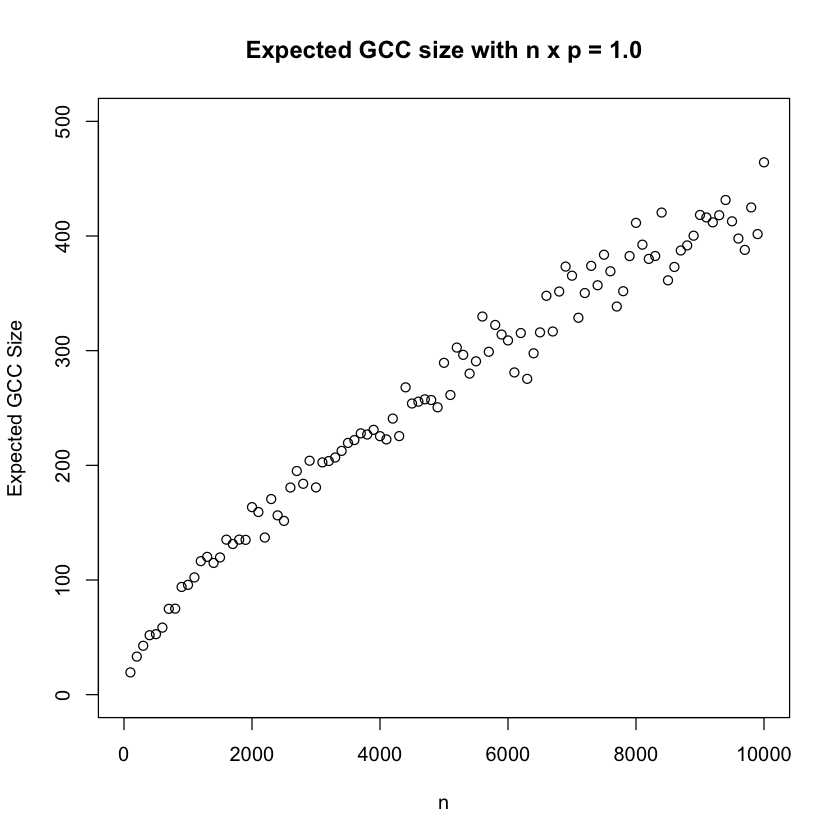

In [ ]:
n_sweep = seq(100, 10000, 100)

plot(1, type = "n", xlab = "n",
     ylab = "Expected GCC Size", xlim = c(0, 10000), ylim = c(0, 500),
     main = "Expected GCC size with n x p = 1.0")

for (i in n_sweep) {
    p = 1 / i
    #Expected value calculation
    total = 0
    for (j in c(1:100)) {
        g = sample_gnp(i, p, directed = FALSE)
        comps = clusters(g)
        sz = max(comps$csize)
        total = total + sz
    }
    expected_val = total / 100
    points(i, expected_val, col= 'black')
}

#### Answer 1 (d) - ii

In this question, c = np = 1 is kept fixed and n is sweeped from 100 -> 10000 at intervals of 100.

For each value of n, we performed 100 experiments to get the expected GCC size and the results are plotted in figure above.

From the figure we can see that as n increases the expected GCC size is increasing and the rate of increase higher as compared to for c = 0.5. It is also observed that the range of the expected size of GCC is much higher [0, 500] as compared to for c = 0.5. This is because the expected size of GCC for ER networks depends on np which is high compared to previous question.

#### (III)

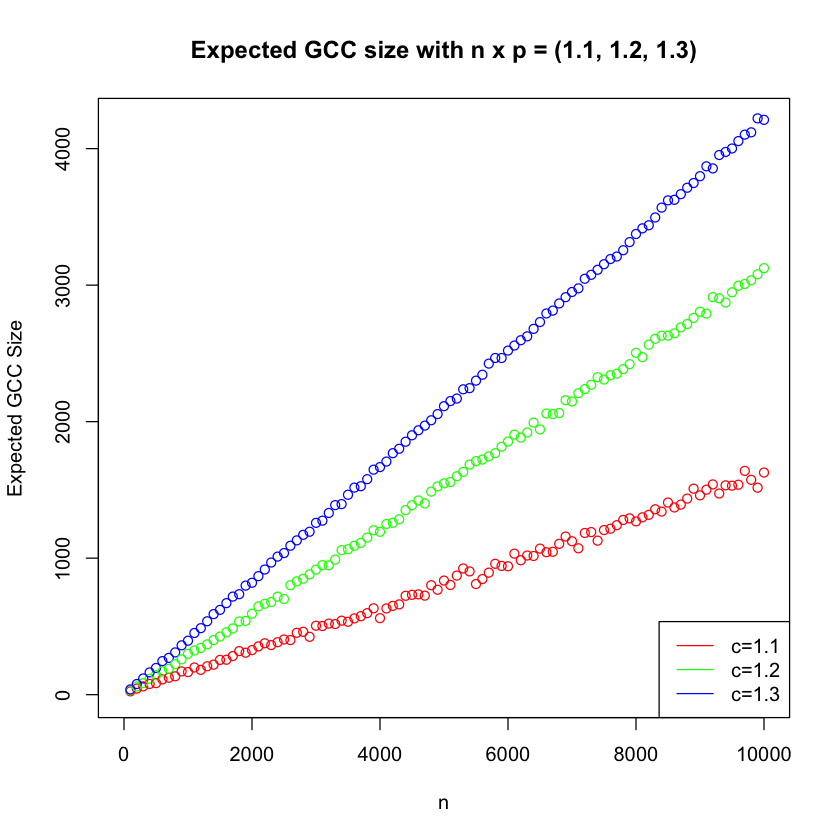

In [ ]:
n_sweep <- seq(100, 10000, 100)

c_sweep <- c(1.1, 1.2, 1.3)
colors <- c("red", "green", "blue")

plot(1, type = "n", xlab = "n",
     ylab = "Expected GCC Size", xlim = c(0, 10000), ylim = c(0, 4200),
     main = "Expected GCC size with n x p = (1.1, 1.2, 1.3)")

for (i in n_sweep) {
    for (k in (1 : length(c_sweep))) {
        p = c_sweep[k] / i
        #Expected value calculation
        total = 0
        for (j in c(1:100)) {
            g = sample_gnp(i, p, directed = FALSE)
            comps = clusters(g)
            sz = max(comps$csize)
            total = total + sz
        }
        expected_val = total / 100
        points(i, expected_val, col= colors[k])
    }
}

legend(x = "bottomright",
       legend = c("c=1.1", "c=1.2", "c=1.3"),             
       lty = c(1, 1, 1),           
       col = c("red", "green", "blue")
      )

#### Answer 1 (d) - iii

The experiment is repeated for c = 1.1, 1.2, 1.3 and the results are shown in plot above. 

#### Answer 1 (d) - iv

From the plot abov, we can see that as c is increasing the range of expected size of GCC is increasing also the rate of increase is high for higher values of c. 

From the plots above we can estimate the relationship between expected value of GCC and the n as follows:

E(GCC) for c = 0.5 ~ O(ln(n)) (approximately logrithmic since the GCC size becomes almost constant as n increases)

E(GCC) for c = 1 ~ O($n^{x}$) where x < 1 (approx. between 0.5 - 0.8) since the rate of increase is quite low for high values of n.

E(GCC) for c = [1.1, 1.2, 1.3]. O(n) since the plot is almost linear.

### Question 2:
#### Creating networks using preferential attachment model

##### (a)

[1] "Fraction of networks which are connected: 1"


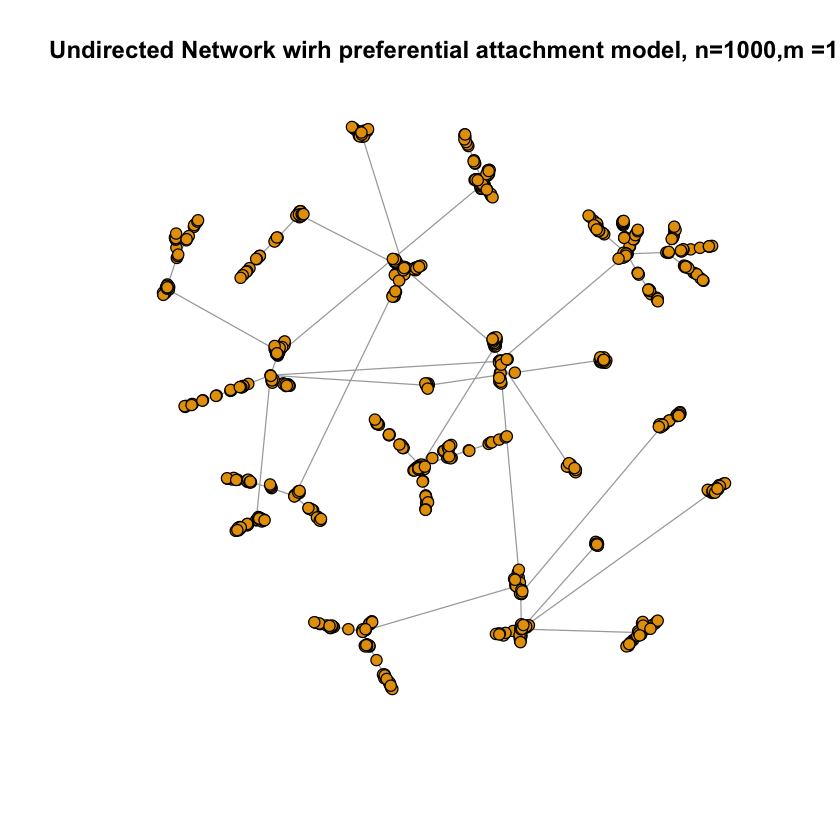

In [ ]:
t_conn <- 0
for (i in c(1 : 100)) {
    g <- sample_pa(n = 1000, m = 1, directed = FALSE)
    if(i == 1) {
        plot(g, vertex.label = "", vertex.size = 4, main = "Undirected Network wirh preferential attachment model, n=1000,m =1")
    }
    if(is_connected(g)) {
        t_conn <- t_conn + 1
    }
}

print(paste("Fraction of networks which are connected:", t_conn / 100))


#### Answer 2(a)

Preferential attachment networks are contructed in incremental basis with each new node at time step (t) gets connected to m no. of previously added nodes. Such a network will always be connected since every new node has to connect to (m >= 1) no. of existing nodes, and hence there will always be a path between any two nodes in the undirected network. 

This is verified from experiment above where we created 100 PA networks with 1000 nodes each and found that all 100 of them are connected.

##### (b)

[1] "Modularity for PA model with n = 1000, m = 1: 0.930820710600493"


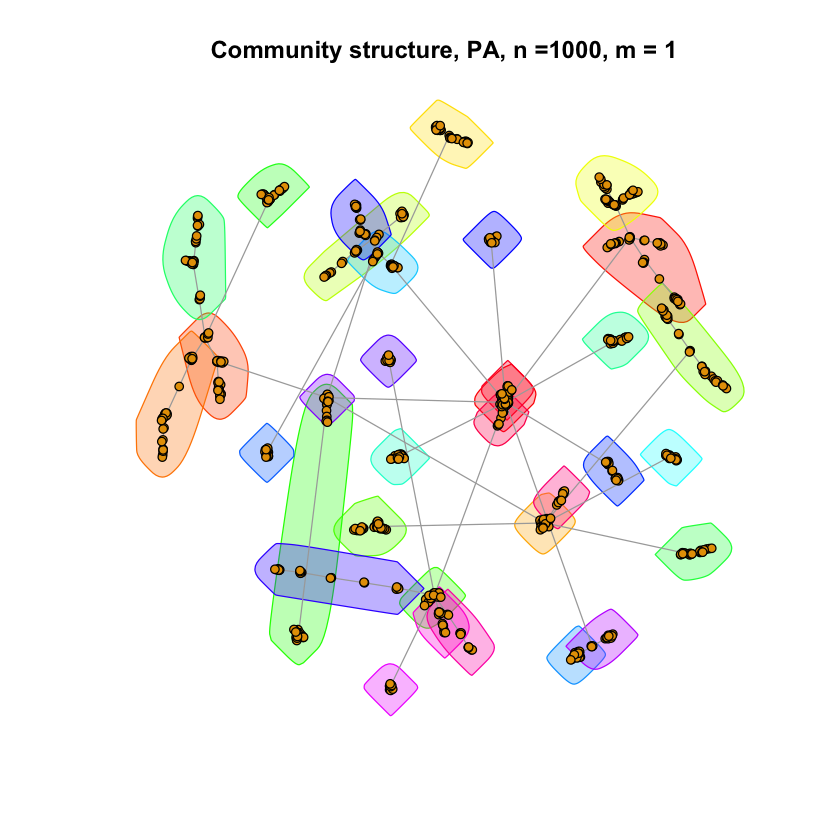

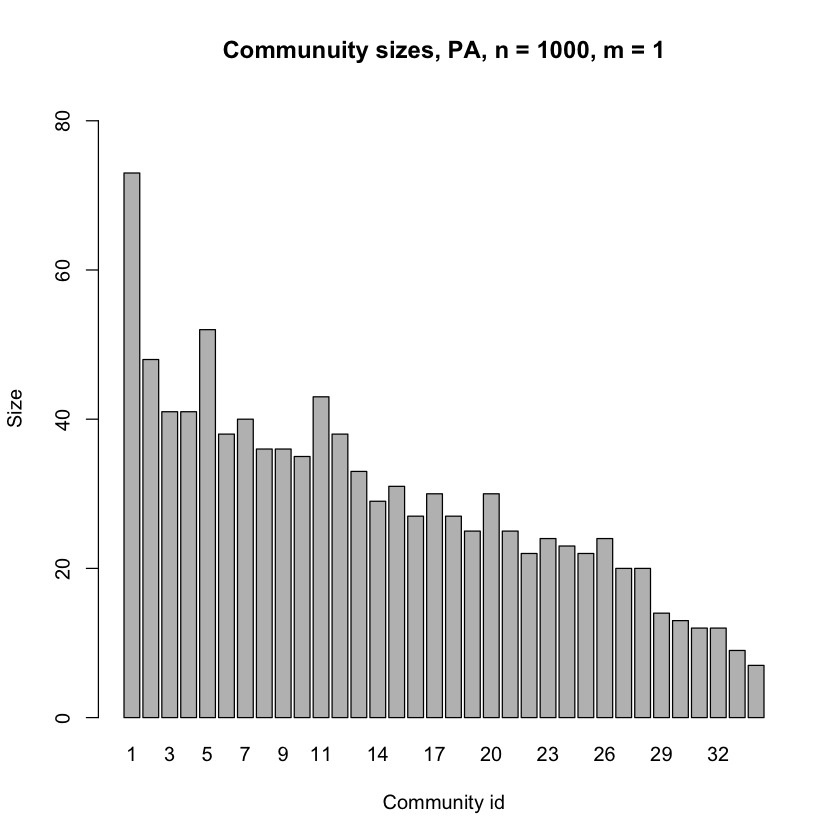

In [ ]:
g <- sample_pa(n = 1000, m = 1, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =1000, m = 1")
print(paste("Modularity for PA model with n = 1000, m = 1:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 1000, m = 1", xlab="Community id", ylab="Size",
        ylim=c(0, max(com_sz) + 10), names.arg=c(1: length(com_sz)))

#### Answer 2(b)

From class lectures, a community is defined as the group of nodes which form a good cluster if it has more edges among themselves than to the rest of the nodes.

To measure the goodness of this community structure, modularity metric is used, which measures the strength of the communities (clusters). Higher modularity index means there are more no. of edges (dense) in the clusters. 

The community structure for a PA network is shown in the above plots with total number of 32 communities formed from 1000 nodes. The modularity score obtained is: 0.930820710600493

##### (c)

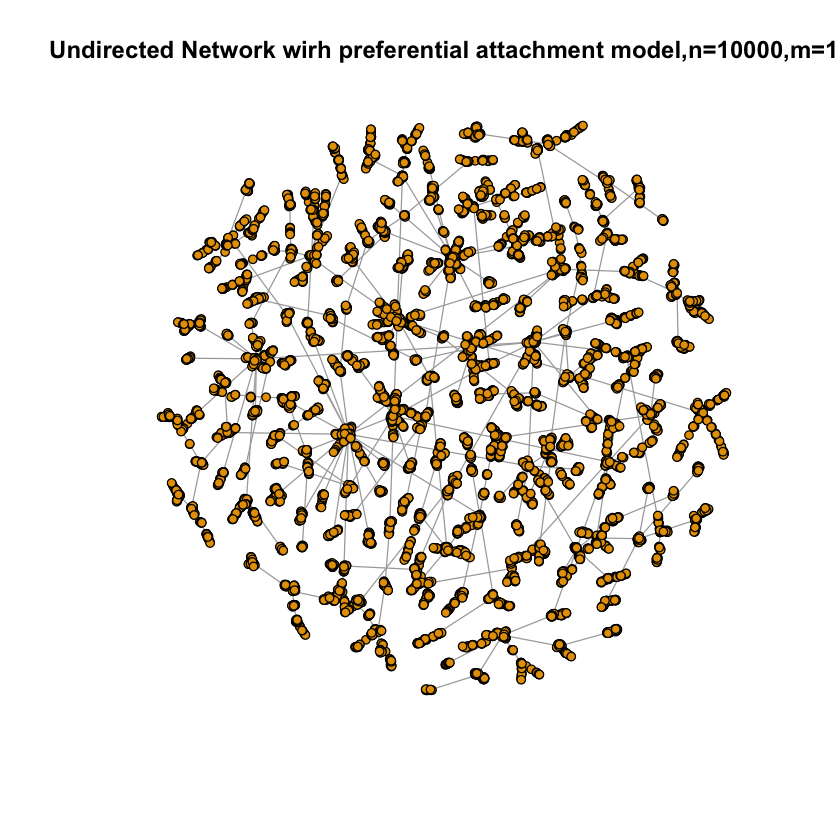

[1] "Modularity for PA model with n = 10000, m = 1: 0.977769449112146"


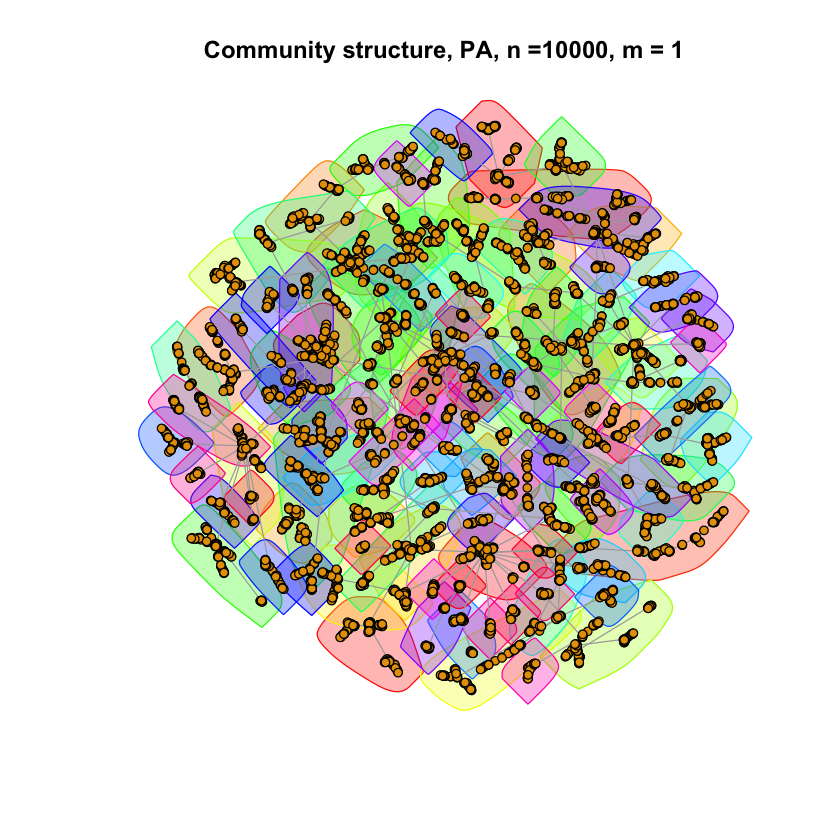

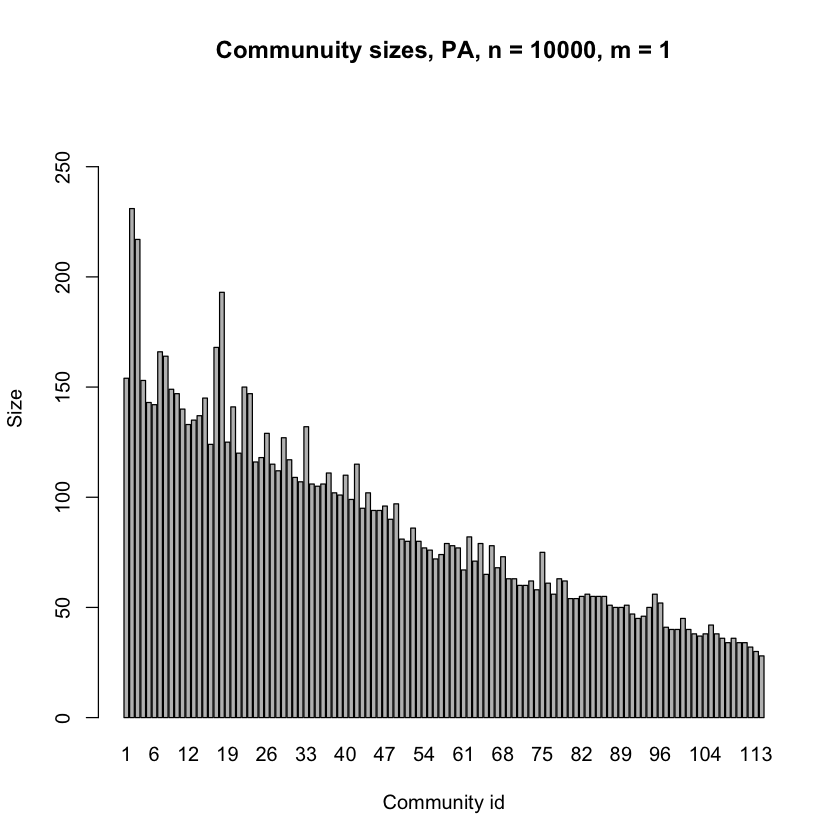

In [ ]:
g <- sample_pa(n = 10000, m = 1, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, vertex.label = "", vertex.size = 3, 
     main = "Undirected Network wirh preferential attachment model,n=10000,m=1")

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =10000, m = 1")
print(paste("Modularity for PA model with n = 10000, m = 1:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 10000, m = 1", xlab="Community id", ylab="Size",
  names.arg=c(1: length(com_sz)), ylim=c(0, max(com_sz) + 50))

#### Answer 2(c)

For n = 10000, the modularity obtained is : 0.977769449112146

It is higher than the smaller network modularity. This is to be expected because as $𝑛$ increases the number of nodes in the smaller communities increases hence increasing the modularity of the network. High modularity means that a network is better in forming distinct communities in this case which means bigger networks are have better segregated and dense communities. PA networks with higher number of nodes are expected to have high modularity since, due to high preference of old nodes they are expected to form dense communities.

#### (d)

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000 :: -2.53954900421594"


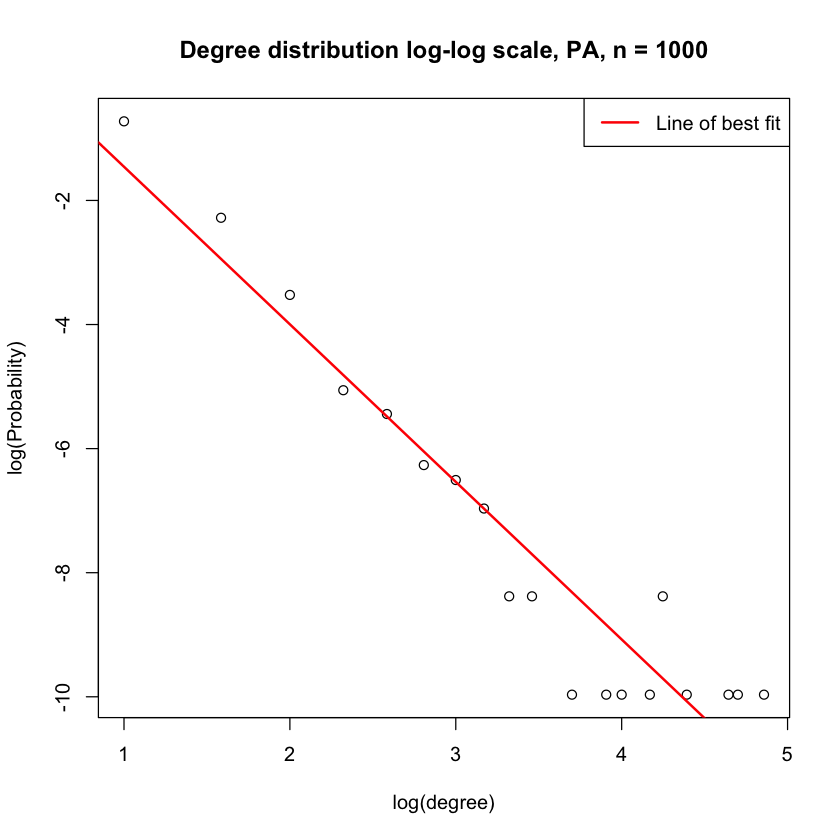

In [ ]:
g1 = sample_pa(n = 1000, m = 1, directed = FALSE)
g2 = sample_pa(n = 10000, m = 1, directed = FALSE)

# For n = 1000

d_dist <- degree.distribution(g1)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 1000",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000 ::",
            lr$coefficients["idx"]))


[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000 :: -2.8009830111426"


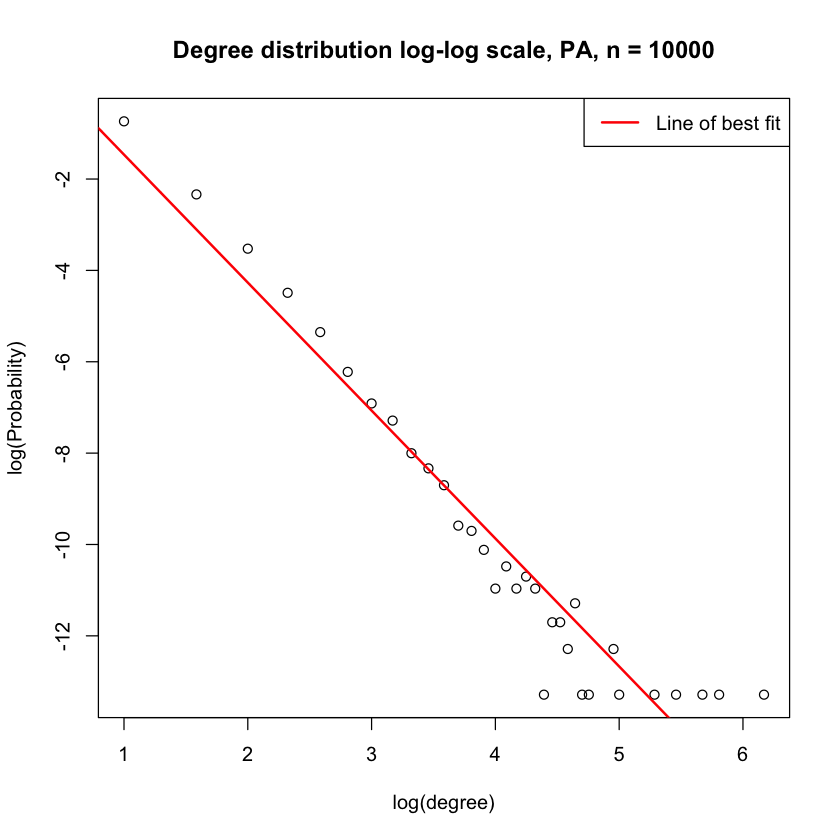

In [ ]:
# For n = 10000

d_dist <- degree.distribution(g2)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 10000",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000 ::",
            lr$coefficients["idx"]))


#### Answer 2(d)

The degree distribution in a log-log scale for both n = 1000, 10000 are plotted above.

Line of best fits are plotted using Linear regression and the slopes obtained are as follows:

For n = 1000, </br>
Slope = -2.53954900421594

For n = 10000</br>
Slope = -2.8009830111426

Theoretically, the degree distribution of PA networks follows a power-law with $\gamma = 3$under steady state and networks with high number of nodes approximate the steady states better and thus we can see for higher no. of nodes slope is reaching towards 3. 

##### (e)

In [ ]:
# for n = 1000
degreeList = c(1:1000)

for (n in c(1:1000)) {
    node <- sample(1000, 1)
    neigh <- neighbors(g1, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g1, j)
}


tab = table(degreeList)

tab_log = log2(as.vector(tab) / 1000)
degrees_n = log2(as.integer(names(tab)))

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000 :: -1.07190603178287"


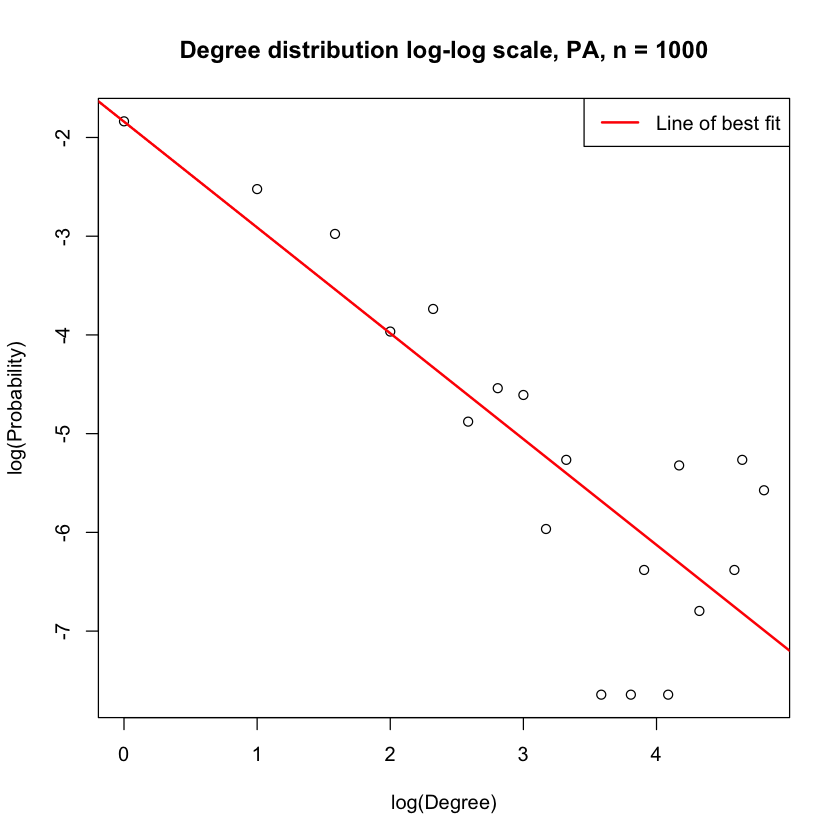

In [ ]:
plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 1000",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000 ::",
            lr$coefficients["degrees_n"]))

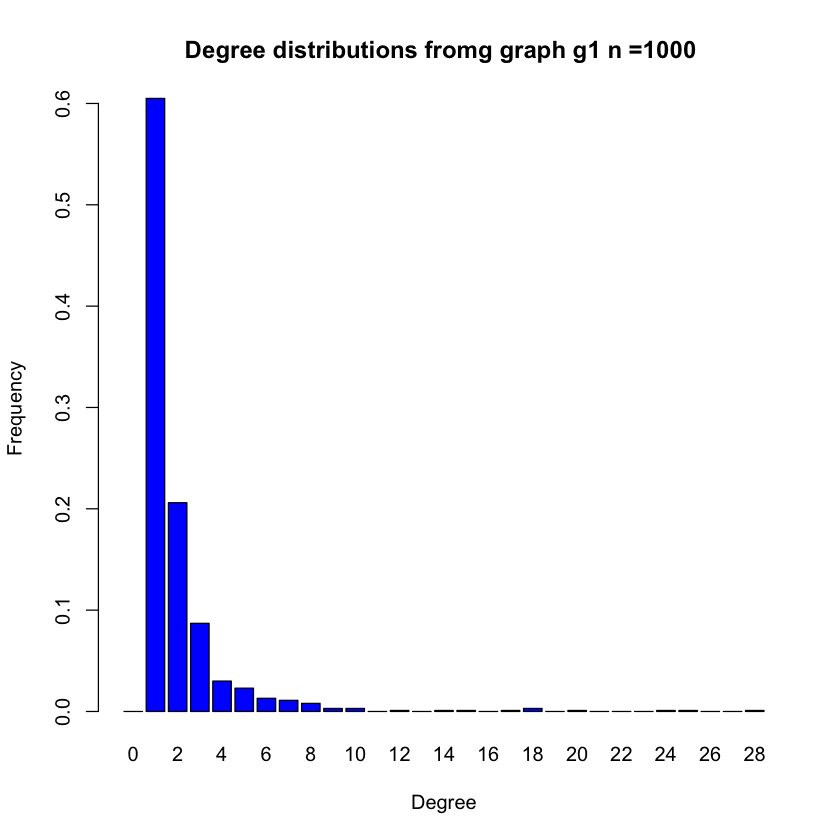

In [ ]:
d_dist = degree.distribution(g1)
xVals = c(0: (length(d_dist) - 1))
barplot(d_dist, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions fromg graph g1 n =1000 " ,sep = " "), col="blue")

In [ ]:
degreeList = c(1:10000)

for (n in c(1:10000)) {
    node <- sample(10000, 1)
    neigh <- neighbors(g2, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g2, j)
}


tab = table(degreeList)
tab_log = log2(as.vector(tab) / 10000)
degrees_n = log2(as.integer(names(tab)))

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000 :: -1.42101247091716"


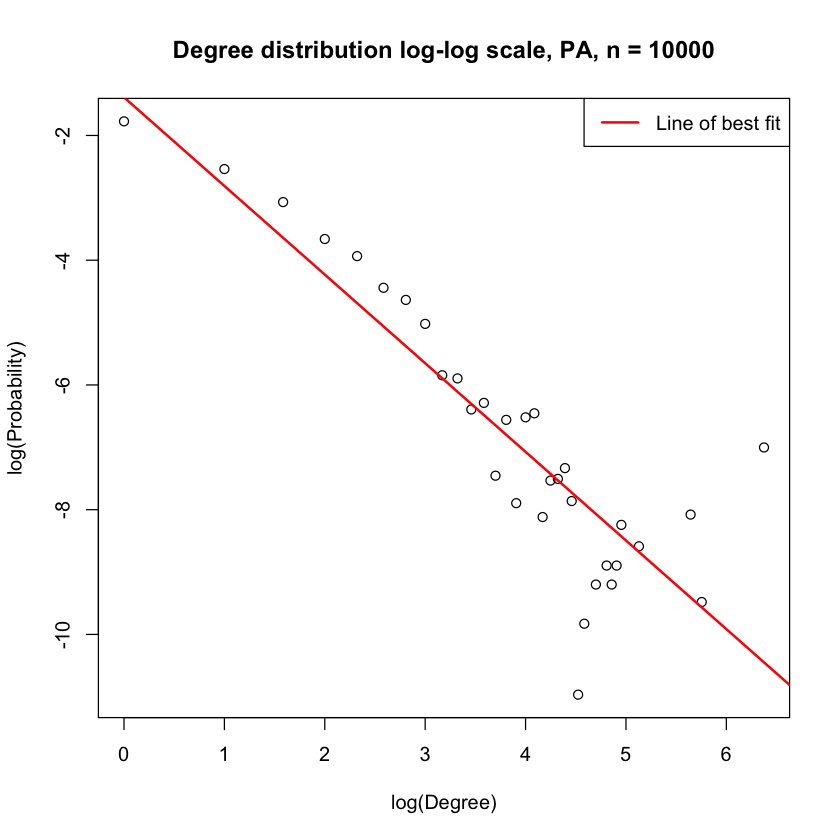

In [ ]:
plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 10000",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)


print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000 ::",
            lr$coefficients["degrees_n"]))

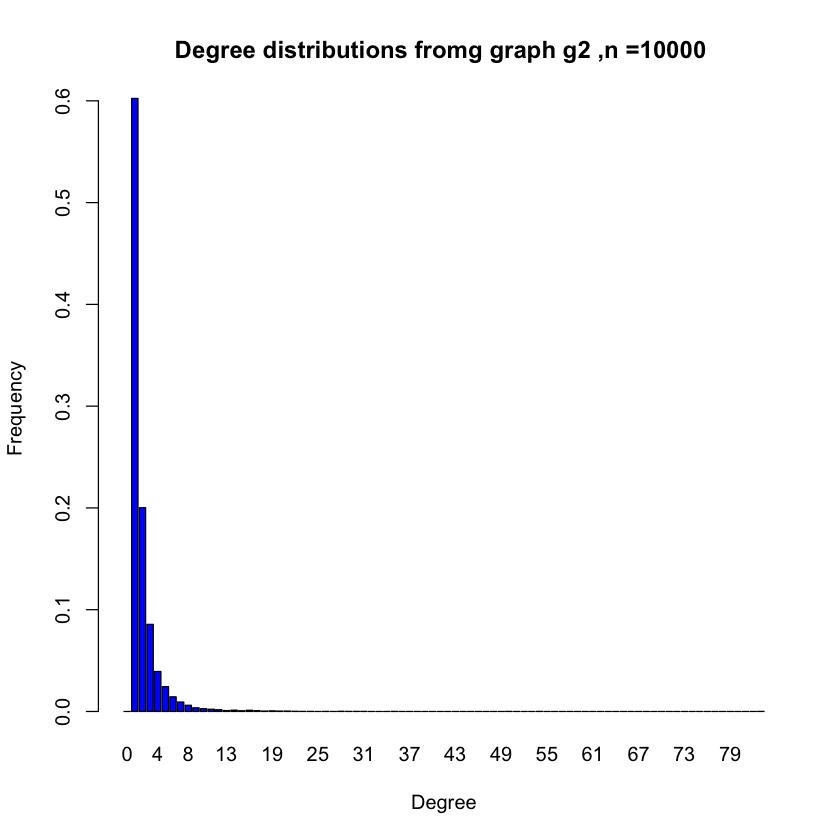

In [ ]:
d_dist = degree.distribution(g2)
xVals = c(0: (length(d_dist) - 1))
barplot(d_dist, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions fromg graph g2 ,n =10000 " ,sep = " "), col="blue")

#### 2(e)

With the process defined in the question, the plots are drawn above to visualize the degree distribution of the selected nodes. The slopes found are as follows:

For n = 1000, </br>
Slope: -1.07190603178287

For n = 10000, </br>
Slope: -1.42101247091716

Yes, the distribution is linear in the log-log scale.

The slopes are not comparable to degree distribution of the PA network for which the power-law has slope of 3 as seen in above experiments.

#### (f)

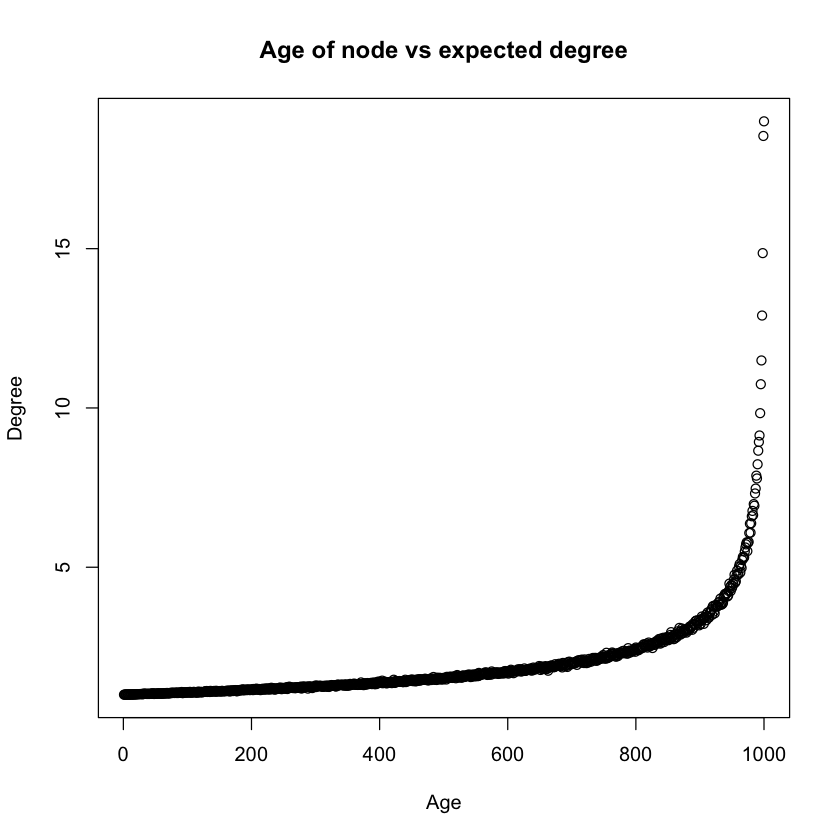

In [ ]:
deg <- rep(0, 1000)

ages = c(1: 1000)
for (age in ages) {
    g <- sample_pa(n = 1000, m = 1, directed = FALSE)
    deg = deg + degree(g)
}

deg = deg / 1000

plot(rev(ages), deg, main = "Age of node vs expected degree", xlab="Age", ylab = "Degree")

#### Answer 2(f)

From the above plot (Age of node vs expected degree) we can see that the expected degree of the nodes is increasing over time. This trend is expected since in PA network, older nodes have more chances of being connected with a new added node. Thus, with time old nodes are expected to have high numbr of degree. Theoretically, the average degree of a node i added at time step t is given by:

<br/><center>$k(i, t) = m\sqrt{\frac{t}{i}}$</center>

##### (g)

[1] "Fraction of networks which are connected: m = 2 ::  1"


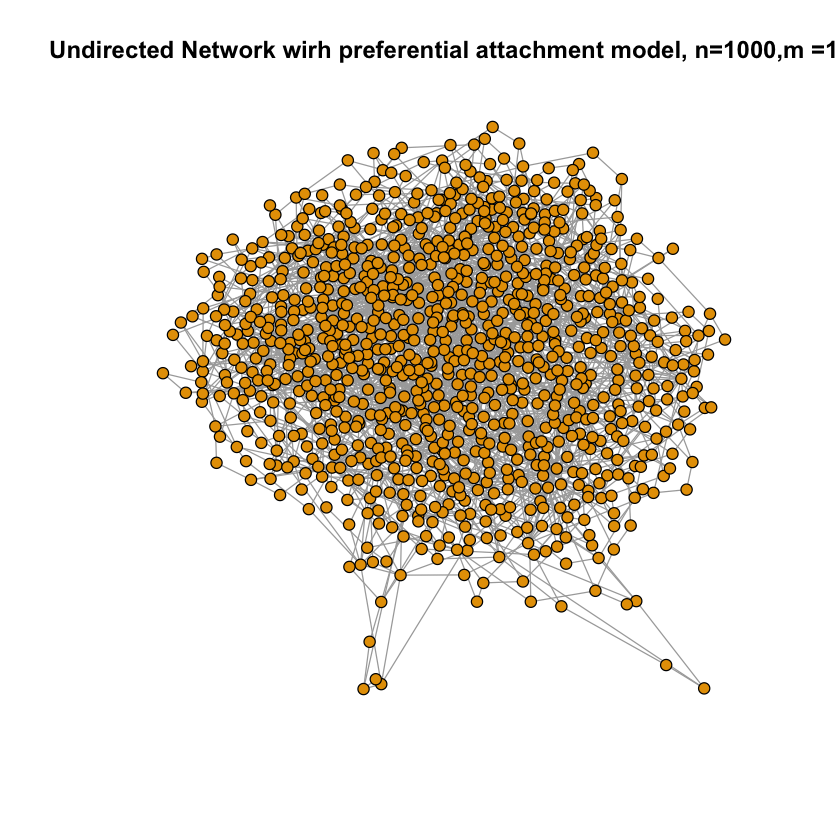

[1] "Fraction of networks which are connected: m = 5 ::  1"


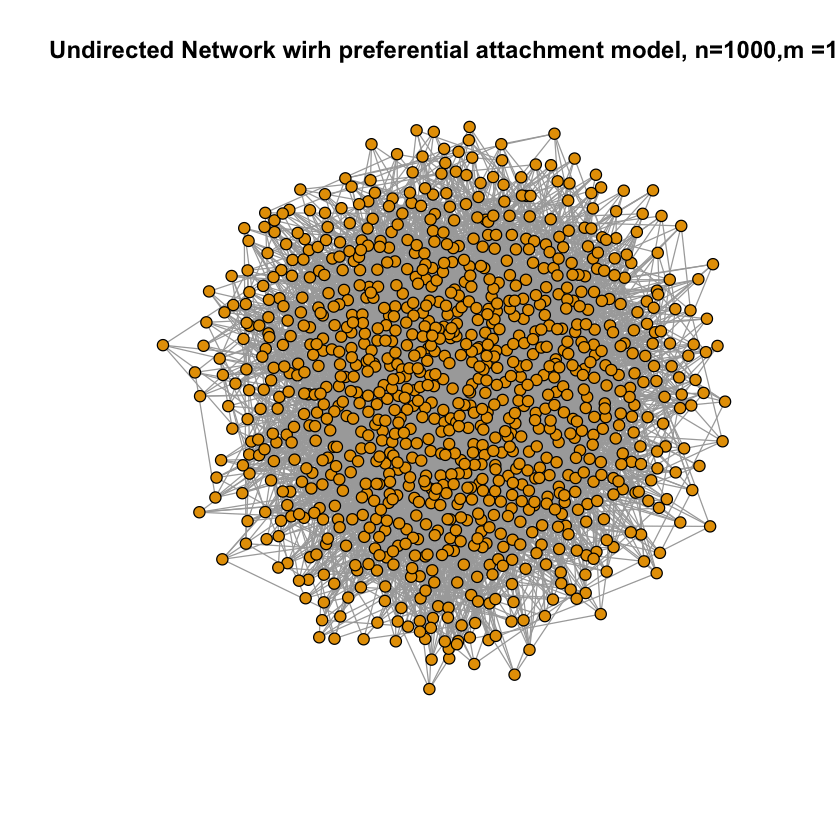

In [ ]:
# For m = 2

t_conn <- 0
for (i in c(1 : 100)) {
    g <- sample_pa(n = 1000, m = 2, directed = FALSE)
    if(i == 1) {
        plot(g, vertex.label = "", vertex.size = 4, main = "Undirected Network wirh preferential attachment model, n=1000,m =1")
    }
    if(is_connected(g)) {
        t_conn <- t_conn + 1
    }
}

print(paste("Fraction of networks which are connected: m = 2 :: ", t_conn / 100))


# For m = 5

t_conn <- 0
for (i in c(1 : 100)) {
    g <- sample_pa(n = 1000, m = 5, directed = FALSE)
    if(i == 1) {
        plot(g, vertex.label = "", vertex.size = 4, main = "Undirected Network wirh preferential attachment model, n=1000,m =1")
    }
    if(is_connected(g)) {
        t_conn <- t_conn + 1
    }
}

print(paste("Fraction of networks which are connected: m = 5 :: ", t_conn / 100))



[1] "Modularity for PA model with n = 1000, m = 2: 0.518422225225668"


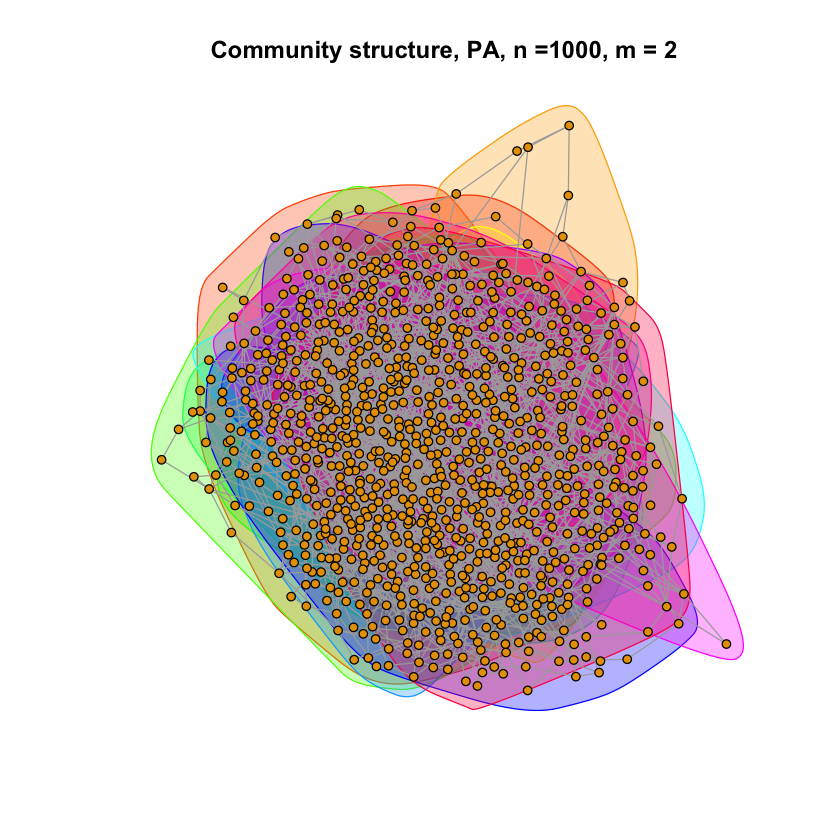

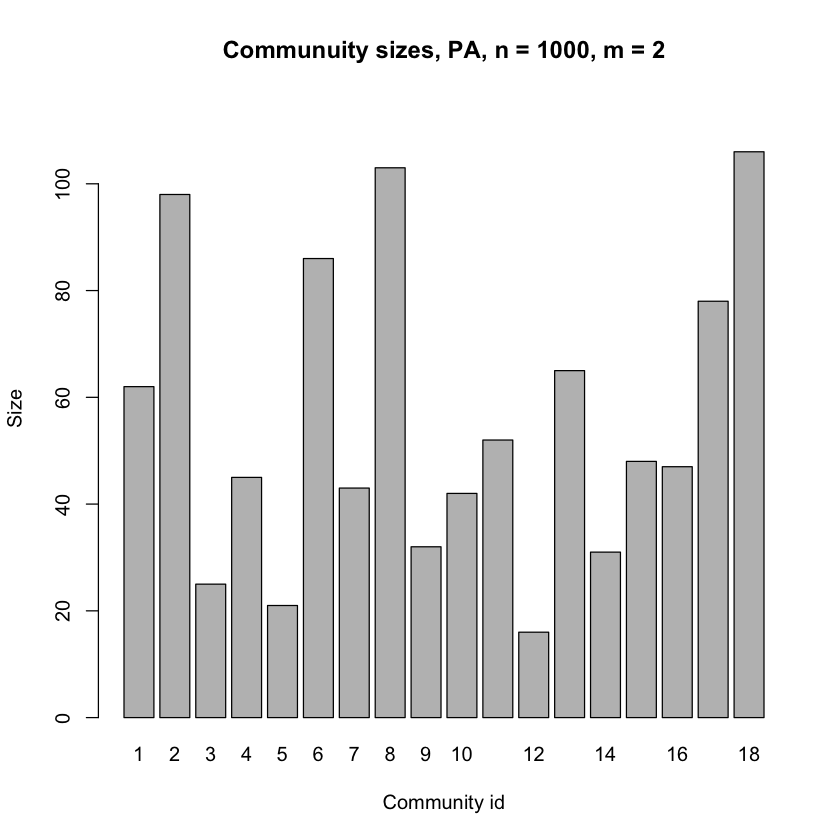

[1] "Modularity for PA model with n = 1000, m = 5: 0.283099267712867"


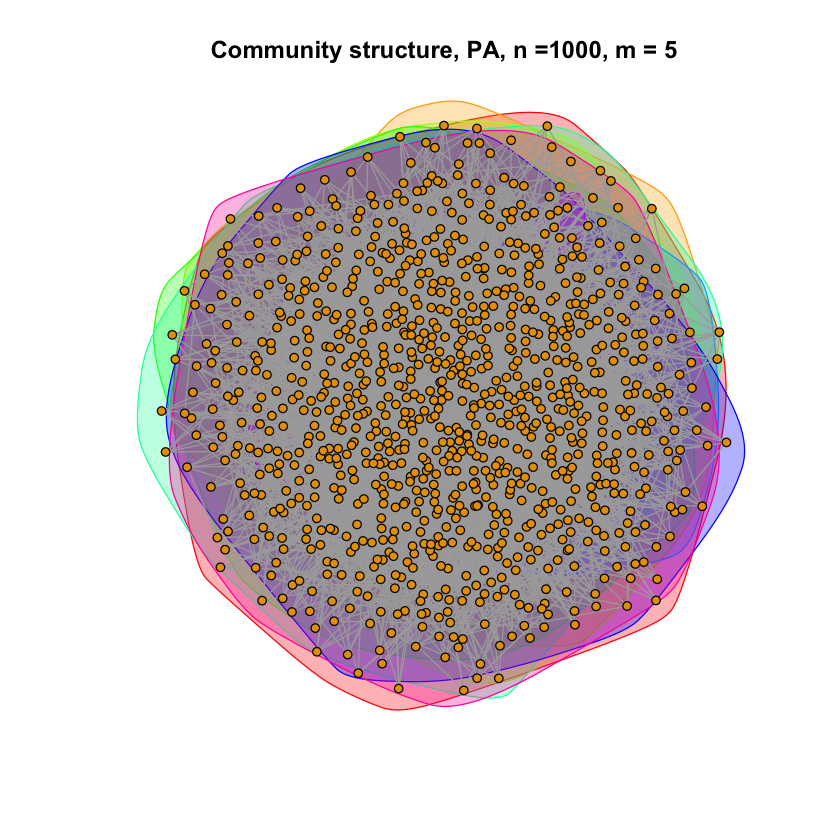

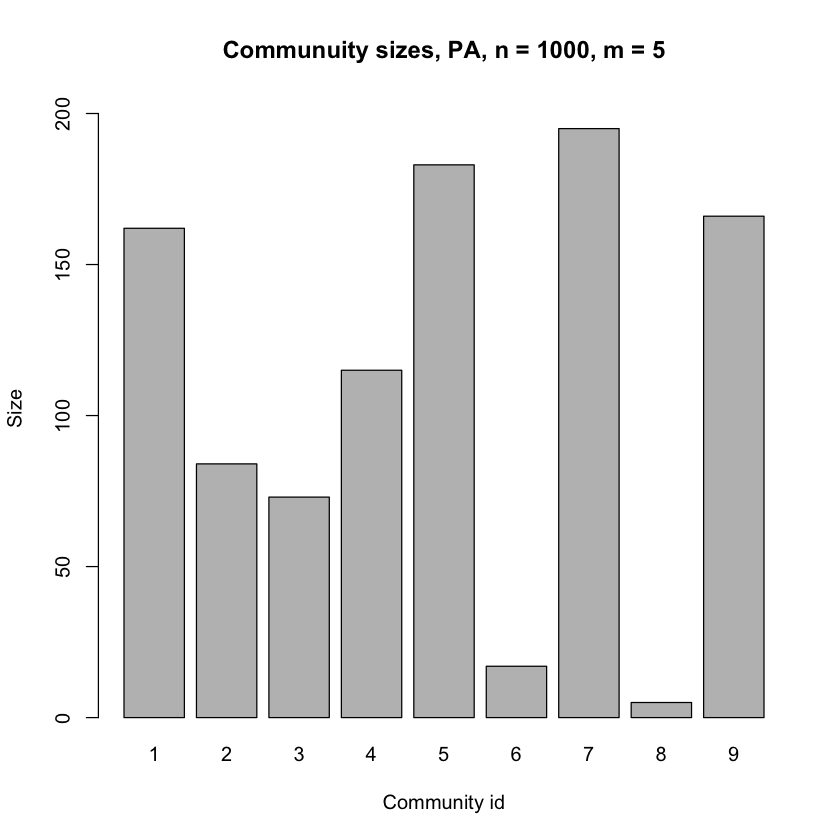

In [ ]:
g <- sample_pa(n = 1000, m = 2, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =1000, m = 2")
print(paste("Modularity for PA model with n = 1000, m = 2:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 1000, m = 2", xlab="Community id", ylab="Size",
        ylim=c(0, max(com_sz) + 10), names.arg=c(1: length(com_sz)))


### m = 5
g <- sample_pa(n = 1000, m = 5, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =1000, m = 5")
print(paste("Modularity for PA model with n = 1000, m = 5:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 1000, m = 5", xlab="Community id", ylab="Size",
        ylim=c(0, max(com_sz) + 10), names.arg=c(1: length(com_sz)))



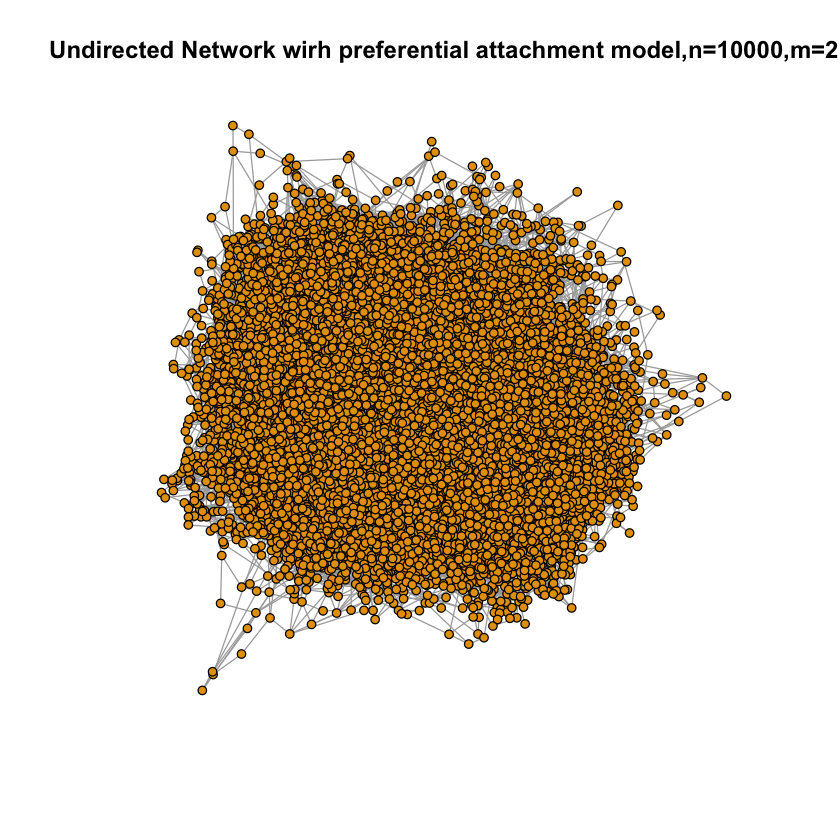

[1] "Modularity for PA model with n = 10000, m = 2: 0.531392670844928"


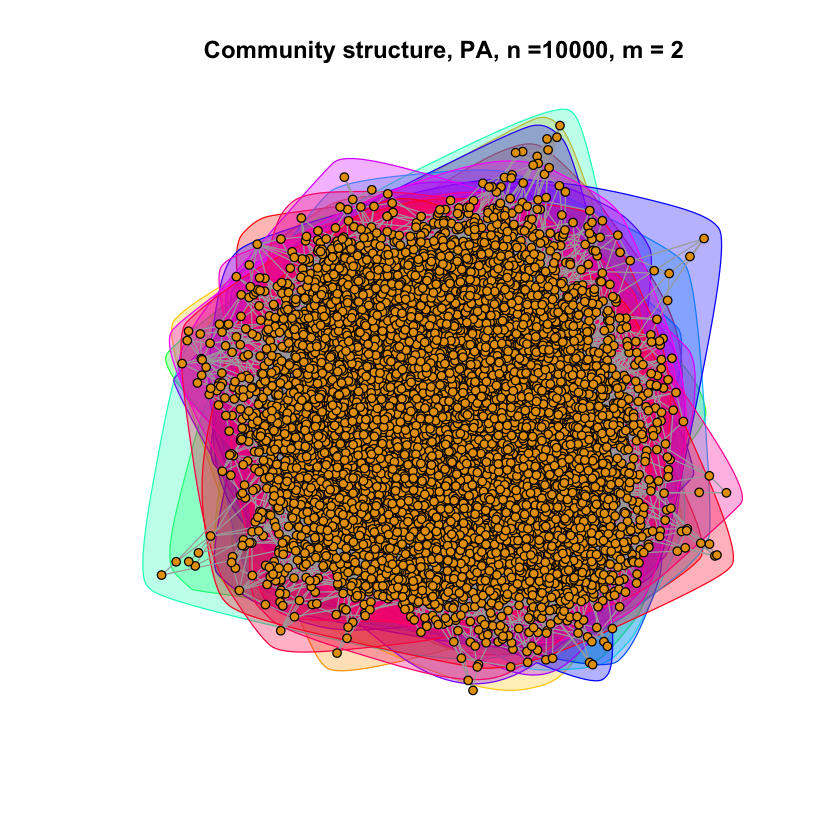

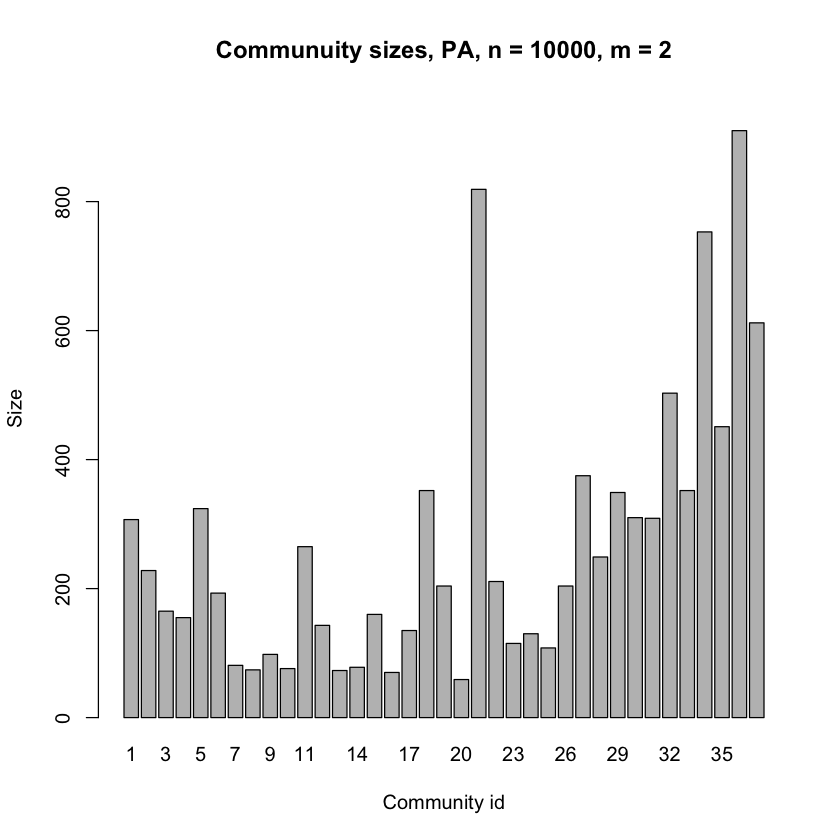

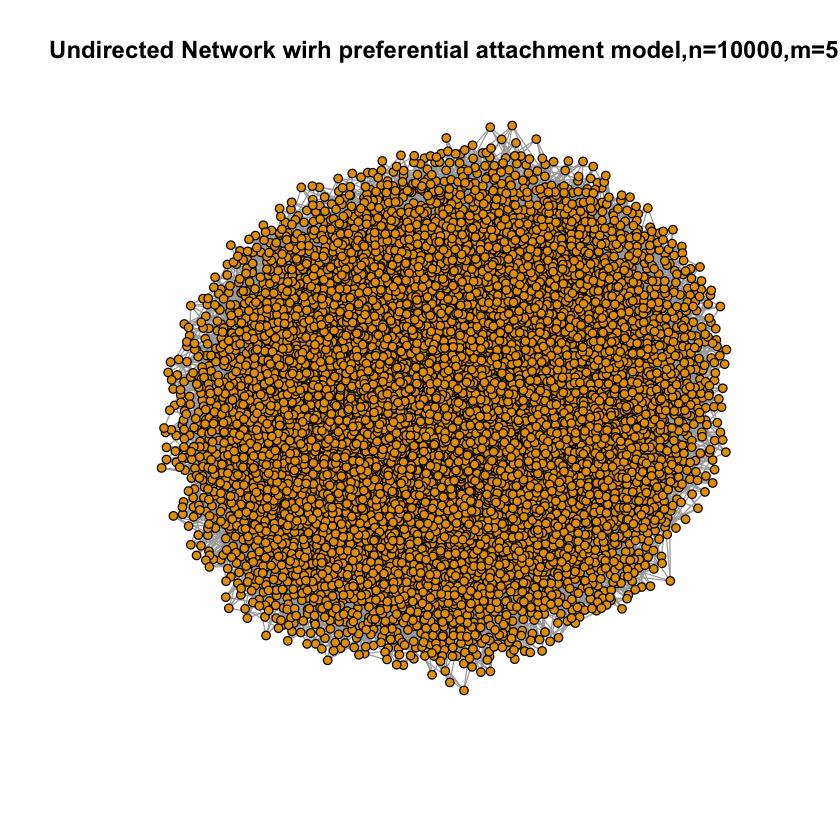

[1] "Modularity for PA model with n = 10000, m = 5: 0.274084282101679"


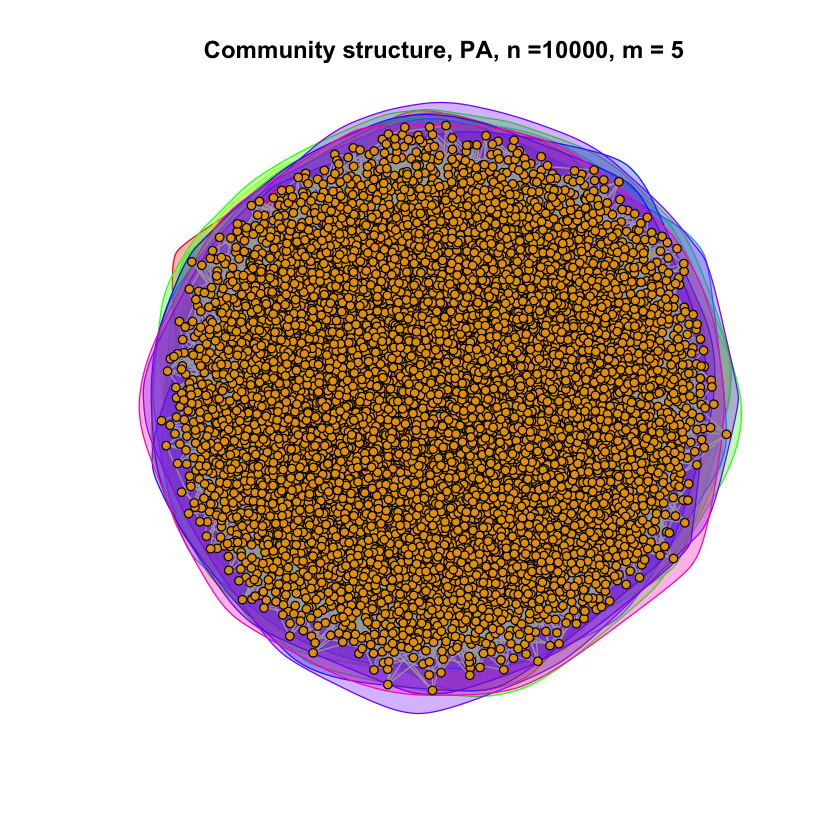

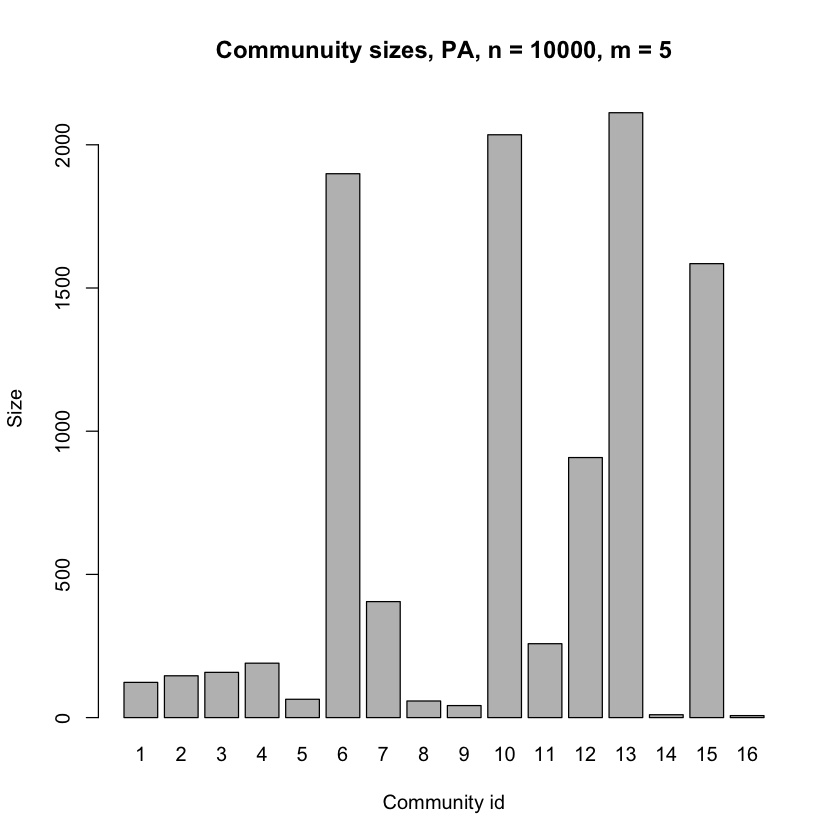

In [ ]:
g <- sample_pa(n = 10000, m = 2, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, vertex.label = "", vertex.size = 3, 
     main = "Undirected Network wirh preferential attachment model,n=10000,m=2")

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =10000, m = 2")
print(paste("Modularity for PA model with n = 10000, m = 2:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 10000, m = 2", xlab="Community id", ylab="Size",
  names.arg=c(1: length(com_sz)), ylim=c(0, max(com_sz) + 50))

### m = 5

g <- sample_pa(n = 10000, m = 5, directed = FALSE)
community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, vertex.label = "", vertex.size = 3, 
     main = "Undirected Network wirh preferential attachment model,n=10000,m=5")

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =10000, m = 5")
print(paste("Modularity for PA model with n = 10000, m = 5:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 10000, m = 5", xlab="Community id", ylab="Size",
  names.arg=c(1: length(com_sz)), ylim=c(0, max(com_sz) + 50))



[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m = 2 :: -2.2848929722978"


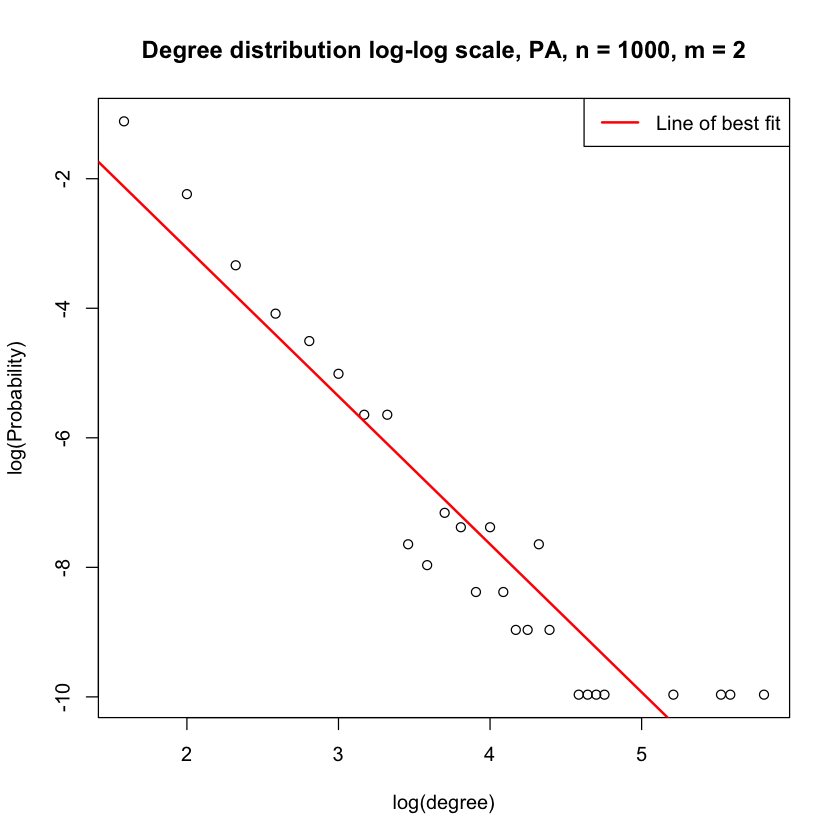

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 2 :: -2.44428200033806"


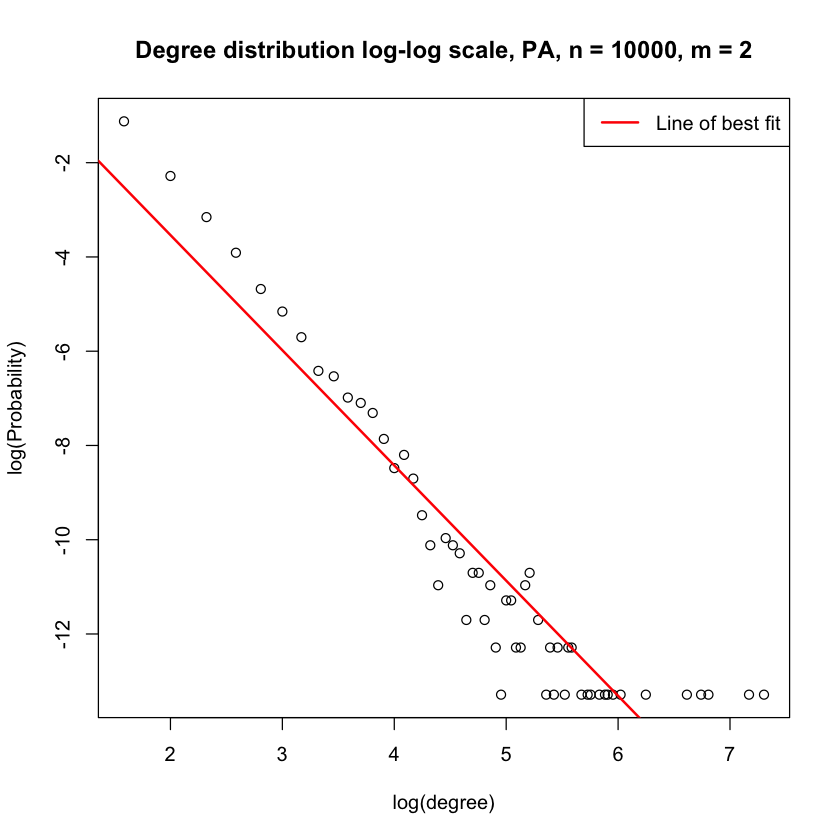

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m = 5 :: -2.17962768479354"


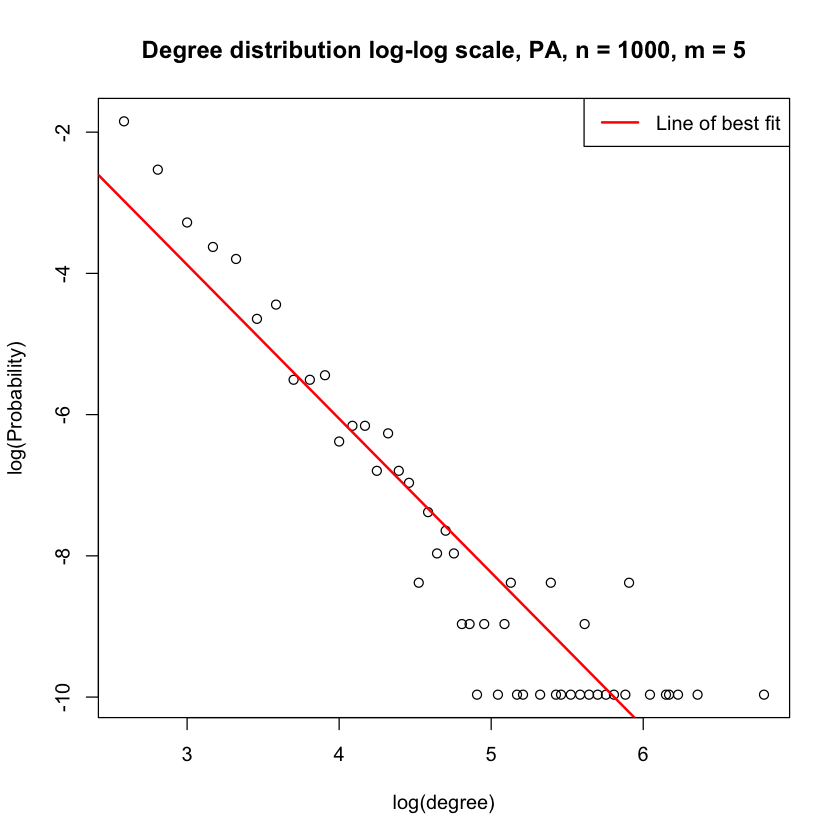

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 5 :: -2.21153026610479"


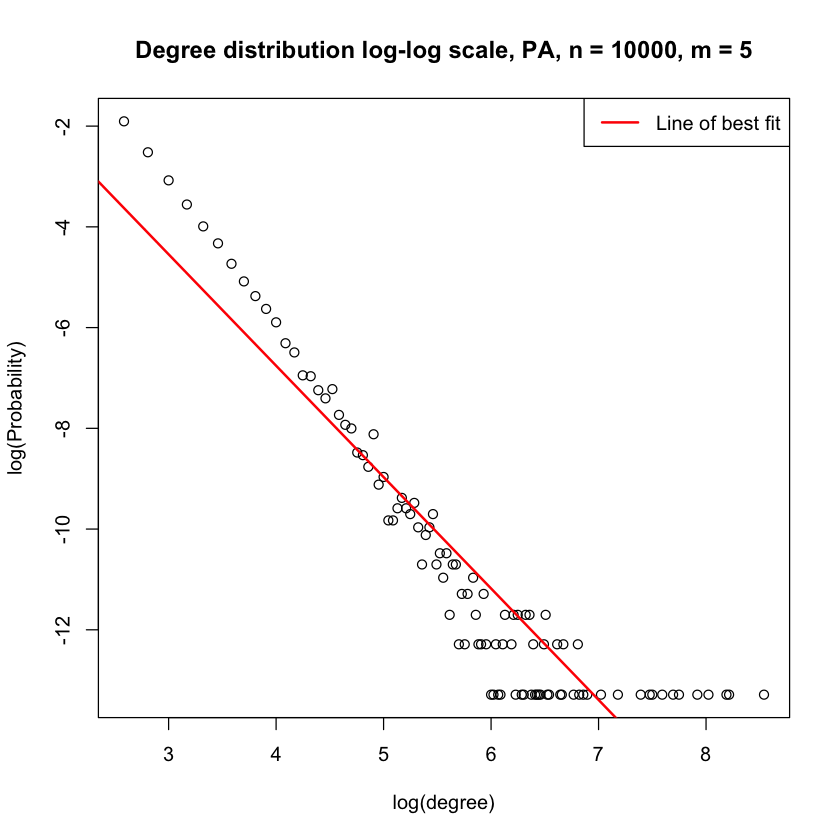

In [ ]:
g1 = sample_pa(n = 1000, m = 2, directed = FALSE)
g2 = sample_pa(n = 10000, m = 2, directed = FALSE)

# For n = 1000

d_dist <- degree.distribution(g1)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 1000, m = 2",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m = 2 ::",
            lr$coefficients["idx"]))

# For n = 10000

d_dist <- degree.distribution(g2)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 10000, m = 2",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 2 ::",
            lr$coefficients["idx"]))


#### m = 5

g3 = sample_pa(n = 1000, m = 5, directed = FALSE)
g4 = sample_pa(n = 10000, m = 5, directed = FALSE)

# For n = 1000

d_dist <- degree.distribution(g3)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 1000, m = 5",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m = 5 ::",
            lr$coefficients["idx"]))

# For n = 10000

d_dist <- degree.distribution(g4)

nonZero <- log2(d_dist[d_dist != 0])
idx <- log2(which(d_dist != 0))

plot(idx, nonZero, main = "Degree distribution log-log scale, PA, n = 10000, m = 5",
     xlab = "log(degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(nonZero ~ idx)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 5 ::",
            lr$coefficients["idx"]))



[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m =2 :: -1.05808022729327"


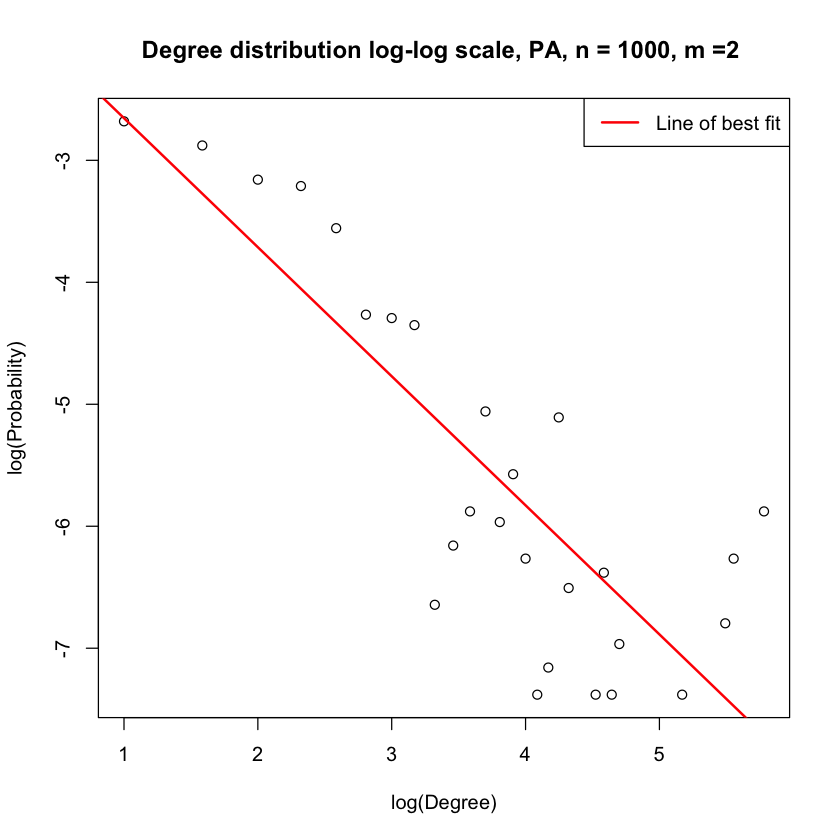

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 2 :: -1.29739261559985"


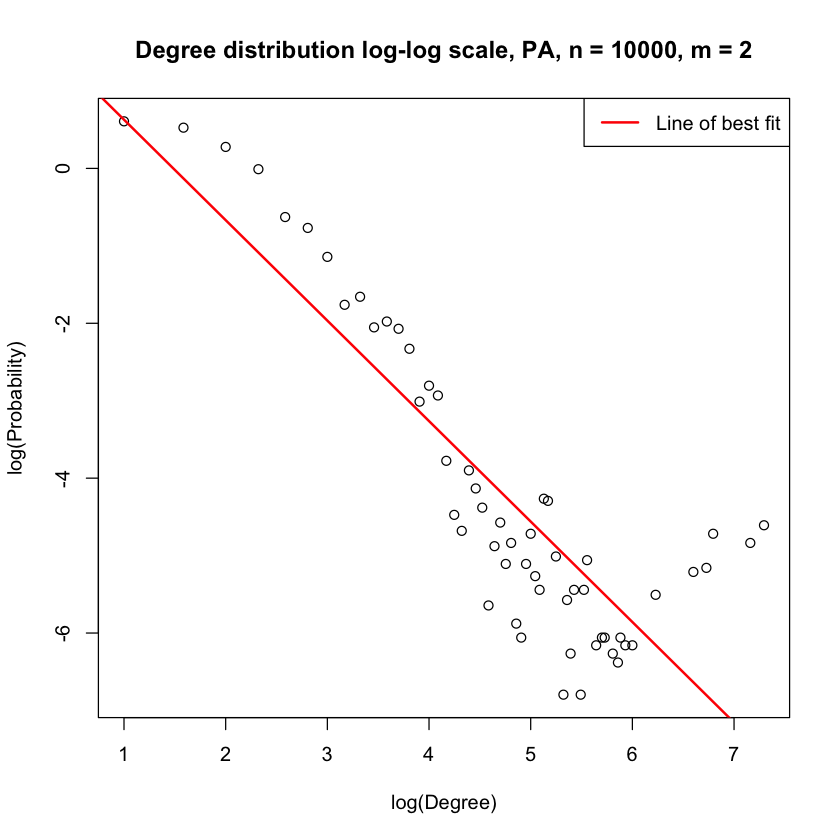

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m =5 :: -1.15552458499611"


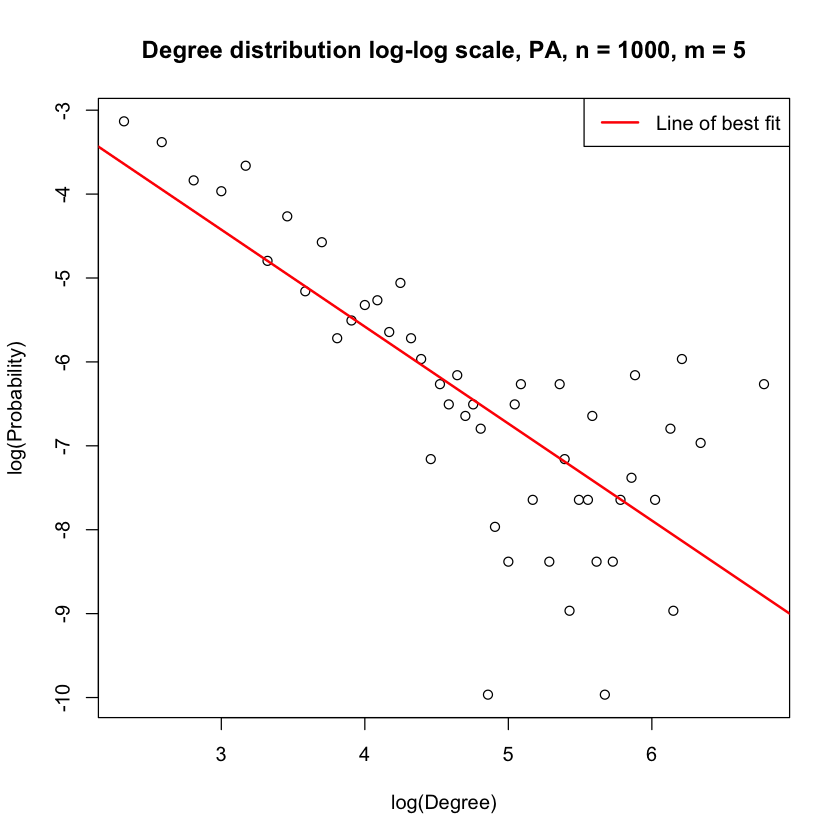

[1] "Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 5 :: -1.20233638715862"


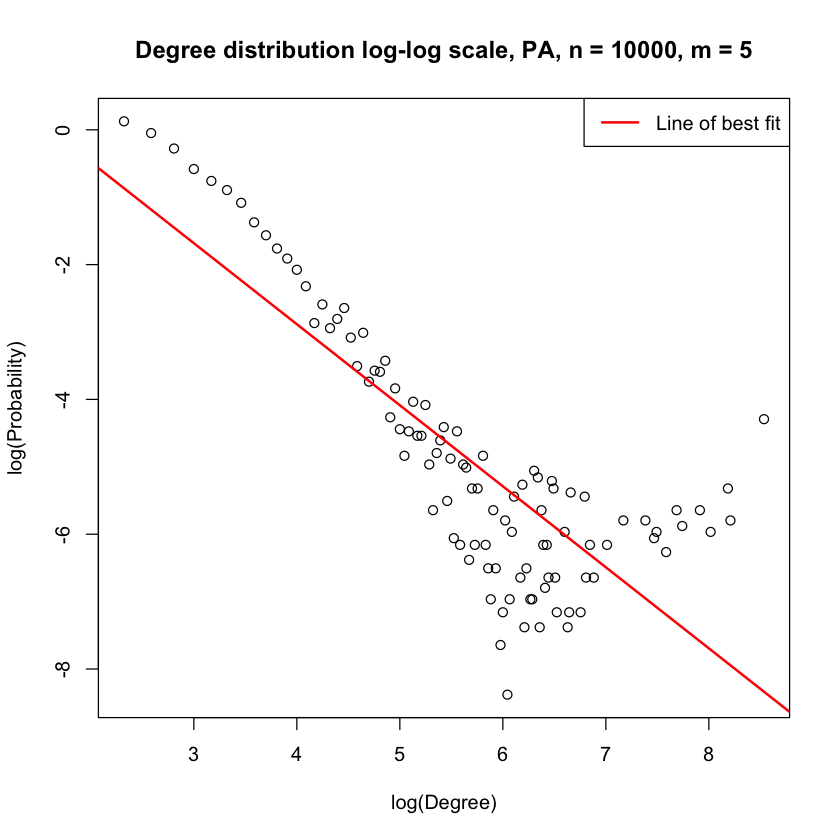

In [ ]:
# m = 2

# for n = 1000
degreeList = c(1:1000)

for (n in c(1:1000)) {
    node <- sample(1000, 1)
    neigh <- neighbors(g1, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g1, j)
}


tab = table(degreeList)

tab_log = log2(as.vector(tab) / 1000)
degrees_n = log2(as.integer(names(tab)))



plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 1000, m =2 ",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m =2 ::",
            lr$coefficients["degrees_n"]))

# for n = 10000
degreeList = c(1:10000)

for (n in c(1:10000)) {
    node <- sample(10000, 1)
    neigh <- neighbors(g2, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g2, j)
}


tab = table(degreeList)

tab_log = log2(as.vector(tab) / 1000)
degrees_n = log2(as.integer(names(tab)))



plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 10000, m = 2",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 2 ::",
            lr$coefficients["degrees_n"]))



#m = 5

# for n = 1000
degreeList = c(1:1000)

for (n in c(1:1000)) {
    node <- sample(1000, 1)
    neigh <- neighbors(g3, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g3, j)
}


tab = table(degreeList)

tab_log = log2(as.vector(tab) / 1000)
degrees_n = log2(as.integer(names(tab)))



plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 1000, m = 5",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 1000, m =5 ::",
            lr$coefficients["degrees_n"]))

# for n = 1000
degreeList = c(1:10000)

for (n in c(1:10000)) {
    node <- sample(10000, 1)
    neigh <- neighbors(g4, node)
    j <- sample(neigh, 1)
    
    degreeList[n] = degree(g4, j)
}


tab = table(degreeList)

tab_log = log2(as.vector(tab) / 1000)
degrees_n = log2(as.integer(names(tab)))



plot(degrees_n,tab_log, main = "Degree distribution log-log scale, PA, n = 10000, m = 5",
     xlab = "log(Degree)", ylab = "log(Probability)")

legend(x = "topright",
       legend = "Line of best fit",                  
       lwd = 2,
       col = 'red' 
      )

lr <- lm(tab_log ~ degrees_n)
abline(lr, col="red", lwd=2)

print(paste("Slope of Linear legression line for log-log degree distribution plot, PA, n= 10000, m = 5 ::",
            lr$coefficients["degrees_n"]))



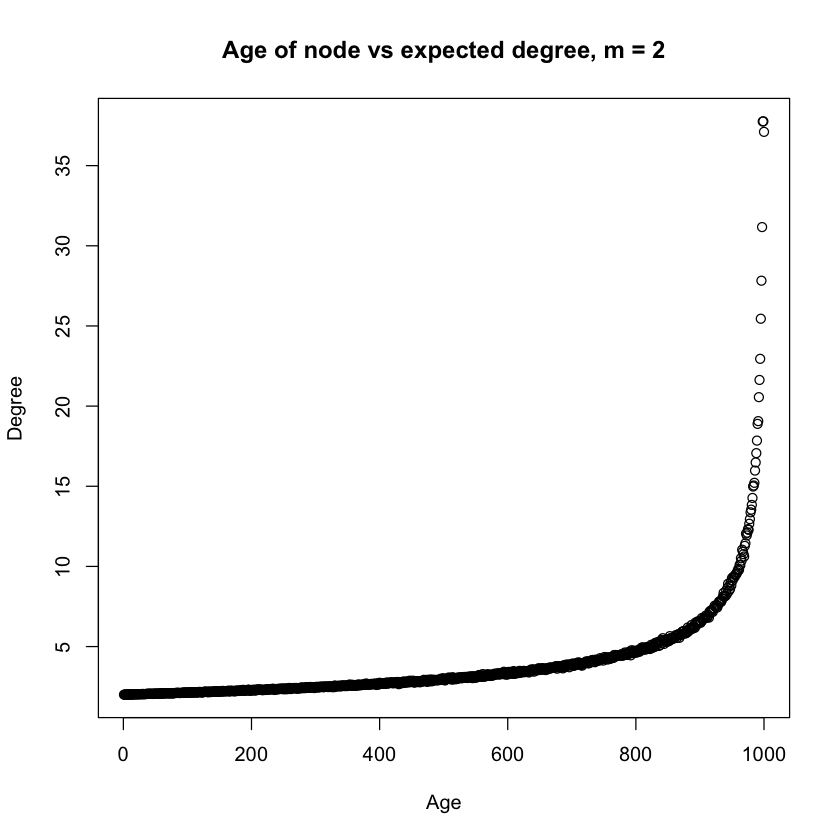

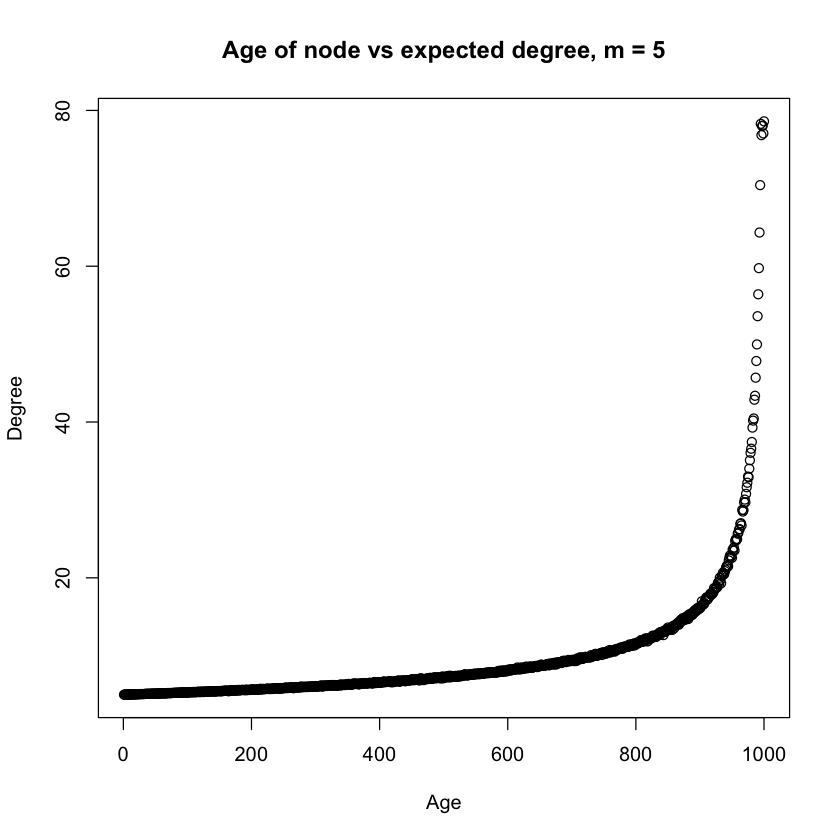

In [ ]:
deg <- rep(0, 1000)

ages = c(1: 1000)
for (age in ages) {
    g <- sample_pa(n = 1000, m = 2, directed = FALSE)
    deg = deg + degree(g)
}

deg = deg / 1000

plot(rev(ages), deg, main = "Age of node vs expected degree, m = 2", xlab="Age", ylab = "Degree")

#m = 5

deg <- rep(0, 1000)

ages = c(1: 1000)
for (age in ages) {
    g <- sample_pa(n = 1000, m = 5, directed = FALSE)
    deg = deg + degree(g)
}

deg = deg / 1000

plot(rev(ages), deg, main = "Age of node vs expected degree, m = 5", xlab="Age", ylab = "Degree")


#### Answer 2(g)

All the above part from (a) - (f) are repeated for m = 2 and m = 5 for this question.
All the results are shown above. 

We inferred that for different values of m, the networks generated from Preferential attachment are always connected.

The modularities of the network for different m are summarised below:

- n = 1000, m = 2: modularity = 0.518422225225668

- n = 1000, m = 5: modularity = 0.283099267712867

- n = 10000, m = 2: modularity = 0.531392670844928

- n = 10000, m = 5: modularity = 0.274084282101679

We observe that as n increases the modularity is increasing for the same value of m. This is because with large n, the communities formed are more dense since old nodes have higher probability to get attached to new nodes.

Also it’s observed that as m increases for the same n, the modularity decreases. This is because from the mathematical expression of modularity index it’s inversely proportional to value of m., and it's also seen that the number of clusters formed for high values of m are less compared to lower values.

Its observed that the degree distribution in the log-log scale is almost linear and the results are as follows:

- n= 1000, m = 2, slope =  -2.2848929722978

- n= 10000, m = 2, slope = -2.44428200033806

- n= 1000, m = 5, slope = -2.17962768479354

- n= 10000, m = 5, slope = -2.21153026610479

From above results we see that for large values of n, the slope of the line is more close to theoretical slope of $\gamma = 3$. This is because higher the number of nodes the better would be the generalizations.

Also it is observed from above results that as m increases the slope is decreasing.


The degree distributions for the randomly selected neighbouring node of a random node in the graph are shown below.

- n= 1000, m =2, slope = -1.05808022729327

- n= 10000, m = 2, slope = -1.29739261559985

- n= 1000, m =5, slope = -1.15552458499611

- n= 10000, m = 5 slope = -1.20233638715862

Its observed that the degree distributions are almost linear. The values are nowhere near the theoretical results of $\gamma = 3$. Thus we can conclude that degree distribution of the randomly selected neighbouring node doesnt follow the same power law. The effects of n and m on this degree distribution is same as explained above for degree-distribution of the network.

The plot for age of nodes vs expected degree are shown in above cells.
Its observed that for high value of m, expected degree of old nodes are much higher as compared to low value of m. This is because old nodes have higher chances of getting attache dto new nodes and also since m is high, it means there would be more edges for the nodes and hence high degree as time progresses


##### (h)

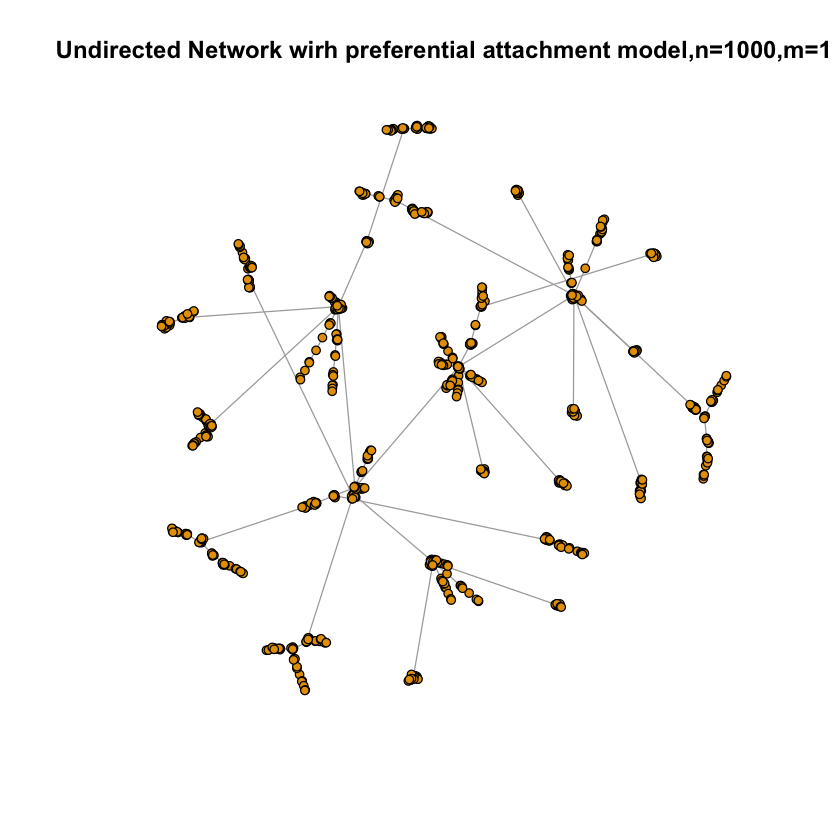

[1] "Modularity for PA model with n = 1000, m = 1: 0.930889347806266"


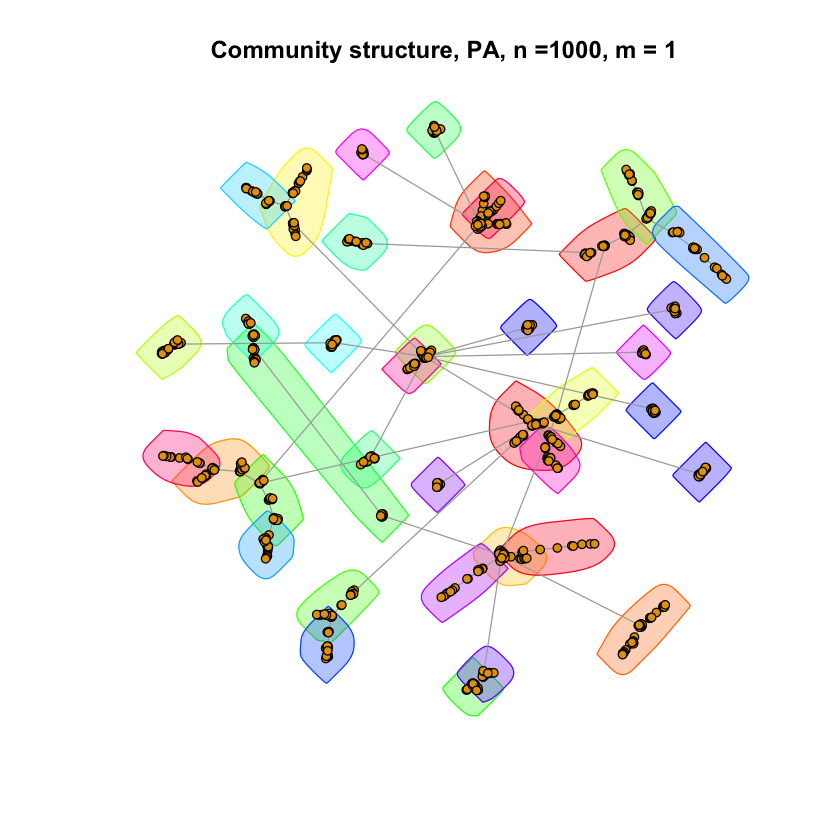

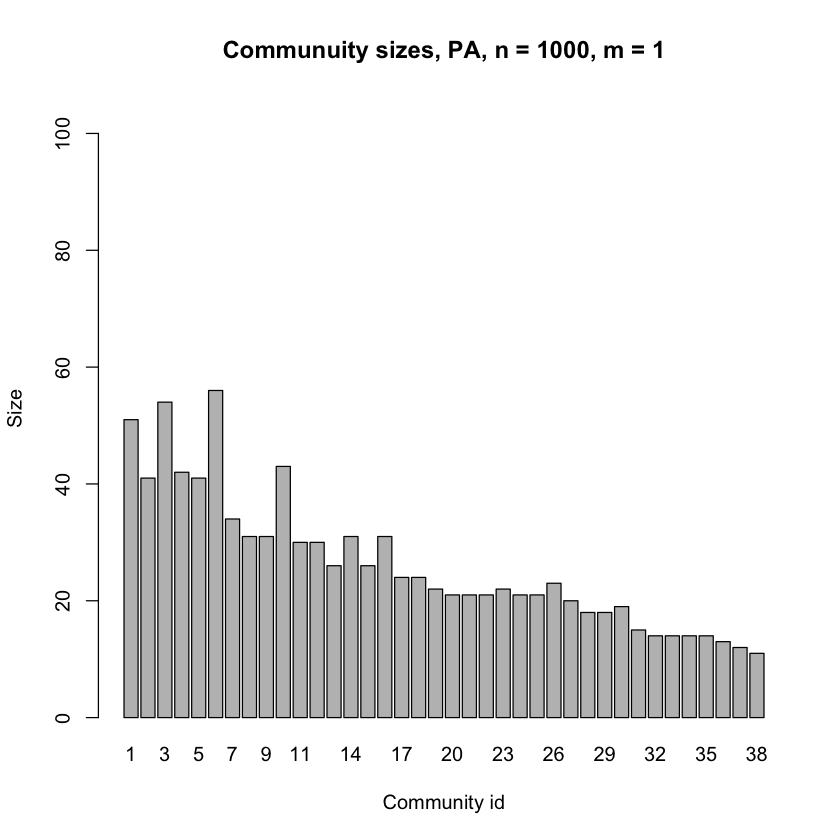

In [ ]:
g = sample_pa(n = 1000, m = 1, directed = FALSE)
degree_g = degree(g)

community <- cluster_fast_greedy(g)

mod <- modularity(community)

plot(g, vertex.label = "", vertex.size = 3, 
     main = "Undirected Network wirh preferential attachment model,n=1000,m=1")

plot(g, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =1000, m = 1")
print(paste("Modularity for PA model with n = 1000, m = 1:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 1000, m = 1", xlab="Community id", ylab="Size",
  names.arg=c(1: length(com_sz)), ylim=c(0, max(com_sz) + 50))

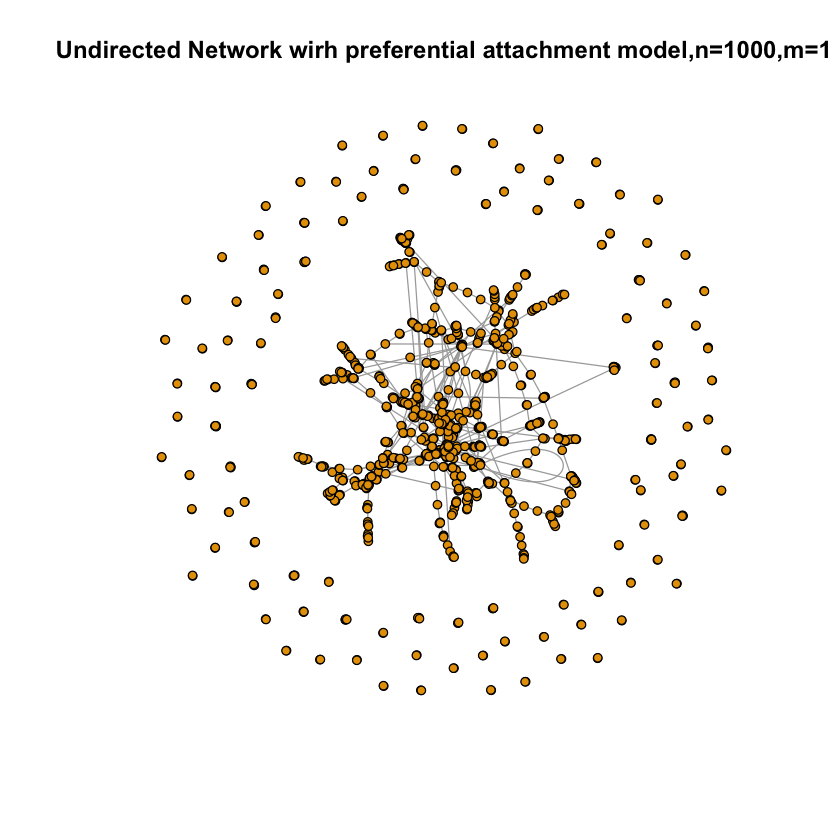

[1] "Modularity for PA model with n = 1000, m = 1: 0.742506384849548"


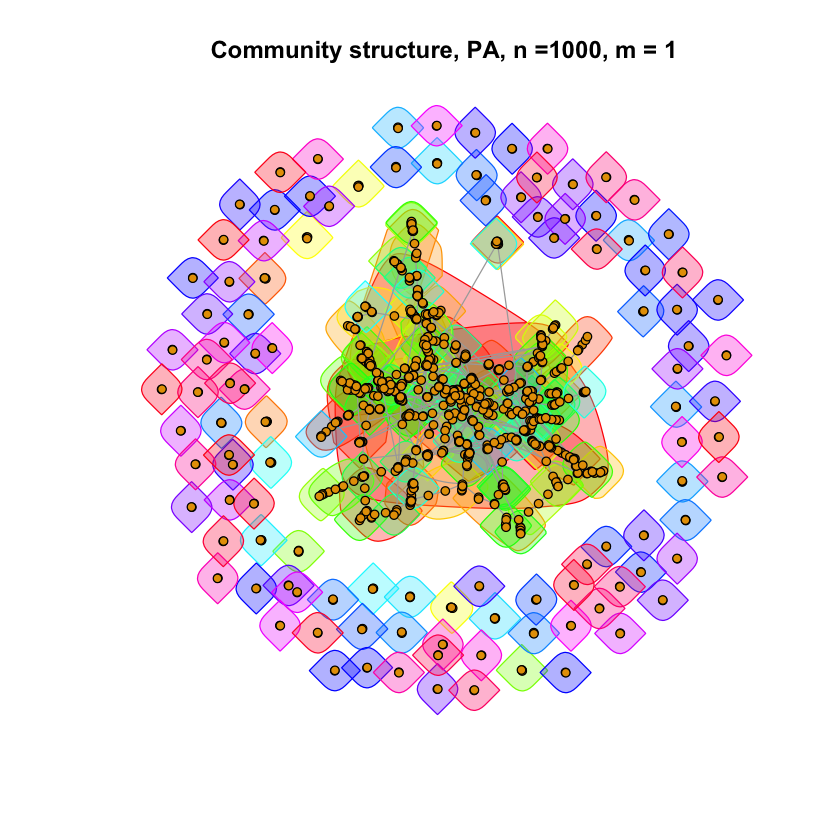

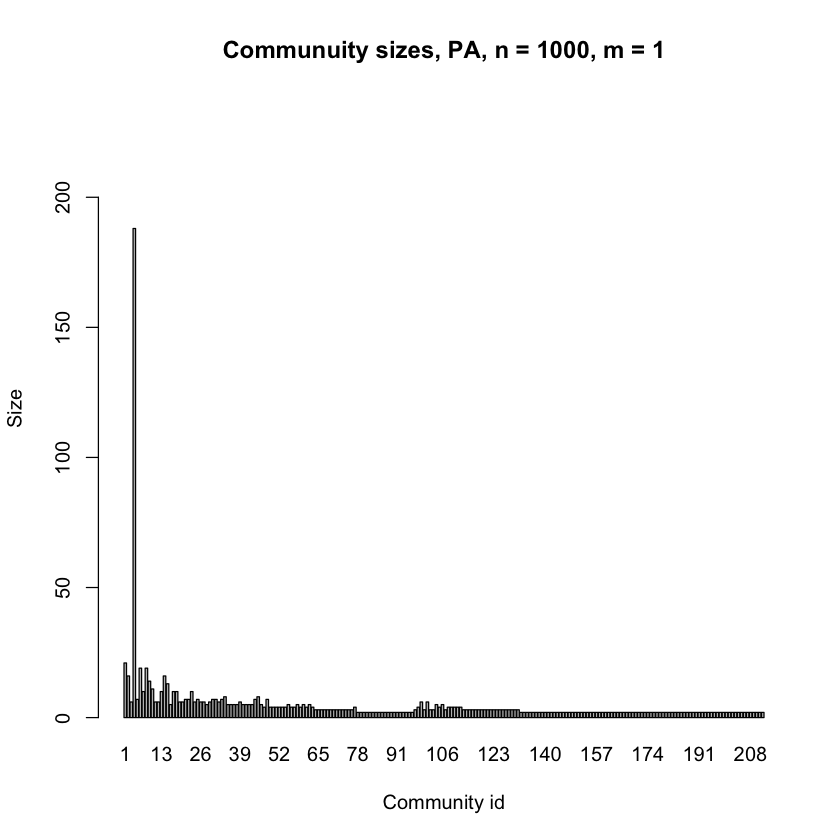

In [ ]:
g_stub_matched = sample_degseq(degree_g,method = "simple")

community <- walktrap.community(g_stub_matched)
mod <- modularity(community)

plot(g_stub_matched, vertex.label = "", vertex.size = 3, 
     main = "Undirected Network wirh preferential attachment model,n=1000,m=1")

plot(g_stub_matched, mark.groups = community, vertex.label = NA, vertex.size=3,
     main = "Community structure, PA, n =1000, m = 1")
print(paste("Modularity for PA model with n = 1000, m = 1:", mod))

com_sz <- sizes(community)

barplot(com_sz, main="Communuity sizes, PA, n = 1000, m = 1", xlab="Community id", ylab="Size",
  names.arg=c(1: length(com_sz)), ylim=c(0, max(com_sz) + 50))

#### Answer 2(h)

The modularity of the two networks are as follows;
The network with $n = 1000$ and $ m = 1$ has modularity $ 0.929 $. The network after the stub-matching process  has modularity $ 0.7425 $.

'Simple' mode was used to generate the graph by stub-matching. This method doesn't take into account whether there are loops formed in the network or not. Also this can lead to multiple edges. Thus walktrap community detection is necessary for this.

From the plots above, it can be seen than the network generated from the stub-matching process has a lot of nodes which are not connected hence reducing the number of connections in the community.

Since the stub-matching process is random, it may not generate a fully connected network. On the other hand with  the prefential attachment configuration, every new node connects to a node that is previously connected in the network hence ensuring that the network is always connected.

The lower modularity in the stub-matching network can be as a result of the sparseness, self-looping and due to multiple edges of the network.

#### Question 3 - (a)

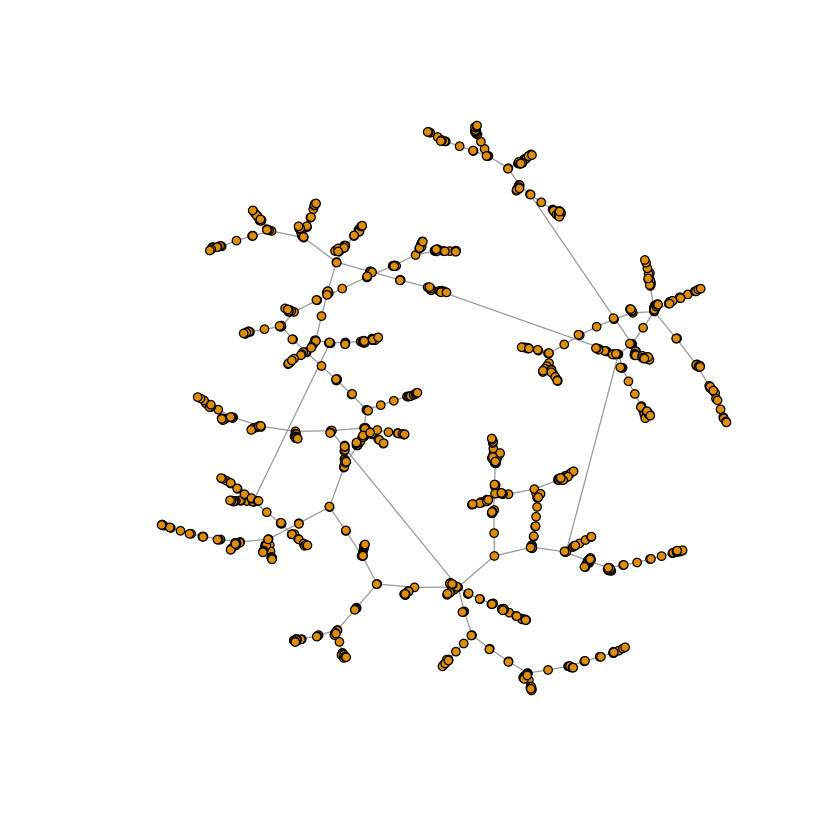


Call:
lm(formula = log_dist ~ log_degree)

Coefficients:
(Intercept)   log_degree  
      2.555       -3.032  



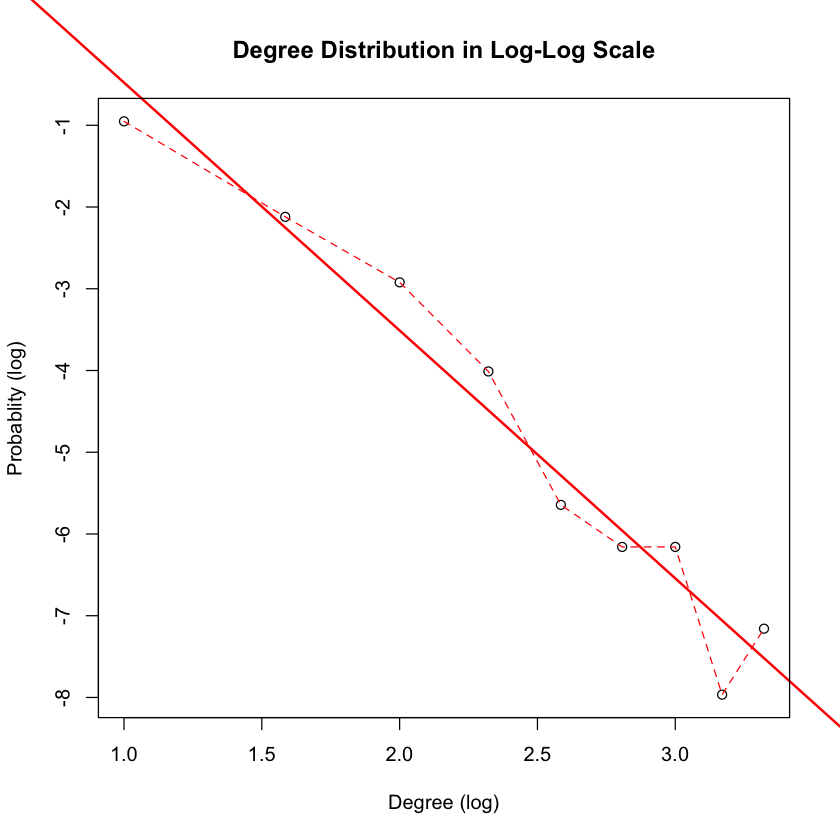

In [ ]:
#plot network
a = c = d = 1
b = 0

g <- sample_pa_age(n=1000, pa.exp=1, m=1, aging.exp=-1, zero.deg.appeal = a, 
                  zero.age.appeal=b, deg.coef=c, age.coef=d, aging.bin=1000, directed=FALSE)
plot(g, vertex.size=3, vertex.label="") 

#plot degree dist penalizing node age on log-log scale
degree_dist = degree.distribution(g)
idx = which(degree_dist != 0, arr.ind=TRUE)
log_degree <- log2(c(1:length(degree_dist)))[idx]
log_dist <- log2(degree_dist)[idx]

lr <- lm(log_dist ~ log_degree)

plot(log_degree, log_dist, abline(lr, col="red", lwd=2), main="Degree Distribution in Log-Log Scale",
 xlab="Degree (log)", ylab="Probablity (log)")
lines(log_degree, log_dist, lty=2, col="red")

print(lr) #slope

#### Answer (a)
Plot the degree distribution. What is the power law exponent?

Looking at the degree distribution for this network which penalizes the age of the node, we can see from the distribution on a log-log scale that as the degree increases, the probability decreases in a logrithmic scale. The slope, as defined from the model, is -3.032 which similarly makes the power law exponent~ 3.032. The power law exponent is the absolute of the slope here.

#### Question 3(b)

[1] "Modularity: 0.934370306242182"


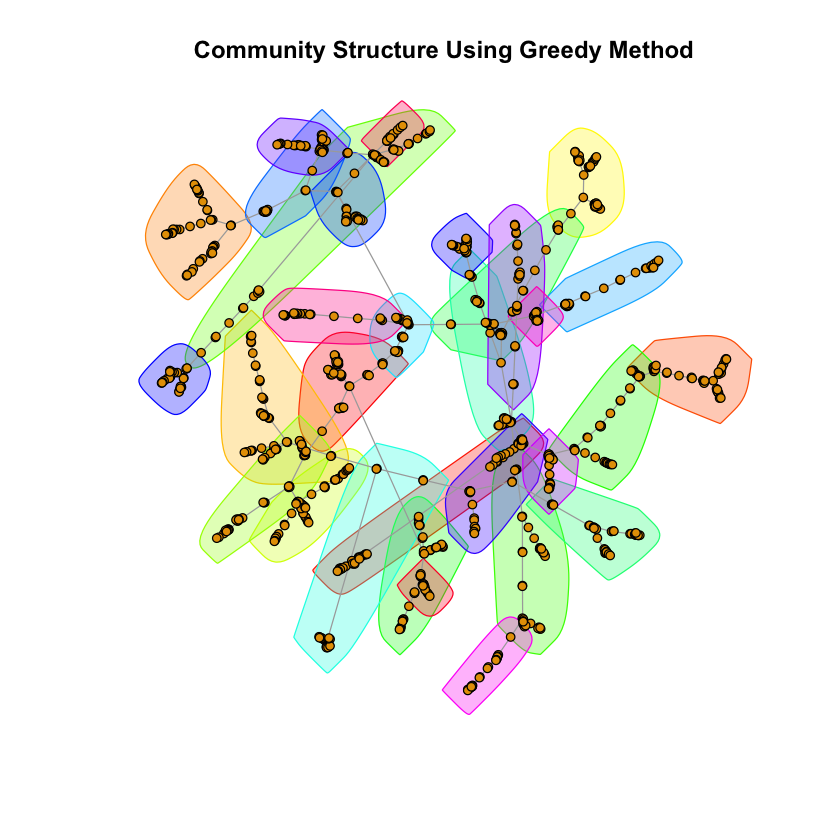

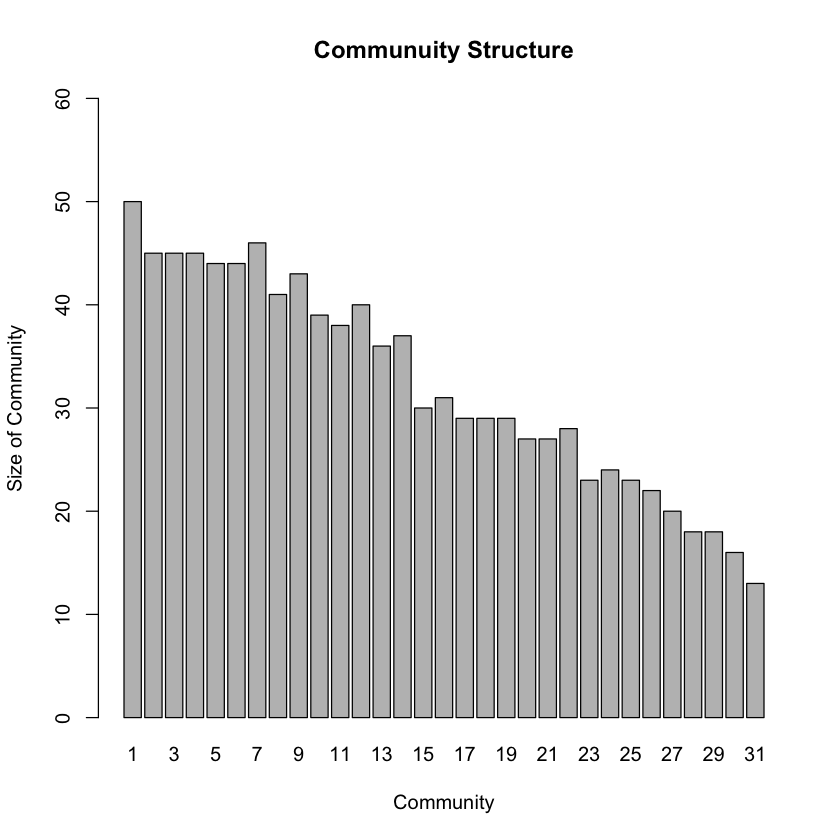

In [ ]:
community <- cluster_fast_greedy(g)
mod <- modularity(community)
print(paste('Modularity:', mod))

plot(g, mark.groups = community, vertex.size = 3, vertex.label= "", main="Community Structure Using Greedy Method")

#community structure
com <- sizes(community)

barplot(com, main= "Communuity Structure", xlab="Community", ylab="Size of Community",
  names.arg=c(1: length(com)), ylim=c(0, max(com) + 10))

#### Answer 3 (b) 
Use fast greedy method to find the community structure. What is the modularity?

Using the fast greedy method to find the community structure, we can see that the modularity is ~ 0.93. We can see that this method and the PA model are achieving a high modularity.

It is observed that the size of community is much more uniform as compared to simple Preferential Attachment network.

## Part 2: Random Walks on Networks

### Question 1  - Random walks on Erdos-Renyi networks

#### (a)

In [ ]:
g = random.graph.game(1000, 0.01, directed = FALSE)

#### (b)

In [ ]:
t = 100
ver_sequence = c(1:t)
create_transition_matrix = function (g){
    
    # WARNING: make sure your graph is connected (you might input GCC of your graph)
    
    vs = V(g)
    n = vcount(g)
    adj = as_adjacency_matrix(g)
    adj[diag(rowSums(adj) == 0)] = 1  # handle if the user is using the function for networks with isolated nodes by creating self-edges
    z = matrix(rowSums(adj, , 1))
    
    transition_matrix = adj / repmat(z, 1, n)  # normalize to get probabilities
    
    return(transition_matrix)
}


random_walk = function (g, num_steps, start_node, transition_matrix = NULL){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
    
        # fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        ver_sequence[i] = v
        PMF = transition_matrix[v, ]
        # perform random walk
        v = sample(1:vcount(g), 1, prob = PMF)
        if(i == t)
          # dis = distances(g,v= start_node, to=v)
          # dis = shortest.paths(g,)
          degree_ = degree(g,v)
    }
   return(list(distances = ver_sequence,degrees = degree_))
}

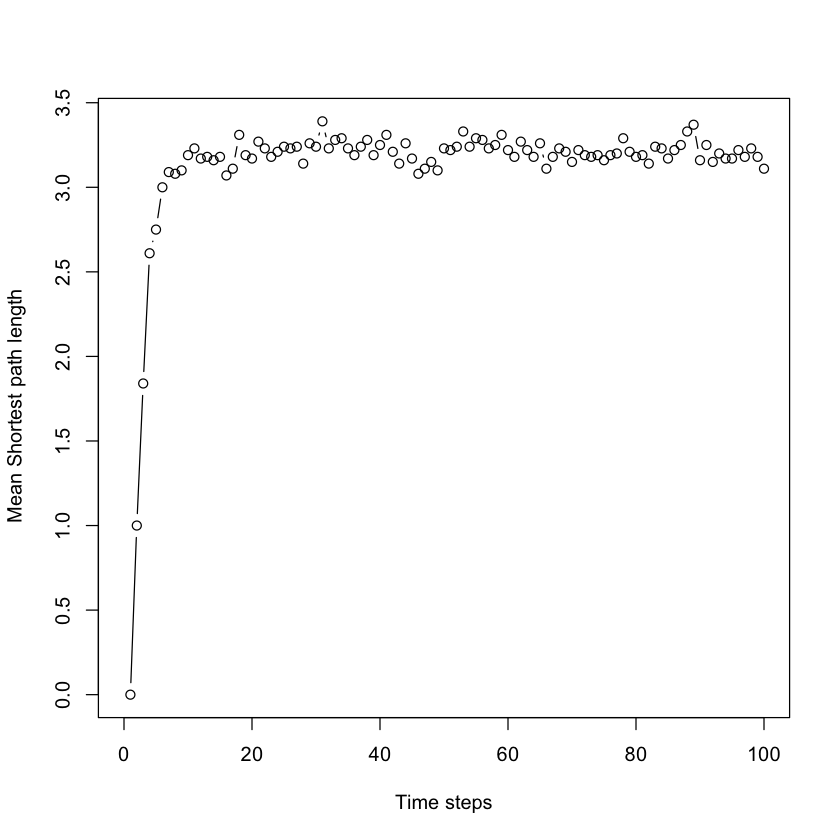

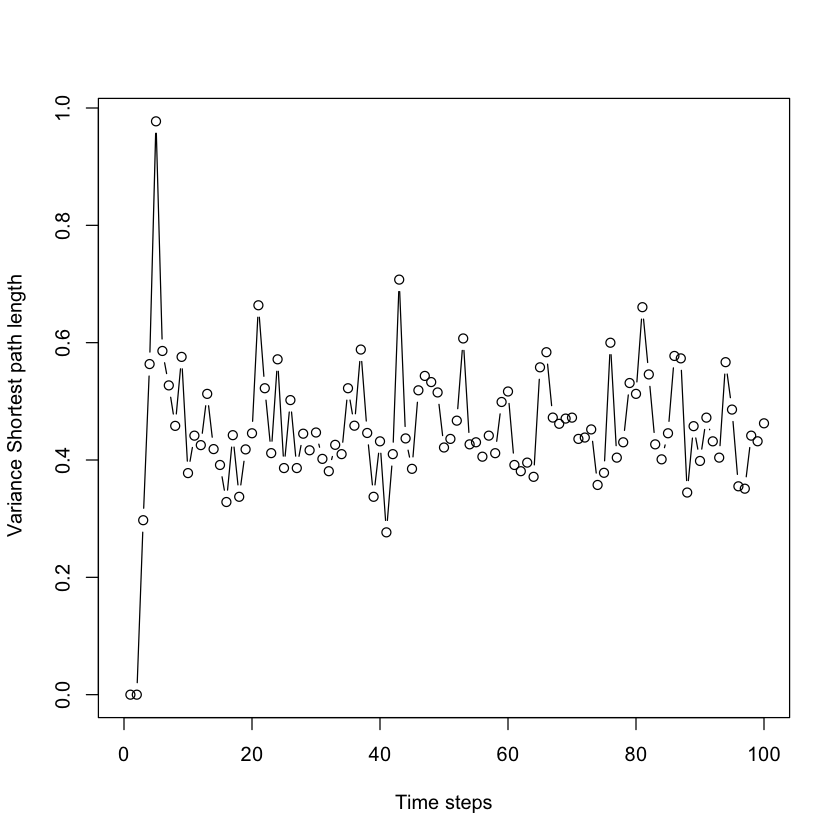

In [ ]:
# distances <- c(1:1000)
degree_list = c(1:100)
iters =100
distances = matrix(NA, nrow=iters, ncol=t)
smpl_nodes <- sample(1:vcount(g),100)
for(i in 1:iters){
    results = random_walk(g,t,smpl_nodes[i])
    # distance = results[['distances']][1]
    vertex_sequences = results[['distances']]
    end_node_degree = results[['degrees']][1]
    distances[i,] <- shortest.paths(g,vertex_sequences,smpl_nodes[i])
    degree_list[i] <- end_node_degree
}

plot(colMeans(distances),type="b", xlab='Time steps', ylab=' Mean Shortest path length', xlim=c(0,100))
plot(colVars(distances),type="b", xlab='Time steps', ylab=' Variance Shortest path length', xlim=c(0,100))

#### Answer:

In this question, we performed a 100 step random walk on the GCC of the graph, and the experiment is run for 1000 trials for generalization. 

The required graphs are plotted above.

We can see that the mean shortest path length increases with number of steps and then it converges to the value of approx. ~3.3 at around t = 10. For variance, it increases with number of steps and then it converges around ~0.45.

#### (c)

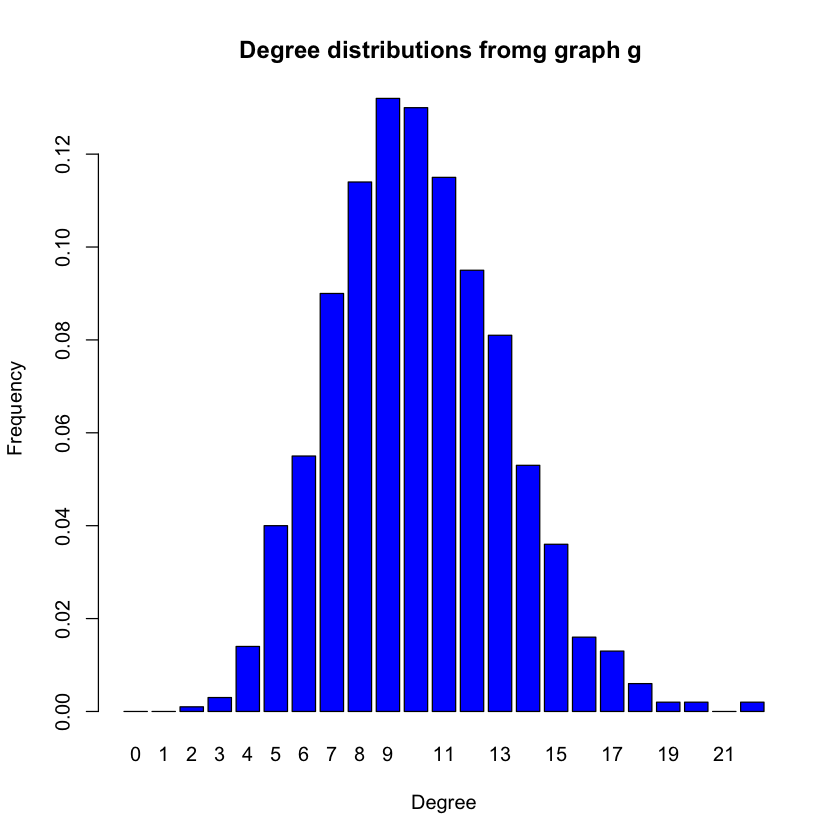

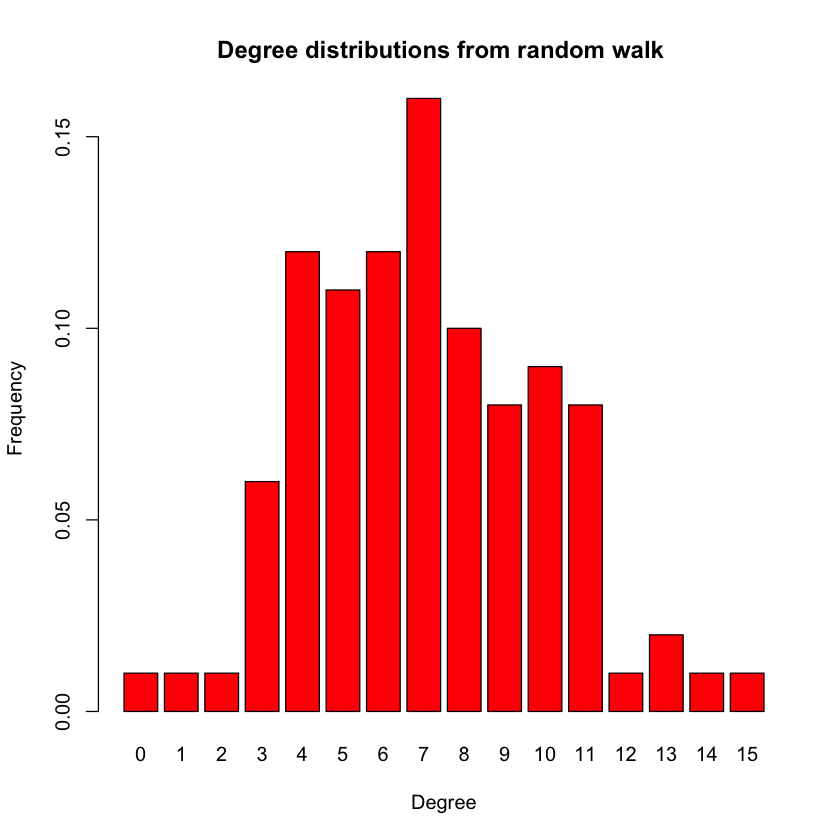

In [ ]:
#  degree distribution of graph
d_dist = degree.distribution(g)
xVals = c(0: (length(d_dist) - 1))
barplot(d_dist, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions fromg graph g " ,sep = " "), col="blue")


#  degree distribution from random walk over random nodes
freq = table(degree_list)/length(degree_list)
xVals = c(0: (length(freq) - 1))
barplot(freq, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions from random walk " ,sep = " "), col="red")

#### How does the degree distribution of the nodes reached at the end compare to that of the graph ?

Both distributions approximately follows a binomial distribution and have similar mean and variance.

#### (d)

In [ ]:
g = random.graph.game(10000, 0.01, directed = FALSE)
degree_list = c(1:100)
iters =100
distances = matrix(NA, nrow=iters, ncol=t)
smpl_nodes <- sample(1:vcount(g),100)

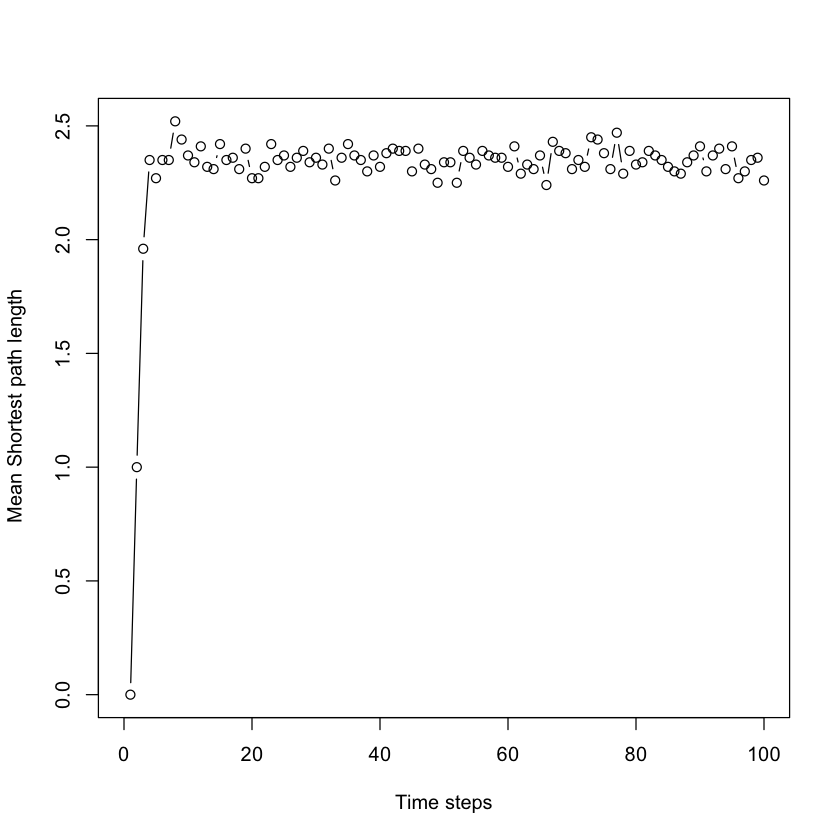

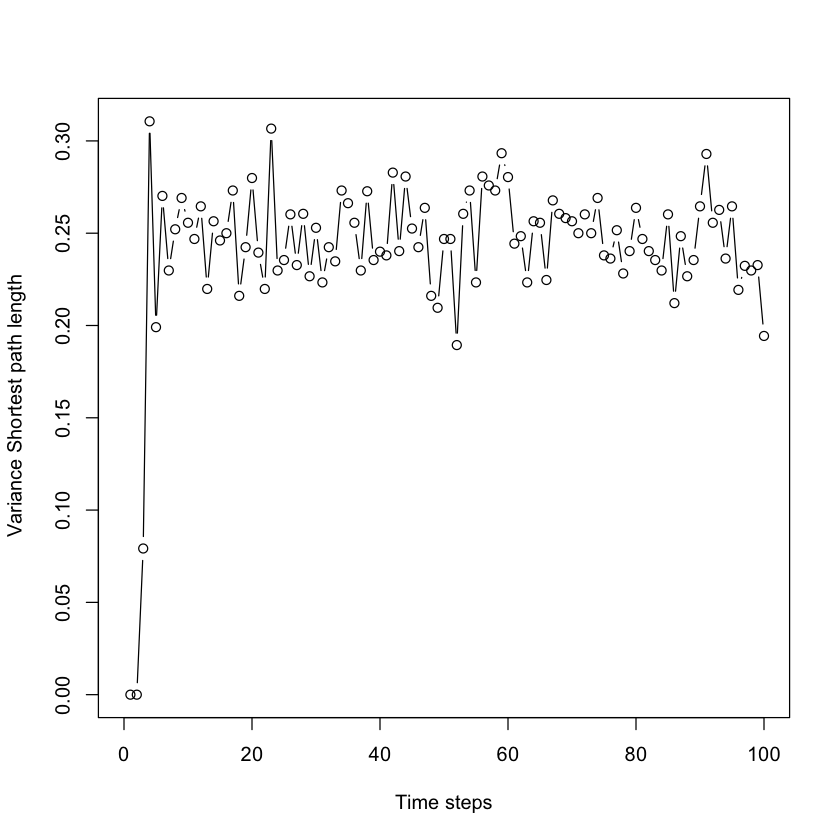

In [ ]:
for(i in 1:iters){
    results = random_walk(g,t,smpl_nodes[i])
    # distance = results[['distances']][1]
    vertex_sequences = results[['distances']]
    end_node_degree = results[['degrees']][1]
    distances[i,] <- shortest.paths(g,vertex_sequences,smpl_nodes[i])
    degree_list[i] <- end_node_degree
}

plot(colMeans(distances),type="b", xlab='Time steps', ylab=' Mean Shortest path length', xlim=c(0,100))
plot(colVars(distances),type="b", xlab='Time steps', ylab=' Variance Shortest path length', xlim=c(0,100))

In [ ]:
g = random.graph.game(10000, 0.01, directed = FALSE)
g1 = random.graph.game(1000, 0.01, directed = FALSE)
dia_g = diameter(g)
diag_g1 = diameter(g1)

In [ ]:
sprintf('diameter of network with 10000 nodes: %s ',dia_g)
sprintf('diameter of network with 1000 nodes: %s ',diag_g1)

[1] "diameter of network with 10000 nodes: 3 "

[1] "diameter of network with 1000 nodes: 5 "

#### Compare the results and explain qualitatively . Does the diameter of the network play a role ?

For the network with 10000 nodes and  diameter 3 , the average shortest path length reach a plateau approximately at a shorter time steps than the network with 1000 nodes and a diameter of 5 . This means larger networks converges to a steady state sooner. Also the larger network has a smaller diameter which means the network is more concentrated around the starting node leading in fewer steps to convergence.

#### Question 2 -  Random walk on networks with fat-tailed degree distribution

#### (a)

In [ ]:
g <- sample_pa(n = 1000, m = 1, directed = FALSE)

#### (b)

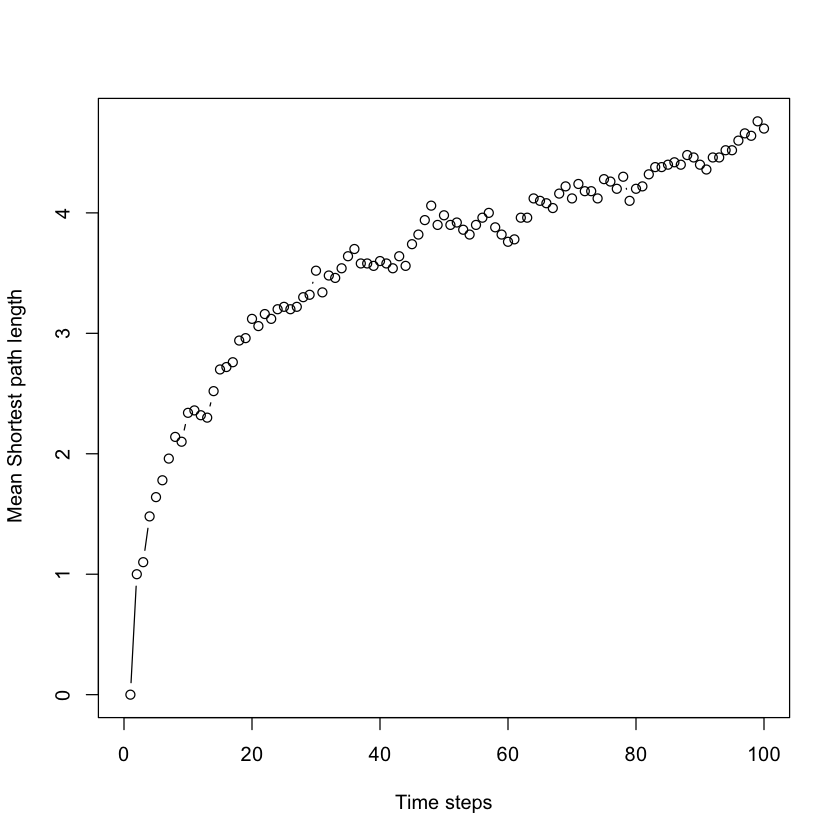

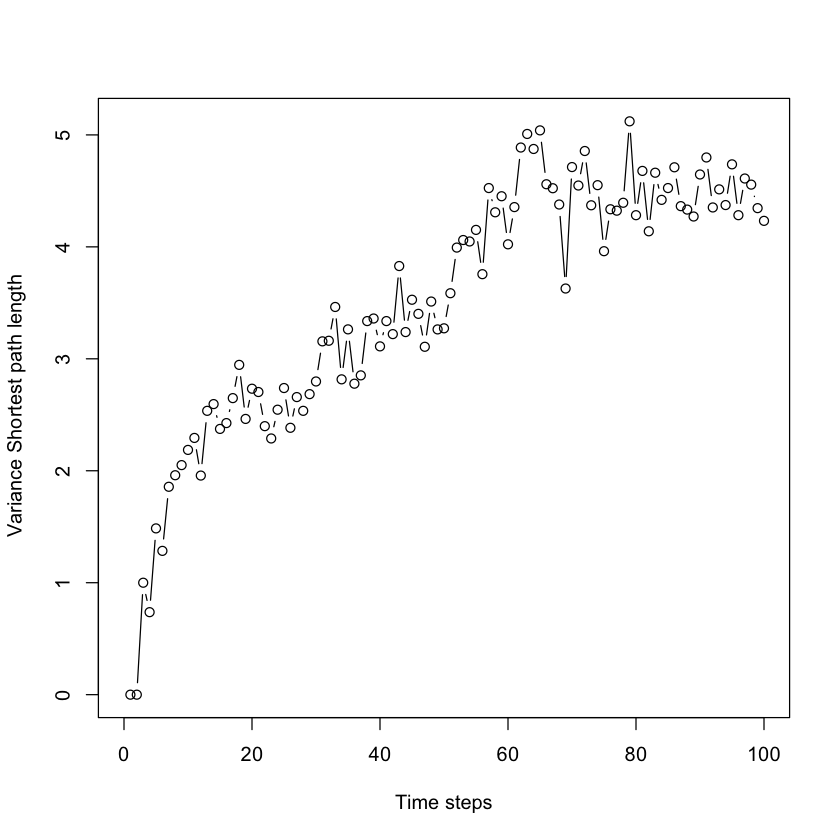

In [ ]:
degree_list = c(1:100)
iters =100
distances = matrix(NA, nrow=iters, ncol=t)
smpl_nodes <- sample(1:vcount(g),100)
for(i in 1:iters){
    results = random_walk(g,t,smpl_nodes[i])
    # distance = results[['distances']][1]
    vertex_sequences = results[['distances']]
    end_node_degree = results[['degrees']][1]
    distances[i,] <- shortest.paths(g,vertex_sequences,smpl_nodes[i])
    degree_list[i] <- end_node_degree
}

plot(colMeans(distances),type="b", xlab='Time steps', ylab=' Mean Shortest path length', xlim=c(0,100))
plot(colVars(distances),type="b", xlab='Time steps', ylab=' Variance Shortest path length', xlim=c(0,100))

#### Answer:
The required plots for s(t) vs t and $\sigma^{2}(t)$ vs t are shown above.

Contrary to Erdos-renyi network, the Mean and Variance curves are not able to attain a steady state value even after a large number of steps. This is because, a random walker will usually end up at a node with higher degree node, due to the way the preferential attachment networks are built. 


#### (c)

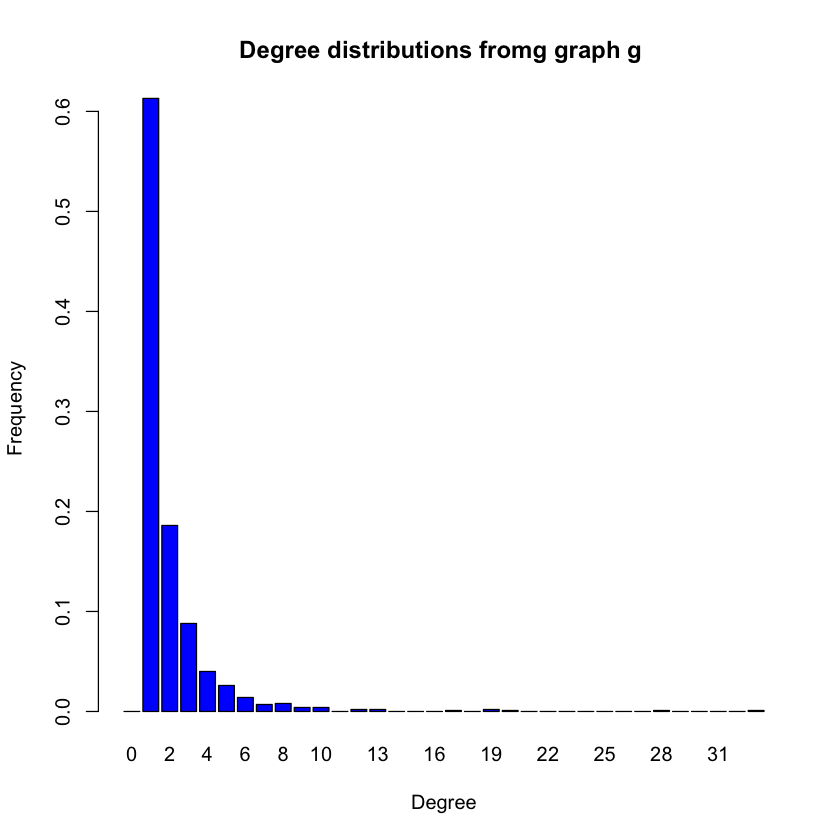

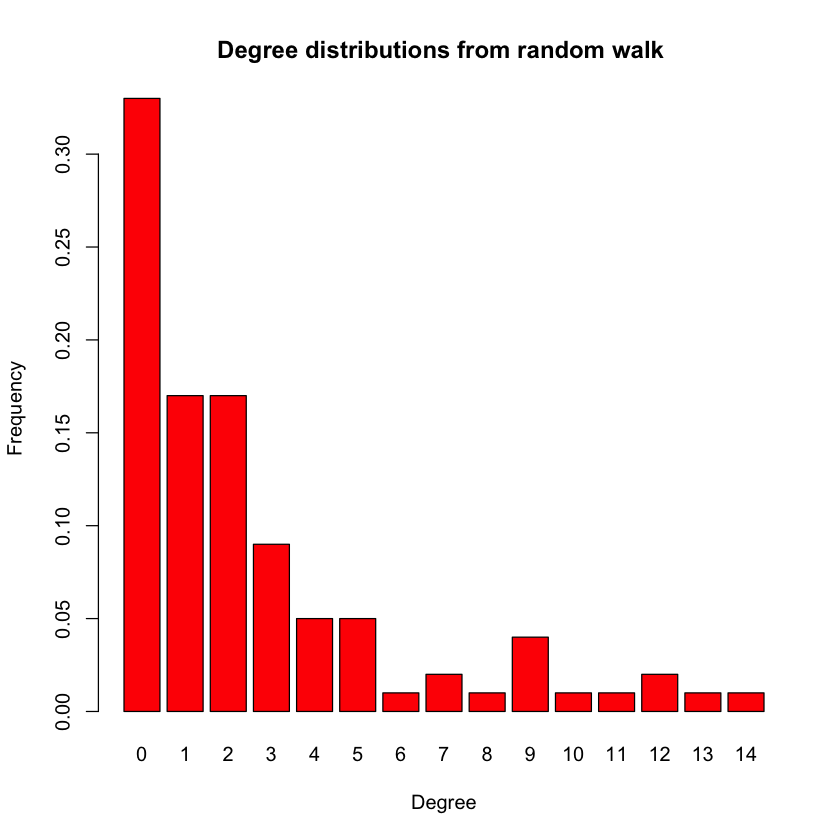

In [ ]:
#  degree distribution of graph
d_dist = degree.distribution(g)
xVals = c(0: (length(d_dist) - 1))
barplot(d_dist, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions fromg graph g " ,sep = " "), col="blue")


#  degree distribution from random walk over random nodes
freq = table(degree_list)/length(degree_list)
xVals = c(0: (length(freq) - 1))
barplot(freq, names.arg=xVals, xlab="Degree", ylab="Frequency",
            main = paste("Degree distributions from random walk " ,sep = " "), col="red")

#### How does the degree distribution of the nodes reached at the end compare to that of the graph ?

Both distributions approximately follows a power law distribution with :

<center>$P_{k} \propto \frac{1}{k^{\gamma}} $</center>

#### (d)


In [ ]:
g <- sample_pa(n = 100, m = 1, directed = FALSE)
g1 <- sample_pa(n = 10000, m = 1, directed = FALSE)

In [ ]:
degree_list = c(1:100)
iters =100
distances = matrix(NA, nrow=iters, ncol=t)
smpl_nodes <- sample(1:vcount(g),100)
for(i in 1:iters){
    results = random_walk(g,t,smpl_nodes[i])
    # distance = results[['distances']][1]
    vertex_sequences = results[['distances']]
    end_node_degree = results[['degrees']][1]
    distances[i,] <- shortest.paths(g,vertex_sequences,smpl_nodes[i])
    degree_list[i] <- end_node_degree
}


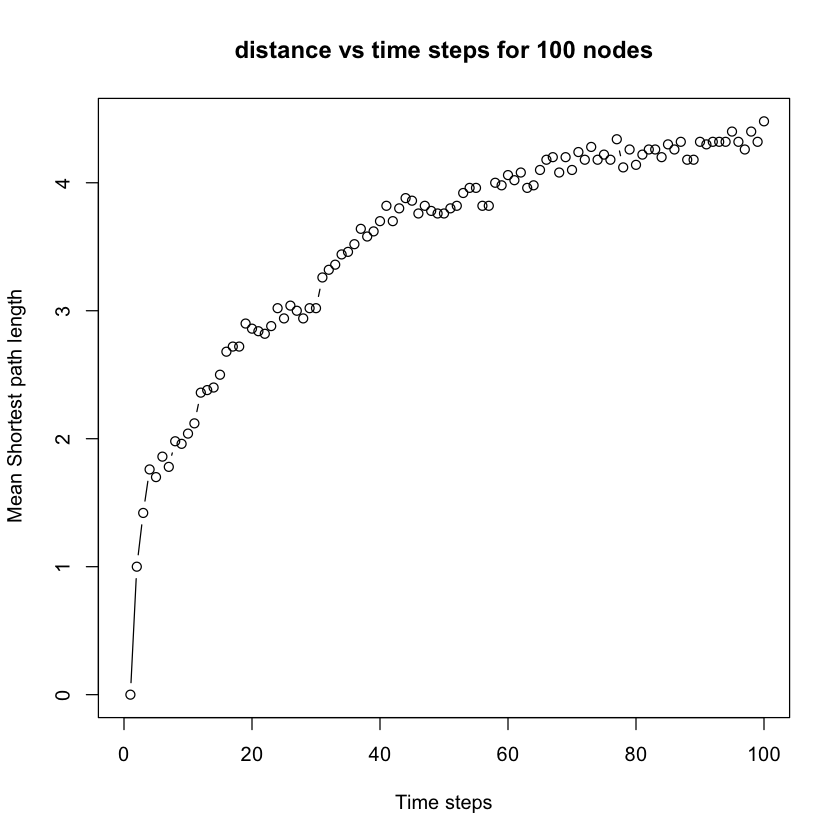

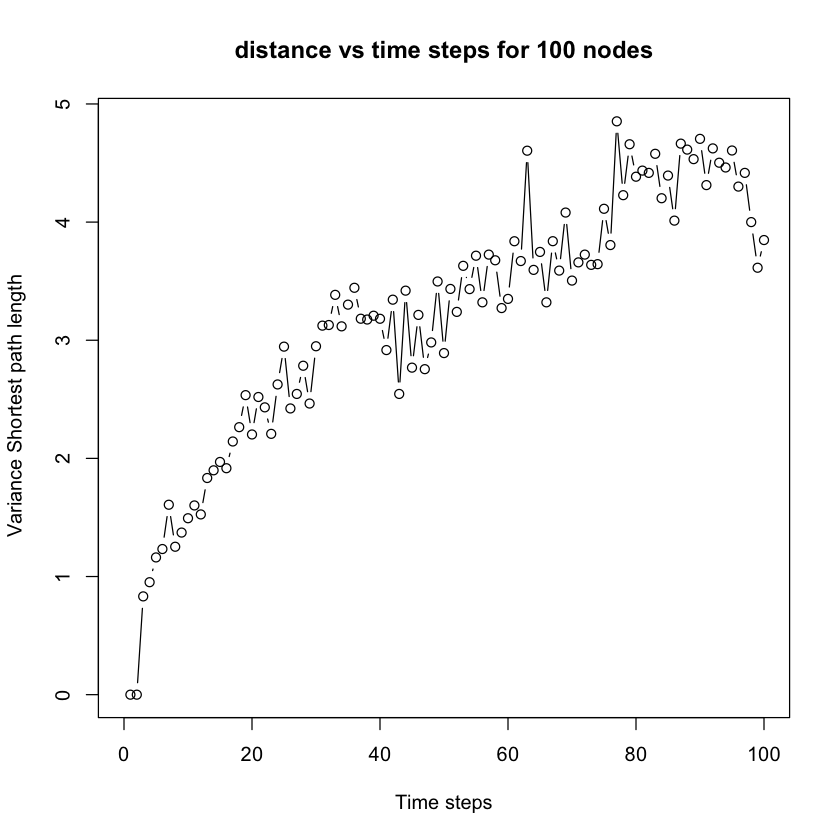

In [ ]:
plot(colMeans(distances),type="b", xlab='Time steps', ylab=' Mean Shortest path length', main= paste('distance vs time steps for 100 nodes'), xlim=c(0,100))
plot(colVars(distances),type="b", xlab='Time steps', ylab=' Variance Shortest path length',main= paste('distance vs time steps for 100 nodes'), xlim=c(0,100))


In [ ]:
degree_list = c(1:100)
iters =100
distances = matrix(NA, nrow=iters, ncol=t)
smpl_nodes <- sample(1:vcount(g1),100)
for(i in 1:iters){
    results = random_walk(g1,t,smpl_nodes[i])
    # distance = results[['distances']][1]
    vertex_sequences = results[['distances']]
    end_node_degree = results[['degrees']][1]
    distances[i,] <- shortest.paths(g1,vertex_sequences,smpl_nodes[i])
    degree_list[i] <- end_node_degree
}

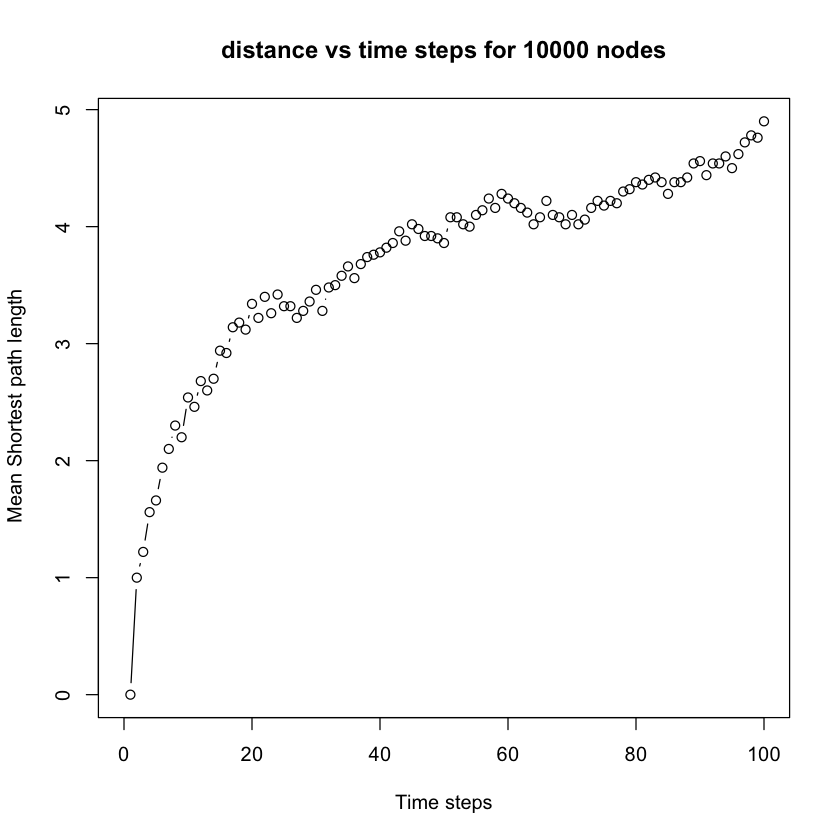

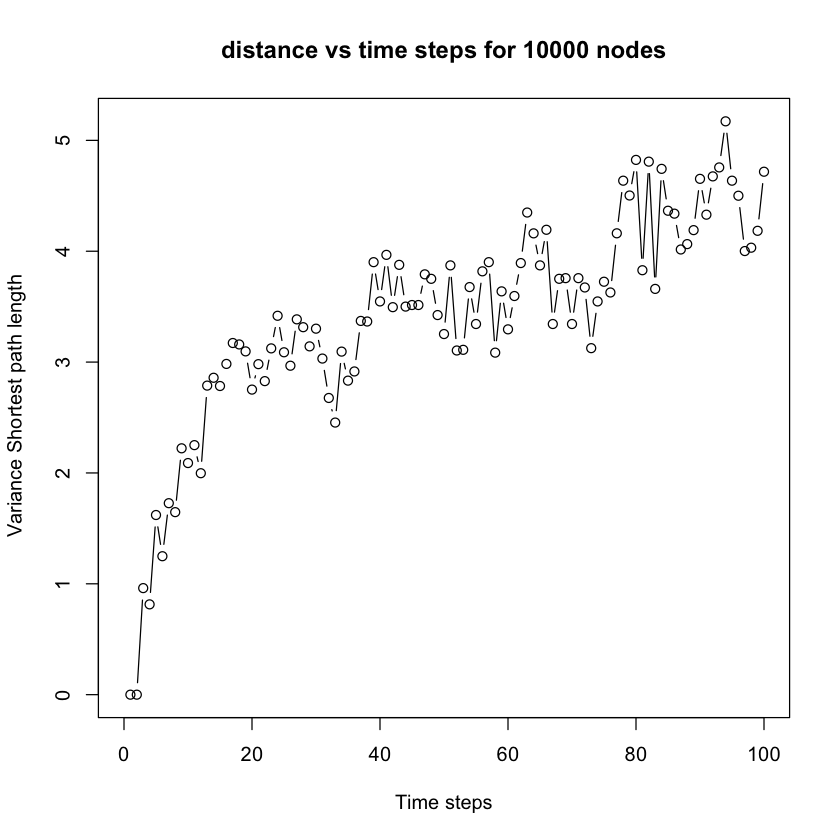

In [ ]:
plot(colMeans(distances),type="b", xlab='Time steps', ylab=' Mean Shortest path length', main= paste('distance vs time steps for 10000 nodes'), xlim=c(0,100))
plot(colVars(distances),type="b", xlab='Time steps', ylab=' Variance Shortest path length',main= paste('distance vs time steps for 10000 nodes'), xlim=c(0,100))


In [ ]:
g <- sample_pa(n = 100, m = 1, directed = FALSE)
g1 <- sample_pa(n = 10000, m = 1, directed = FALSE)
g2 <- sample_pa(n = 1000, m = 1, directed = FALSE)
dia = diameter(g)
dia_1 = diameter(g1)
dia_2 = diameter(g2)
sprintf('diameter of network with 100 nodes: %s ',dia)
sprintf('diameter of network with 1000 nodes: %s ',dia_2)
sprintf('diameter of network with 10000 nodes: %s ',dia_1)

[1] "diameter of network with 100 nodes: 12 "

[1] "diameter of network with 1000 nodes: 22 "

[1] "diameter of network with 10000 nodes: 29 "

#### Compare the results and explain qualitatively . Does the diameter of the network play a role ?

When the number of nodes in the network increases,the number of steps needed for the average shortest path length and its variance to converge also increases. We can see that the larger network converges to the steady state slowly as compared to the others. As the number of nodes increases , the diameter of the network also increases and hence larger diameter means the network is less concentrated at the starting node leading to more steps until convergence.

Larger networks tend to have more communities and with Preferential Attachment method, the communities tend to be more concentrated and thus with random walks, a walker will end up at a node with high degree and which far from the starting node. 

### Question 3 - Page Rank

In [ ]:
# Helper functions for Transition matrix and Random walks

create_transition_matrix = function (g){
    
    # WARNING: make sure your graph is connected (you might input GCC of your graph)
    
    vs = V(g)
    n = vcount(g)
    adj = as_adjacency_matrix(g)
    adj[diag(rowSums(adj) == 0)] = 1  # handle if the user is using the function for networks with isolated nodes by creating self-edges
    z = matrix(rowSums(adj, , 1))
    
    transition_matrix = adj / repmat(z, 1, n)  # normalize to get probabilities
    
    return(transition_matrix)
}


random_walk = function (g, num_steps, start_node, transition_matrix, alpha, p_type){
    traversed = rep(0, num_steps)
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    if(p_type == 'uniform') {
        v_probs = rep(1/vcount(g), vcount(g))
    }
    if(p_type == 'page_rank') {
        v_probs = page_rank(g, directed = TRUE)$vector
    }
    if(p_type == 'median_page_rank') {
        pr = page_rank(g, directed = TRUE)$vector
        ordered = order(pr)
        n_vertices = vcount(g)
        v_probs = rep(0, n_vertices)
        medians = c(ceil(n_vertices / 2), ceil((n_vertices + 1) / 2))
        v_probs[medians] = 0.5
    }
    else {
        v_probs = rep(1/vcount(g), vcount(g))
    }
    
    for(i in 1:num_steps){
#         fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        if(runif(1) < alpha) {
            v = sample(1: vcount(g), 1, prob = v_probs)
        } else {
            PMF = transition_matrix[v, ]
            v = sample(1:vcount(g), 1, prob = PMF)   
        } 
        traversed[i] = v
    }
    return(traversed)
}


#### 3(a)

In [ ]:
## Creating edges

g1 <- sample_pa(n = 1000, m = 4, directed = TRUE)
g2 <- sample_pa(n = 1000, m = 4, directed = TRUE)

# Create a new graph by permuting edges
shuffled_vertices <- sample(vcount(g2))
permuted <- permute(g2, shuffled_vertices)

# getting new edges
edg <- as_edgelist(permuted)
g_final <- add_edges(g1, c(t(edg)))

In [ ]:
# Probability that walker visits each node.

iters = 100
freq = rep(0, 1000)
n_steps = vcount(g_final)
SSteps = ceiling(log(vcount(g_final)))

for(i in (1:iters)) {
    walk = random_walk(g_final, n_steps, sample(vcount(g_final), 1), NULL, 0.0, '')
    
    for (j in (1: n_steps)) {
        freq[walk[j]] = freq[walk[j]] + 1
    }
}

freq = freq / ((n_steps - SSteps) * iters)

[1] "Pearson Correlation between Degree of nodes and visit prob::  0.924703356424859"


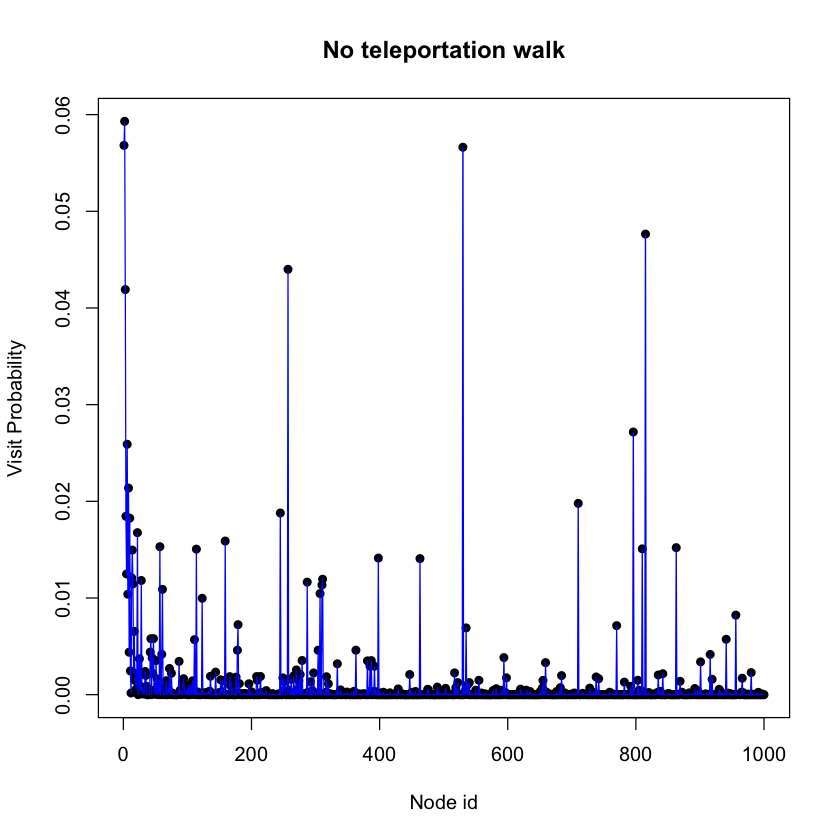

In [ ]:
plot((1:1000), freq, pch=16, xlab="Node id", ylab="Visit Probability", main="No teleportation walk")
lines(freq, col='blue')

print(paste("Pearson Correlation between Degree of nodes and visit prob:: ", cor(degree(g_final), freq)))

[1] "Intercept and slope:: "

Call:
lm(formula = freq ~ degree(g_final))

Coefficients:
    (Intercept)  degree(g_final)  
     -0.0015770        0.0001619  



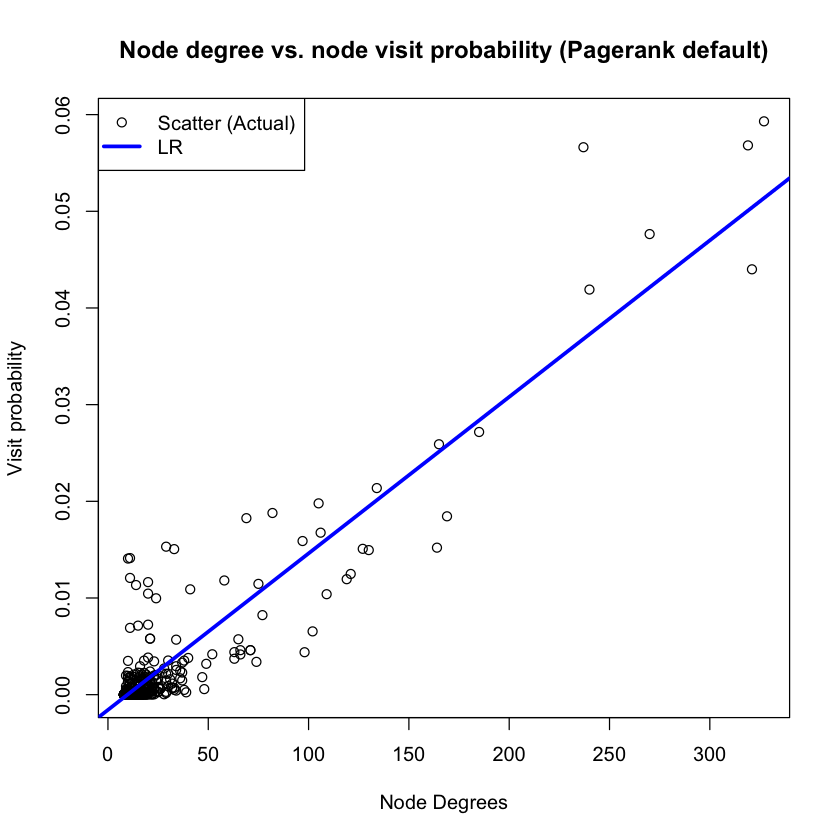

In [ ]:
plot(degree(g_final), freq , xlab='Node Degrees', ylab='Visit probability',main="Node degree vs. node visit probability (Pagerank default)")

abline(lm(freq ~ degree(g_final)), col="blue",lwd=3,lty=1)
legend('topleft', legend = c("Scatter (Actual)", "LR"),
       lty = c(NA, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('black','blue'))

print("Intercept and slope:: ")
print(lm(freq ~ degree(g_final)))


#### Answer 3(a)

In this question, we created two preferential networks with m = 4, the edges were shuffled and these edges were added to the existing graph to tackle the possibility of being trapped at a node with no outbound edges. To measure the probability that a walker visits each node is calculated by using 100 random walks with 1000 steps each. Also only the steps beyond ln(n) were counted.

Probability to visit nodes is given by:

<center>$=\frac{\text{Nodes visited}}{100 * (1000 - ln(n))} $</center>

From above account(Visit Probability vs Node id plot) we can see that there are peaks in the distribution which implies the probablity to visit certain nodes is higher compared to the others. This can be explained via next plot between (Visit Probability vs Node Degrees) which tells us that Nodes with higher degrees have higher visit probabilities and the generlaization is verified with the high correlation coeffecient of 0.924703356424859 and the Linear regression line fit with the slope of 0.0001619 to support this. 

This behaviour is quite expected with the Preferential Attachment networks, since these networks tend to select nodes with high degree when a random walk is performed. For directed networks the page-rank score is given by equation:</br>



</br><center>$\pi(i) = \sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi(j),$</center>

where |V| is the number of nodes.

For preferential networks, the page rank score for nodes with higher degrees is thus high and hence they are expected to be visited more during the random walks.

#### 3(b)

In [ ]:
iters = 100
freq = rep(0, 1000)
n_steps = vcount(g_final)
SSteps = ceiling(log(vcount(g_final)))

for(i in (1:iters)) {
    walk = random_walk(g_final, n_steps, sample(vcount(g_final), 1), NULL, 0.15, 'uniform')
    
    for (j in (1: n_steps)) {
        freq[walk[j]] = freq[walk[j]] + 1
    }
}

freq = freq / ((n_steps - SSteps) * iters)

[1] "Pearson Correlation between Degree of nodes and visit prob::  0.942275376367606"


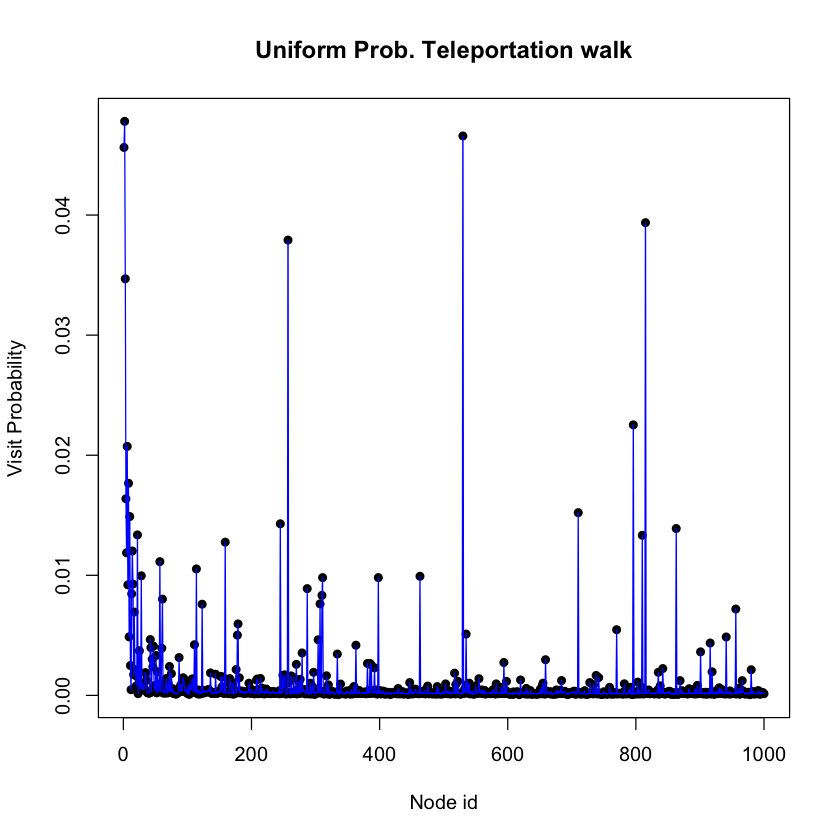

In [ ]:
plot((1:1000), freq, pch=16, xlab="Node id", ylab="Visit Probability", main="Uniform Prob. Teleportation walk")
lines(freq, col='blue')

print(paste("Pearson Correlation between Degree of nodes and visit prob:: ", cor(degree(g_final), freq)))

[1] "Intercept and slope:: "

Call:
lm(formula = freq ~ degree(g_final))

Coefficients:
    (Intercept)  degree(g_final)  
     -0.0011289        0.0001338  



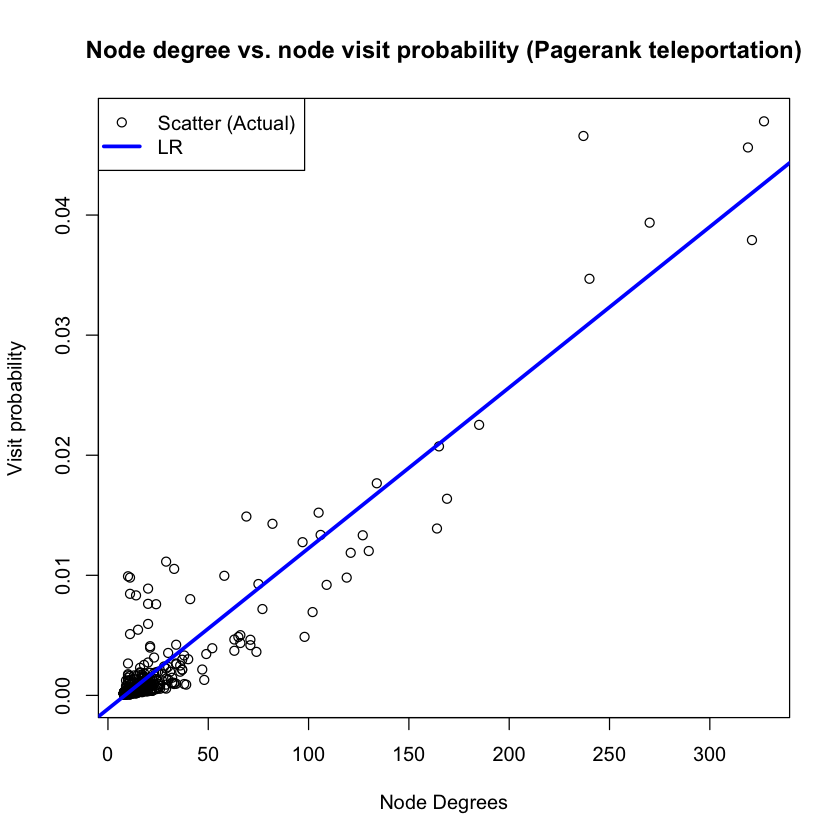

In [ ]:
plot(degree(g_final), freq , xlab='Node Degrees', ylab='Visit probability',main="Node degree vs. node visit probability (Pagerank teleportation)")

abline(lm(freq ~ degree(g_final)), col="blue",lwd=3,lty=1)
legend('topleft', legend = c("Scatter (Actual)", "LR"),
       lty = c(NA, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('black','blue'))

print("Intercept and slope:: ")
print(lm(freq ~ degree(g_final)))

#### Answer 3(b)

In this question, we are asked to use teleportation probability of 0.15 to account for 15% chances of jumping between to non connected nodes at a given random walk step. The page rank vector is given by:

</br><center>$\pi(i) = (1 - \alpha)\sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi(j) + \frac{\alpha}{|V|},$</center>

where |V| is the number of nodes.

The relationship between node visit probability and nodes is similar to previous question which was without random walk. Also there is an linearly increasing relationship between node visit probability w.r.t node degree. The reason is the same as explained in previous question 3(a) with the correlation coefficient value as: 0.942275376367606  but there is a difference in terms of the slopes of the two linear regression fit lines. The slope obtained for this question is: 0.0001338 which is slightly less compared to random walk without teleportation. This reduction is due to the fact that there is now less weightage (0.85) = $(1 - \alpha)$ to the term which selects the node in a random walk based the degree count.

### Personalised PageRank

#### 4(a)

In [ ]:
iters = 100
freq = rep(0, 1000)
n_steps = vcount(g_final)
SSteps = ceiling(log(vcount(g_final)))

for(i in (1:iters)) {
    walk = random_walk(g_final, n_steps, sample(vcount(g_final), 1), NULL, 0.15, 'page_rank')
    
    for (j in (1: n_steps)) {
        freq[walk[j]] = freq[walk[j]] + 1
    }
}

freq = freq / ((n_steps - SSteps) * iters)

[1] "Pearson Correlation between Degree of nodes and visit prob::  0.944742921106346"


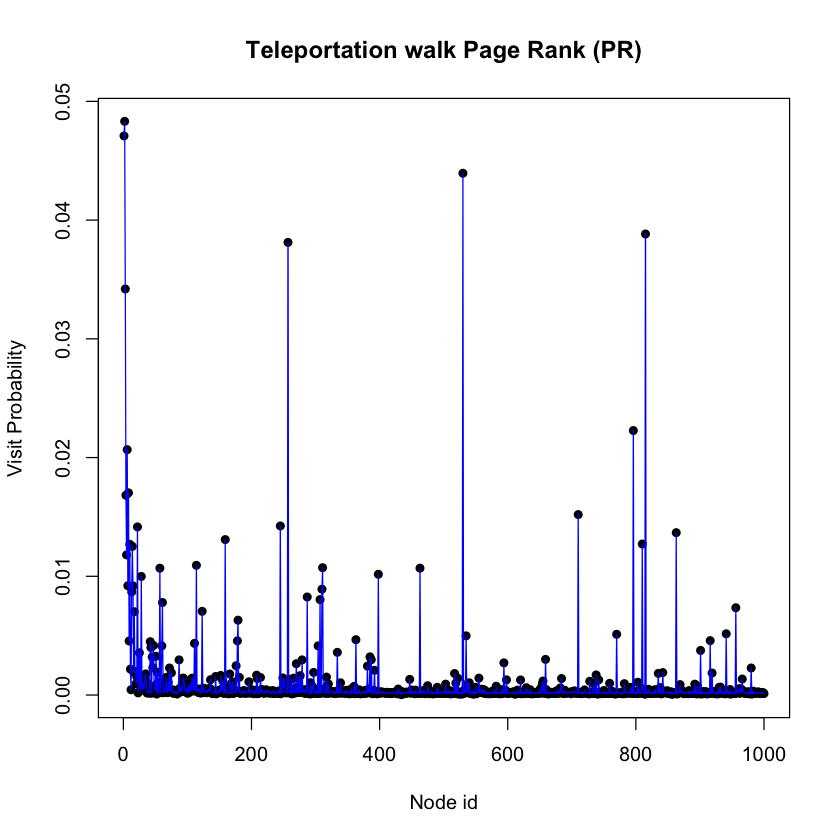

In [ ]:
plot((1:1000), freq, pch=16, xlab="Node id", ylab="Visit Probability", main="Teleportation walk Page Rank (PR)")
lines(freq, col='blue')

print(paste("Pearson Correlation between Degree of nodes and visit prob:: ", cor(degree(g_final), freq)))

[1] "Intercept and slope:: "

Call:
lm(formula = freq ~ degree(g_final))

Coefficients:
    (Intercept)  degree(g_final)  
     -0.0011243        0.0001335  



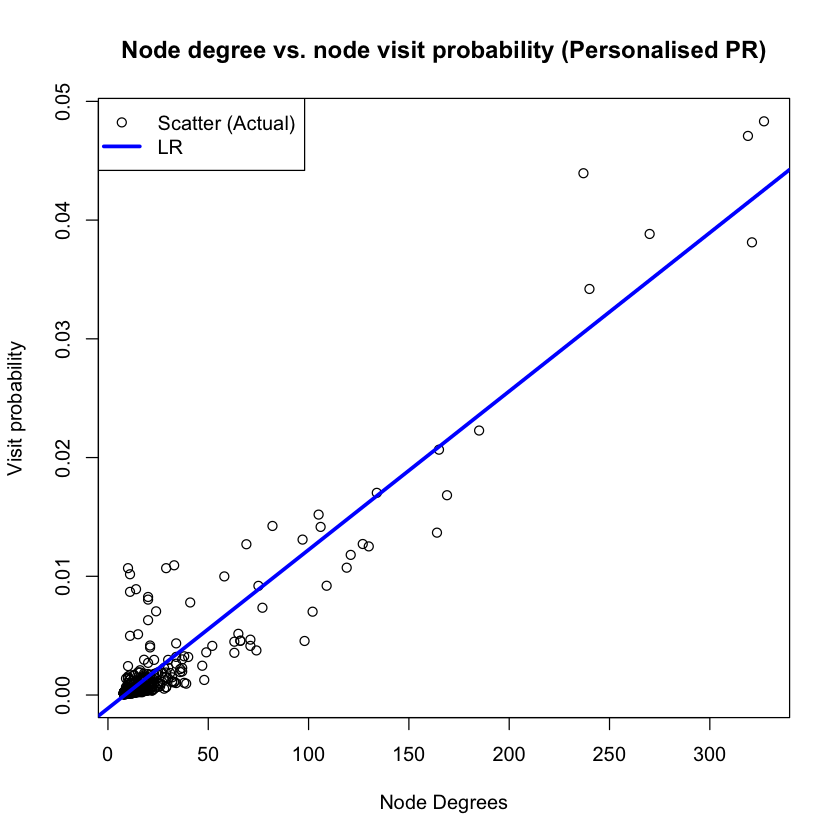

In [ ]:
plot(degree(g_final), freq , xlab='Node Degrees', ylab='Visit probability',main="Node degree vs. node visit probability (Personalised PR)")

abline(lm(freq ~ degree(g_final)), col="blue",lwd=3,lty=1)
legend('topleft', legend = c("Scatter (Actual)", "LR"),
       lty = c(NA, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('black','blue'))

print("Intercept and slope:: ")
print(lm(freq ~ degree(g_final)))

#### Answer 4(a)

For this question we are asked to implement personalised pagerank with teleportation, in which the probability to visit nodes during teleportation is equal to it's pagerank instead of being uniform (1/ N). The plots for Visit probablity for each node and (Visit probablity vs Node degree) are given above. The relationship is quite similar to page rank with uniform distribution (3(b)) and default page rank random walk(3(a)). 

We observe that the probability to visit a node linearly increases with its node degree as shown above. The correlation for this observation is quite strong and is equal to 0.944742921106346. The slope of this linear relationship is given by: 0.0001335. 

Comparing the results from part 3(a):

Slope of LR fit 3(a): 0.0001619  <br>
Slope of LR fit 4(a): 0.0001335

Intuitively, page-rank with uniform teleportation probabilities will have better chances for nodes with low degrees to be visited contrary to page-rank with personalised(node's page-rank) probablities and thus will lead to still less visits of low degree nodes. This is evident from the slopes of the two methods where 4(a) has less slope compared to 3(a).

#### 4(b)

In [ ]:
iters = 100
freq = rep(0, 1000)
n_steps = vcount(g_final)
SSteps = ceiling(log(vcount(g_final)))

for(i in (1:iters)) {
    walk = random_walk(g_final, n_steps, sample(vcount(g_final), 1), NULL, 0.15, 'median_page_rank')
    
    for (j in (1: n_steps)) {
        freq[walk[j]] = freq[walk[j]] + 1
    }
}

freq = freq / ((n_steps - SSteps) * iters)

[1] "Pearson Correlation between Degree of nodes and visit prob::  0.700075550257851"


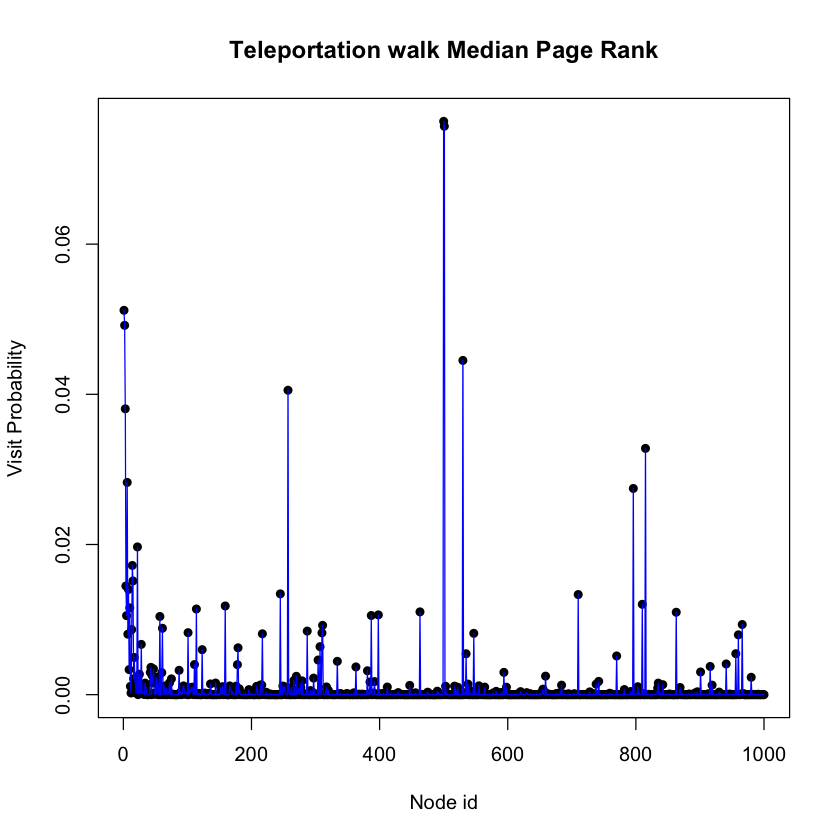

In [ ]:
plot((1:1000), freq, pch=16, xlab="Node id", ylab="Visit Probability", main="Teleportation walk Median Page Rank")
lines(freq, col='blue')

print(paste("Pearson Correlation between Degree of nodes and visit prob:: ", cor(degree(g_final), freq)))

[1] "Intercept and slope:: "

Call:
lm(formula = freq ~ degree(g_final))

Coefficients:
    (Intercept)  degree(g_final)  
     -0.0011575        0.0001356  



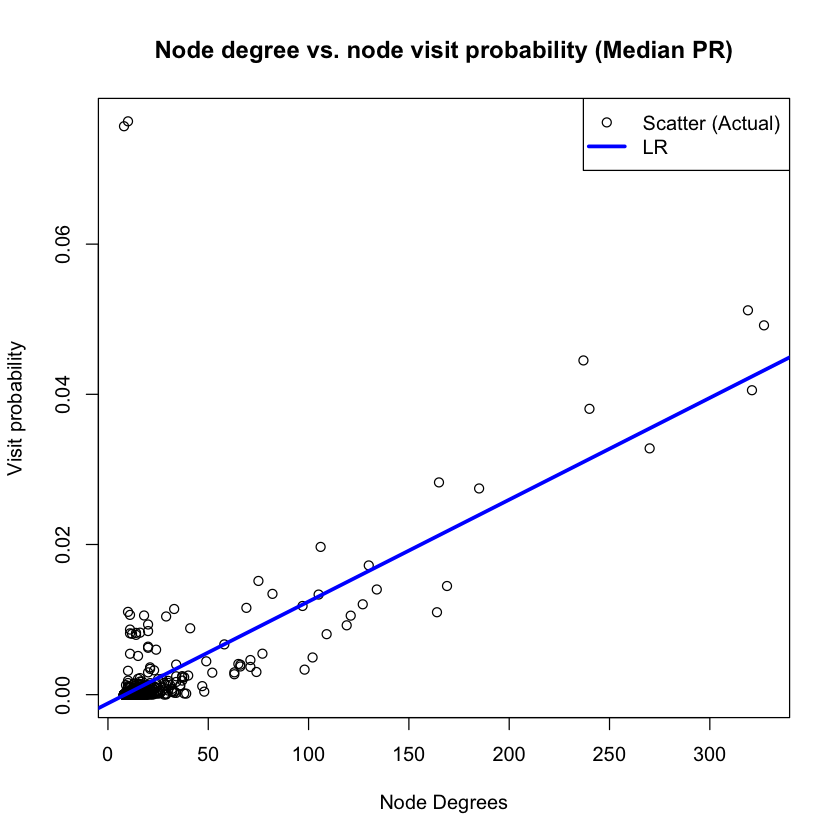

In [ ]:
plot(degree(g_final), freq , xlab='Node Degrees', ylab='Visit probability',main="Node degree vs. node visit probability (Median PR)")

abline(lm(freq ~ degree(g_final)), col="blue",lwd=3,lty=1)
legend('topright', legend = c("Scatter (Actual)", "LR"),
       lty = c(NA, 1), lwd = c(1,3), pch=c(1,NA),
       col = c('black','blue'))

print("Intercept and slope:: ")
print(lm(freq ~ degree(g_final)))

#### Answer 4(b)

From above plots we see that two nodes with median page-rank have a very highg probability of being visited. These points are shown in the top left corner in the visit probability vs Node degrees plot. 

The correlation coefficient for this approach where only two median nodes have equally distributed probability of being landed on is 0.700075550257851 which is least among all the previous scores. This tells us that the relationship is not much linear for visit probability vs node degree.

From the plot of visit probability vs node (page rank measures) we can see that there are two nodes which have a very high probability of beign visited compared to rest. The page-ranks are redistributed to accomodate the high page rank scores for these two median nodes, and thus the visit probabilities values have gone down a bit compared to previous plots. Also the nodes which are connected to these median nodes will have more chances to visit and thus will have increased page rank scores. 

From the equations derived in the lectures:

</br><center>$\pi^{*}(i) = (1 - \alpha)\sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi(j) + \alpha \sum_{j = 1}^{|V|} \frac{\pi^{*}(j)}{K^{*}}, \quad i \in I$</center>

</br><center>$\pi^{*}(i) = (1 - \alpha)\sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi^{*}(j), \quad i \notin I$</center>

Thus from above equations we observe that nodes which can be reached out during teleportation (set I), have higher page rank scores and also the nodes directly connected to these.

#### Answer 4(c)

The vanialla pagerank equation assumes that each node in the network has some probability of being teleported to and the mathematical equation is given by:

</br> <center>$\pi(i) = \sum_{j = 1}^{|V|} \frac{1}{k_{out}(j)} A_{ji}\pi(j)$</center>


where $\alpha$ denotes the teleportation probability, $A_{ji}$ is node-node incidence matrix with 1 corresponding to an edge from i to j and 0 otherwise. |V| is the number of nodes. 
    
Let the set of trusted nodes be given by {I}. 
Then the personalised Pagerank with teleportation to a node from the trusted node set {I} is given by: 

</br><center>$\pi(i) = (1 - \alpha)\sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi(j) + \alpha \sum_{j = 1}^{|V|} \frac{1}{|I|}\pi(j), \quad i \in I$</center>

To take into account the self reinforcement asked in the question the above equations can be merged for the trusted and not trusted sets as following:


</br><center>$\pi(i) = (1 - \alpha)\sum^{|V|}_{j = 1} \frac{1}{k_{out}(j)}A_{ji}\pi(j) + \frac{\alpha}{|I|} , \quad i \in I$</center>

</br> <center>$\pi(i) = (1 - \alpha) \sum_{j = 1}^{|V|} \frac{1}{k_{out}(j)} A_{ji}\pi(j) , \quad i \notin I$</center>